In [81]:
from pathlib import Path
import nibabel as nib
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from cmath import phase
# from numpy.linalg import eig as eigenvectors
import pandas as pd
from datetime import date
import random
import matplotlib as mpl
import pickle
import scipy
import mat73
# from statannotations.Annotator import Annotator
import seaborn as sns



from numpy.linalg import eigh as eigenvectors #compute real eigenvec and eigenvals (only for symmetric or Hermitian matrices)
from scipy.sparse.linalg import eigsh # BAD - but I don't know why
import networkx as nx
from sklearn import linear_model

# PCA
from sklearn.decomposition import PCA
import pandas as pd

# K-MEANS
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal as mvn
from sklearn.preprocessing import MinMaxScaler

# Stat test
from scipy.stats import ttest_ind, ttest_1samp, pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Similaritys
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
import sklearn

# Normalization
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import distance

# from nilearn import plotting
from scipy.cluster.vq import vq
from numpy.linalg import norm

# statistics
import pingouin as pg
from statannotations.Annotator import Annotator

from scipy.stats import zscore
from scipy.stats import norm # to compute p-value
from sklearn.utils import shuffle

# ENIGMA PLOTS
sys.path.append('../src')
from utils_neuromaps_brain import plot_adjustments, truncate_colormap, normal_view, full_view, compose_full_view

from utils_stat import cohen, annotate_D, conf_int_pval
from utils_graph import graph_metrics
from utils import utri2mat, mov_av_smooth, find_the_min, boool

# NILEARN
from nilearn import plotting

In [82]:
# Get data path
cwd = Path(os.getcwd())
pardir = str(cwd.parent.absolute())
projdir = os.path.dirname(pardir)
projdir = os.path.dirname(projdir)
pardir, projdir

('/home/alessio/projects/Blindsight_LEIDA', '/home/alessio')

## Load atlas

In [9]:
# Shafer
path = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_Kong2022_17Networks_AND_Tian_Subcortex_S2_3T_AND_SC_2.4mm.nii.gz'
path_lab = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_Kong2022_17Networks_TIAN_SC_LABELS.csv'
atlas_ = nib.load(path)
atlas = atlas_.get_fdata()
atlas_header = atlas_.header
atlas_affine = atlas_.affine
print(atlas.shape)


atlas_labels = pd.read_csv(path_lab, delimiter=';', header=None)
atlas_labels.rename(columns = {0:'from', 1:'hemisphere',2:'network',3:'super network',4:'area',5:'count'}, inplace = True)
atlas_labels.replace('Diano', 'Tian', inplace=True)
# bastardi = np.unique(atlas_labels[atlas_labels['from']=='Tian']['network'].values)
# for basta in bastardi:
#     atlas_labels.replace(basta, 'subcortical', inplace=True)
# nodes_labels = atlas_labels['area'].values

# n_area = []
# for n,a in zip(atlas_labels['network'].values, atlas_labels['area'].values):
#     n_area.append(n +'-'+a)
# atlas_labels['n_area'] = n_area

atlas_labels

(75, 90, 75)


,from,hemisphere,network,super network,area,count
0,17networks,LH,DefaultA,Default,IPL,1.0
1,17networks,LH,DefaultA,Default,PFCm,1.0
2,17networks,LH,DefaultA,Default,Temp,1.0
3,17networks,LH,DefaultA,Default,Temp,2.0
4,17networks,LH,DefaultA,Default,TempPole,1.0
...,...,...,...,...,...,...
229,Tian,LH,PUT,Subcortical,pPUT,NaN
230,Tian,LH,CAU,Subcortical,aCAU,NaN
231,Tian,LH,CAU,Subcortical,pCAU,NaN
232,Tian,LH,Thal,Subcortical,SC,NaN


In [10]:
# atlas_labels.loc[atlas_labels['super network']=='Subcortical']

In [11]:
# Divides the nodes in macro areas
# Divide areas for network
net = np.unique(atlas_labels['network'].values)
net_idx = {}
net_dic = {} # Area index associated to each macro area (as dictionary keys)
net_list = [] # same as mas_dic, but as a concatenation of list
for ne_idx, ne in enumerate(net):
    net_dic[ne] = atlas_labels.index[atlas_labels['network']==ne].tolist()
    net_list.append(atlas_labels.index[atlas_labels['network']==ne].tolist())

# Divide areas for super network
sup_net = np.unique(atlas_labels['super network'].values)
sup_net_idx = {}
sup_net_dic = {} # Area index associated to each macro area (as dictionary keys)
sup_net_list = [] # same as mas_dic, but as a concatenation of list
for sup_ne_idx, sup_ne in enumerate(sup_net):
    sup_net_dic[sup_ne] = atlas_labels.index[atlas_labels['super network']==sup_ne].tolist()
    sup_net_list.append(atlas_labels.index[atlas_labels['super network']==sup_ne].tolist())

In [12]:
sub_net = np.unique(atlas_labels.loc[atlas_labels['super network']=='Subcortical']['network'].values)

mas_list = {} # nodes belonging to each of the 18 network (indexes of the nodes)
for n in net: # Loop over network
    if n not in sub_net:
        mas_list[n] = atlas_labels.loc[atlas_labels['network']==n].index.values
mas_list['Subcortical'] = atlas_labels.loc[atlas_labels['super network']=='Subcortical'].index.values

mas_dic = {} # keys as supernetwork, number of areas per super network as values
for n in net:
    if n not in sub_net:
        mas_dic[n] = mas_list[n].shape[0]
mas_dic['Subcortical'] = mas_list['Subcortical'].shape[0]

## - Load phase locking matrices

In [13]:
# Vector indicating subject at each time points
path =pardir + '/data/MD_05122023/time_all.pkl'
with open(path, 'rb') as pickle_file:
    time_all = pickle.load(pickle_file)
print(time_all.shape)


(1, 14223)


In [83]:
# # Load flattened upper triangular Phase Locking matrices
# path =pardir + '/data/MD/PL_upper.pkl'
# with open(path, 'rb') as pickle_file:
#     plm = pickle.load(pickle_file)

# print(plm.shape)
# print(utri2mat(plm[0]).shape)

# # Matrices reconstruction
# plm_tc = np.empty((0, utri2mat(plm[0]).shape[0], utri2mat(plm[0]).shape[1]))
# for tp in plm: # loop over time points:
#     plm_tc = np.concatenate((plm_tc, np.expand_dims(utri2mat(tp), axis=0)))
# print(plm_tc.shape)

# # Open a file and use dump()
# path = pardir + '/data/MD/PL_full.pkl'
# with open(path, 'wb') as file:
#     # A new file will be created
#     pickle.dump(plm_tc, file)

In [15]:
# Load full matrix
path =pardir + '/data/MD_05122023/PL.mat'
PL = mat73.loadmat(path)

In [16]:
plm_tc = np.transpose(PL['PL_all_alessio'], (2,0,1))

In [17]:
plm_tc.shape

(14223, 234, 234)

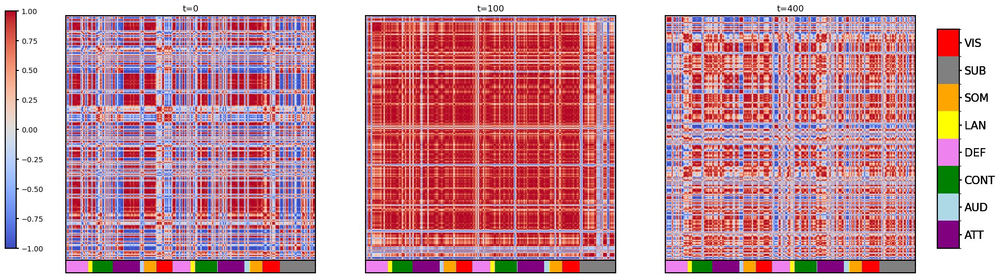

In [84]:
# Cool FC matrix plots

tp = [0,100,400] # time points I want to plot

N=int(atlas.max()) # Number of areas

dic = {}
for i,n in enumerate(np.unique(atlas_labels['super network'].to_numpy())):
    dic[n] = i

super_area_indx = [dic[a] for a in atlas_labels['super network'].to_numpy()]
super_area_indx = np.asarray(super_area_indx)

alpha=1

# Add an additional color for the first 16 elements
colors = [
          mpl.colors.to_rgba('purple',alpha), #Attention
          mpl.colors.to_rgba('lightblue',alpha), #Auditive
          mpl.colors.to_rgba('green',alpha), #Control  
          mpl.colors.to_rgba('violet',alpha),#Default
          mpl.colors.to_rgba('yellow',alpha), #Language
          mpl.colors.to_rgba('orange',alpha), #Somatomotor
          mpl.colors.to_rgba('gray', alpha),  # Subcortical
          mpl.colors.to_rgba('red',alpha), #Visual
         ]

n_bin = np.unique(list(atlas_labels['super network'])).shape[0] # Increment number of bins
cmap_name = 'my_list'
cmap = mpl.colors.LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)


# family = atlas_shafer_labels['Super Area'].to_numpy()
family = super_area_indx
# familiy = df_sorted["yeo"].to_numpy()



# Define your labels for each color
groups_labels = ["t="+str(t) for t in tp]
labels = ['ATT', 'AUD', 'CONT', 'DEF', 'LAN', 'SOM', 'SUB','VIS']

matrices = [plm_tc[t] for t in tp] # list of your matrices


vmin = min(matrix.min() for matrix in matrices)
vmax = max(matrix.max() for matrix in matrices)
vtot = max(vmax,abs(vmin))

cmap_ = plt.get_cmap('viridis')
fig, axs = plt.subplots(nrows=1, ncols=len(matrices), figsize=(21, 7))
for i in range(len(matrices)):
    # Plot the matrix
    im = axs[i].imshow(matrices[i], vmin=-vtot, vmax=vtot, cmap='coolwarm')
    axs[i].set_title(groups_labels[i])
    axs[i].set_xticks([])
    axs[i].set_yticks([])

    # Plot the family color bar at the bottom of the matrix
    cax_bottom = axs[i].inset_axes([0, -0.03, 1, 0.05])  # adjust [left, bottom, width, height] as needed
    cax_bottom.imshow(family[np.newaxis, :], aspect='auto', cmap=cmap)
    cax_bottom.set_yticks([])
    cax_bottom.set_xticks([])
    
    
    # Set the boundaries to match your data
    boundaries = [0]  # start with 0
    
    # Add the boundary for the first color
    boundaries.append(16)
    
    # Add the boundaries for the rest of the colors
    for i in range(2, n_bin+1):
        boundaries.append(boundaries[-1] + 10)
    
    # Create a color bar legend with labels
    cax_legend = fig.add_axes([0.92, 0.2, 0.02, 0.6])  # adjust [left, bottom, width, height] as needed
    norm = mpl.colors.BoundaryNorm(boundaries, cmap.N)
    cb = mpl.colorbar.ColorbarBase(cax_legend, cmap=cmap, norm=norm, 
                                   ticks=np.array(boundaries[:-1]) + np.diff(boundaries) / 2,  # set ticks at the middle of boundaries
                                   orientation='vertical')

    cb.set_ticklabels(labels, fontsize=15)  # set fontsize to desired value
    
# Add common colorbar
cbar_ax = fig.add_axes([0.07, 0.2, 0.01, 0.65]) # Adjust as necessary.
fig.colorbar(im, cax=cbar_ax, orientation='vertical')

plt.savefig('output/MD_05122023/PL_matrix.png',
            dpi=200)

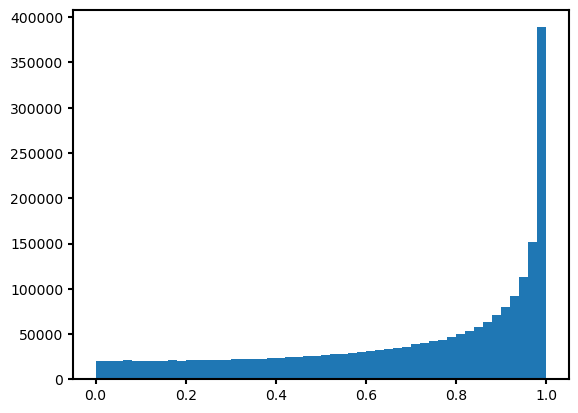

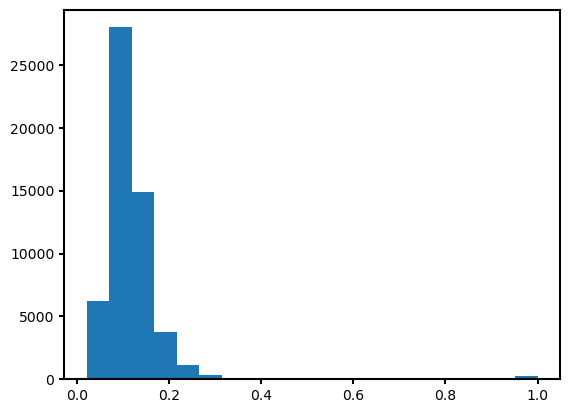

In [85]:
# The phase locking matrices assume values between -1 and 1. When I perform percolation, the threshold has to start from -1
fig = plt.figure()
plt.hist(np.abs(plm_tc[0:40]).flatten(), bins=50);
# plt.hist(np.abs(plm_tc[0:40]).mean(axis=0).flatten(), bins=50);

# PERCHè AVEVO THRESHOLDATO LE MATRICI DI PHASE LOCKING?


ex = np.copy(np.abs(plm_tc[0:600]))
ex[np.where(ex<0.99)] = 0
fig = plt.figure()
plt.hist(ex.mean(axis=0).flatten(), bins=20);

# Load eigenvector decomposition

In [18]:
# # Load eigenvectors
# path =pardir + '/data/MD_13112023/LEiDA_data.mat'
path = pardir + '/data/MD_05122023/data_V1.mat'
Ev_ = mat73.loadmat(path)

In [19]:
Ev = Ev_['data']
print(Ev.shape)

(14223, 234)


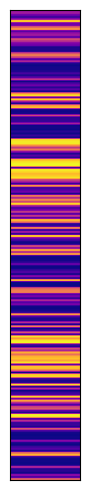

In [20]:
x = [m for m in range(Ev[200].shape[0])]
y = Ev[200]

fig, ax = plt.subplots(nrows=1, figsize=(1,5))

extent = [x[0]-(x[1]-x[0])/2., x[-1]+(x[1]-x[0])/2.,0,1]
ax.imshow(np.expand_dims(y, axis=1), cmap="plasma", aspect="auto", extent=extent)
ax.set_yticks([])
ax.set_xticks([])

ax.set_xlim(extent[0], extent[1])
plt.tight_layout()

# plt.savefig('output/GraphAnal/EigenVector_example.png', dpi=200)


## Subjects classification

In [86]:
classif = pd.read_excel(pardir+'/data/MD_05122023/davide_class_blindsight.xlsx')
# classif.drop(labels='Unnamed: 3', axis=1, inplace=True)
# new = classif['NEW ID'].values
# old = classif['OLD ID'].values
group = classif['CLASS'].values
time_points = int(time_all.shape[1]/len(group))
group_dic = {'C':0, 'B':1, 'NB':2}

groups_num = []
for idx,g in enumerate(['C', 'B', 'NB']):
    groups_num.append(np.sum(group==g))

# Group label for each time point
group_labels = np.empty((0, 1))  # [t*1]
# for c in group:
for c in group:
    cc = group_dic[c]
    sub_lab = np.full((time_points,1), cc)
    group_labels = np.concatenate((group_labels, sub_lab))
print(group_labels.shape)

# # Remove bad subjects
# new_V1 = np.empty((0, n_rois))
# for i in old:
#     m = V1[time_points*i:time_points*(i+1),:]
#     new_V1 = np.concatenate((new_V1, m))
# print(new_V1.shape)

(14223, 1)


In [89]:
classif

,NEW ID,OLD ID,FILE,CLASS,ID,gabor all,Average % correct task,Average % correct control
0,0,0,I:\func_STD\H001_rest_STD_ants.nii.gz,B,H001,NaN,100.0,NaN
1,1,1,I:\func_STD\H002_rest_STD_ants.nii.gz,NB,H002,NaN,35.0,NaN
2,2,2,I:\func_STD\H005_rest_STD_ants.nii.gz,NB,H005,NaN,60.0,NaN
3,3,3,I:\func_STD\H006_rest_STD_ants_flipped.nii.gz,NB,H006,NaN,55.0,NaN
4,4,4,I:\func_STD\H008_rest_STD_ants_flipped.nii.gz,B,H008,NaN,85.0,NaN
5,5,5,I:\func_STD\H009_rest_STD_ants.nii.gz,NB,H009,NaN,55.0,NaN
6,6,6,I:\func_STD\H010_rest_STD_ants_flipped.nii.gz,NB,H010,NaN,65.0,NaN
7,7,7,I:\func_STD\R006_rest_STD_ants.nii.gz,NB,R006,NaN,40.0,NaN
8,10,8,I:\func_STD\R011_rest_STD_ants.nii.gz,NB,R011,NaN,65.0,NaN
9,11,9,I:\func_STD\R013_rest_STD_ants_flipped.nii.gz,NB,R013,NaN,45.0,NaN


In [87]:
time_all.shape[1]/33

431.0

In [88]:
np.sum(classif['CLASS']=='B'), np.sum(classif['CLASS']=='NB'), np.sum(classif['CLASS']=='C')  

(8, 8, 17)

# Load K-means results

In [21]:
# state_labels
path = pardir + '/data/MD_05122023/clustering_res.mat'
kmeans_leida_ = mat73.loadmat(path)
print(kmeans_leida_.keys())
kmeans_leida = kmeans_leida_['Kmeans_results']
# kmeans_leida = kmeans_leida_['Kmeans_results']
K_max = len(kmeans_leida) + 3
print(kmeans_leida[0].keys())

dict_keys(['Kmeans_results', 'fuzzy_results', 'fuzzy_results_clean', 'mal_dist_kmean'])
dict_keys(['C', 'D', 'IDX', 'SUMD'])


In [21]:
# K = 6
# k = K - 2 # MD start to cluster from K=2
# # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
# state_labels = kmeans_leida[k]['IDX']
# print(state_labels.shape, state_labels.max())
# centroids = kmeans_leida[k]['centers']
# print(centroids.shape)

## Clustering representation

In [53]:
for K in range(3,13):
    k = K - 3
    # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
    state_labels = kmeans_leida[k]['IDX']
    centroids = kmeans_leida[k]['centers']
    
    # PLot CENTROIDS
    fig, axs = plt.subplots(1,K,figsize=(6,3))
    for i in range(K):
        axs[i].set_title('STATE {}' .format(i+1), fontsize=15)
        axs[i].barh(range(centroids[i].shape[0]), -centroids[i], height=1);
    #              tick_label=nodes_labels)
        axs[i].set_xticks([])
        axs[i].set_yticks([])
        axs[0].set_ylabel('ROIs', fontsize=15)
    fig.tight_layout()   
    
    # plt.savefig('output/GraphAnal/CentroidsRepresentation.png', dpi=200)

KeyError: 'centers'

In [ ]:
# Plot the little brains



In [109]:
k_ = 4
neg = np.copy(centroids[k_])
neg[np.where(-centroids[k_]>0)] = 0
pos = np.copy(centroids[k_])
pos[np.where(-centroids[k_]<0)] = 0

In [111]:
centroids.shape

(6, 234)

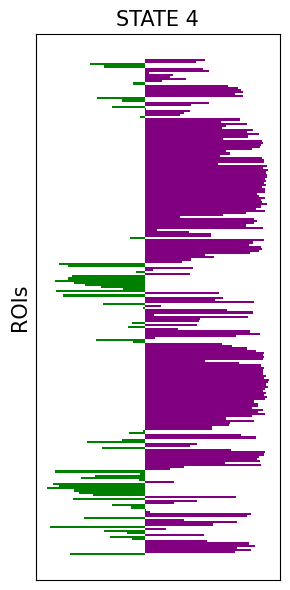

In [112]:
today = date.today()
DATE = today.strftime("%d%m%Y")
# checking if the directory exists or not
if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
    # if the demo_folder directory is not present 
    # then create it.
    os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

# PLot CENTROIDS
fig, ax = plt.subplots(1,figsize=(3,6))
k_ = 4 - 1
ax.set_title('STATE {}' .format(k_+1), fontsize=15)
# ax.barh(range(centroids[k_].shape[0]), -centroids[k_], height=1);
# #              tick_label=nodes_labels)
ax.barh(range(centroids[k_].shape[0]), -neg, height=1, color='green');
ax.barh(range(centroids[k_].shape[0]), -pos, height=1, color='purple');
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylabel('ROIs', fontsize=15)
fig.tight_layout()   

# plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/CentroidsEx_'+DATE+'.png',
#             dpi=200)

In [113]:
state_labels

array([2., 2., 2., ..., 6., 6., 5.])

In [156]:
# C_embedded = TSNE(n_components=3, learning_rate='auto',
#                   init='random', perplexity=2).fit_transform(centroids)

In [155]:
# # from sklearn.manifold import TSNE
# # X_embedded = TSNE(n_components=3, learning_rate='auto',
# #                   init='random', perplexity=3).fit_transform(Ev)

# fig = plt.figure(figsize=(8,7))
# ax = fig.add_subplot(projection='3d')
# ax.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], s=0.4, alpha=.5, c=state_labels)
# ax.scatter(C_embedded[:,0], C_embedded[:,1], C_embedded[:,2], s=1, alpha=1, c='red')


In [28]:
import matplotlib as mpl

#normalize item number values to colormap
norm = mpl.colors.Normalize(vmin=0, vmax=K)

#colormap possible values = viridis, jet, spectral
colors = [ mpl.cm.nipy_spectral(norm(i)) for i in range(K)] 
colors_dic = {}
for i in range(K):
    colors_dic[i] = colors[i]
colors_series = [colors_dic[tp-1] for tp in state_labels]
    
# colors = 'blue','green','red','black'

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

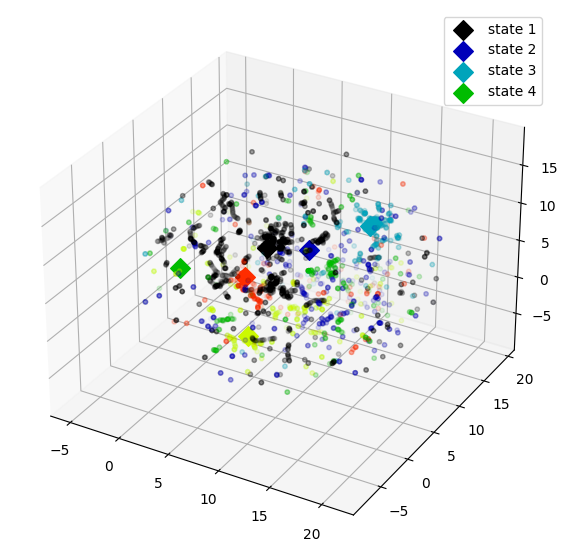

In [29]:
# import umap
fit = umap.UMAP(n_components=3)
X_embedded = fit.fit_transform(Ev, state_labels)
C_embedded = fit.transform(centroids)

# pca = sklearn.decomposition.PCA(n_components=3)
# X_embedded = pca.fit_transform(Ev)
# C_embedded = pca.transform(centroids)

lab = ['state 1', 'state 2', 'state 3','state 4']


# 3D
fig = plt.figure(figsize=(8,7))
ax = fig.add_subplot(projection='3d')
for i in range(K):
    ax.scatter3D(C_embedded[i,0], C_embedded[i,1], C_embedded[i,2], s=100, alpha=1, c=colors[i], marker='D')
plt.legend(lab)
ax.scatter(X_embedded[:,0], X_embedded[:,1], X_embedded[:,2], s=10, alpha=.03, c=colors_series)


# # 2D
# fig = plt.figure(figsize=(8,7))
# for i in range(K):
#     plt.scatter(C_embedded[i,0], C_embedded[i,1], s=80, alpha=1, c=colors[i])
# plt.legend(lab)
# plt.scatter(X_embedded[:,0], X_embedded[:,1], s=1, alpha=.3, c=state_labels, cmap='jet')

# plt.savefig('output/GraphAnal/tp_representation_PCA.png', dpi=200)

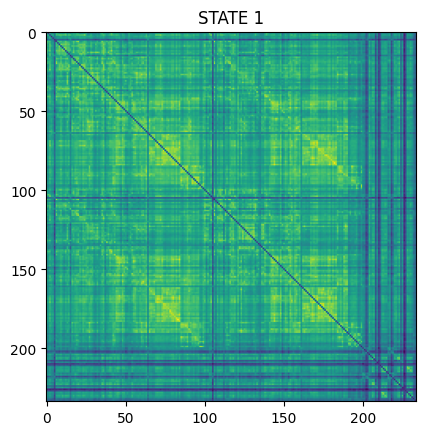

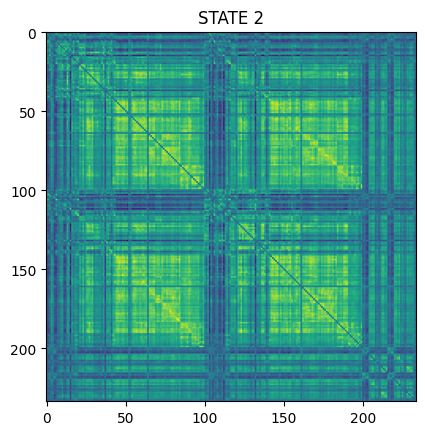

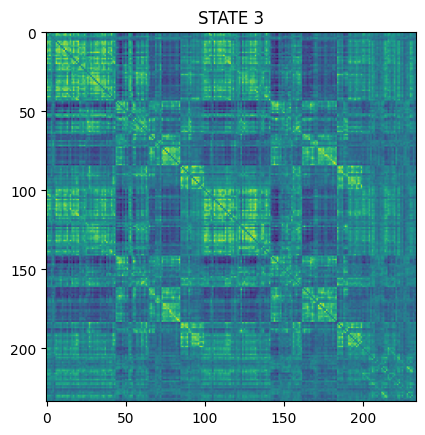

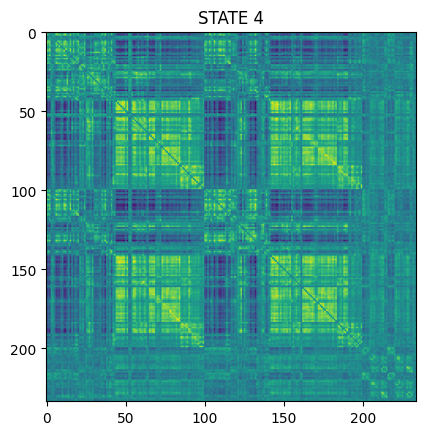

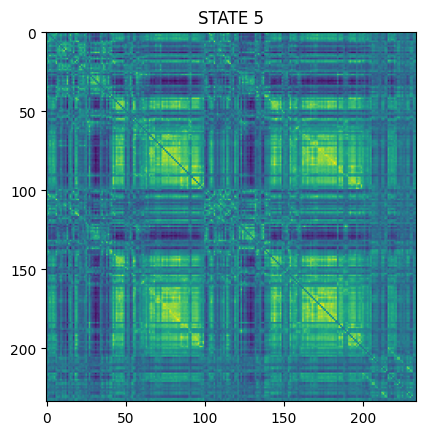

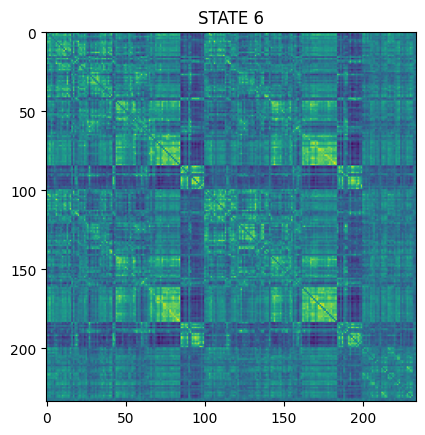

In [771]:
for i in range(K):
    fig = plt.figure()
    whe = np.where(state_labels==i+1)
    plt.imshow(np.mean(plm_tc[whe], axis=0))
    plt.title('STATE '+str(i+1))
    plt.savefig('output/GraphAnal/26092023/K'+str(K)+'/Average_PL_K'+str(i+1)+'.png', dpi=200)

In [22]:
atlas_labels[:20]

,from,side,network,area,a_idx,n_area
0,17networks,LH,DefaultA,IPL,1.0,DefaultA-IPL
1,17networks,LH,DefaultA,PFCm,1.0,DefaultA-PFCm
2,17networks,LH,DefaultA,Temp,1.0,DefaultA-Temp
3,17networks,LH,DefaultA,Temp,2.0,DefaultA-Temp
4,17networks,LH,DefaultA,TempPole,1.0,DefaultA-TempPole
5,17networks,LH,DefaultA,TempPole,2.0,DefaultA-TempPole
6,17networks,LH,DefaultA,pCunPCC,1.0,DefaultA-pCunPCC
7,17networks,LH,DefaultB,FPole,1.0,DefaultB-FPole
8,17networks,LH,DefaultB,IPL,1.0,DefaultB-IPL
9,17networks,LH,DefaultB,IPL,2.0,DefaultB-IPL


# Plot vectors and distance

In [57]:
Ev.shape
pca = PCA(n_components=3)
Ev_pca = pca.fit_transform(Ev)
print(Ev_pca.shape)

(14223, 3)


2  STATE


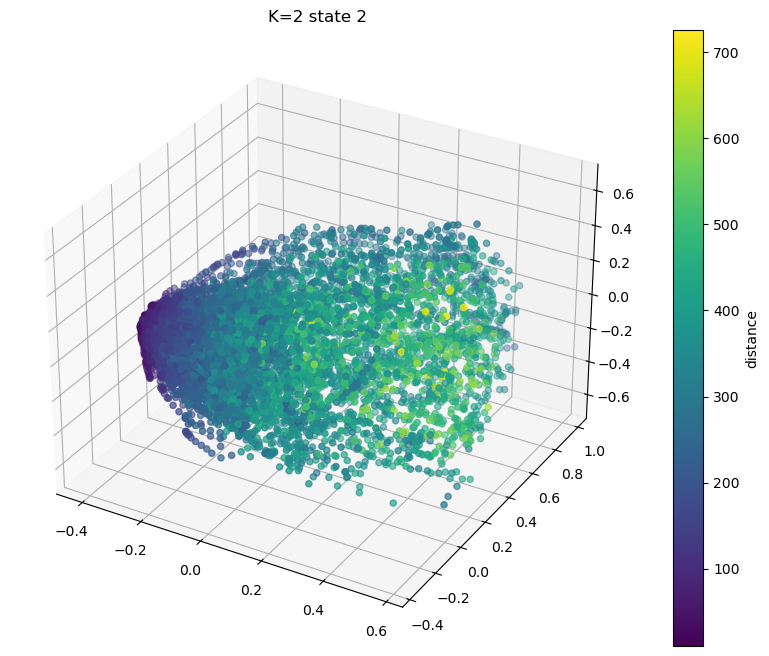

In [79]:
for k_,mal_dist in enumerate(mal_dist_kmean): # Loop over number of states
    print(k_+2, ' STATE')
    # mal_dist is a dict: 'IDX' represent the state of each time point, 'raw' represent the the distance of each time
    # point (grouped by state) from it's centroid.
    for s_i,s in enumerate(mal_dist['raw']): # Loop over the states
        idx = s['kind'].astype(int)
        idx = [m-1 for m in idx]
        dist = s['k'].astype(int)
        fig = plt.figure(figsize=(12,8))
        ax = fig.add_subplot(projection='3d')
        im = ax.scatter(Ev_pca[idx][:,0], Ev_pca[idx][:,1], Ev_pca[idx][:,2], c=dist)
        ax.set_title('K='+str(k_+2)+' state '+str(s_i+2))
        plt.colorbar(im, ax=ax, label='distance')
        plt.savefig('output/MD_05122023/dist_representation_K'+str(i+2)+'_state'+str(s_i+1)+'.png', dpi=200)
        break
    break



In [43]:
idx

array([706])

# Chose a threshold for Mahalanobis distance

In [54]:
mal_dist_kmean = kmeans_leida_['mal_dist_kmean'] # List with 9 elements, k from 2 to 10
kmean_res = kmeans_leida_['Kmeans_results']

In [30]:
%%time
thresholds = [0,1,2]
silhouette_allstates = []
n_of_vec_allstates = []
thresholds_allstates = []
n_of_vec_perstate_allstates = []
for k_,mal_dist in enumerate(mal_dist_kmean): # Loop over number of states
    print(k_+2, ' STATE')
    # mal_dist is a dict: 'IDX' represent the state of each time point, 'raw' represent the the distance of each time
    # point (grouped by state) from it's centroid.

    # COMPUTE THE RANGE FOR THE DISTANCE THRESHOLD
    max = 0
    min = 10000000
    for s in mal_dist['raw']: # Loop over the states
        # print(len(s['k']))
        if s['k'].max() > max:
            max = s['k'].max()
        if s['k'].min() < min:
            min = s['k'].min()
        # print(s['k'].shape, max,min)

    # DEFINE THRESHOLD VALUES
    n = 1000
    thresholds_ = np.linspace(min,max,n)[::-1]
    silhouette = []
    n_of_vec = []
    n_of_vec_perstate = []
    thresholds = []
    empty_state = False
    for pi,thresh in enumerate(thresholds_):
        if pi%100==0:
            print(pi, '/'+str(n))
        idx = np.empty((0,), dtype=np.dtype(int)) # I have to concatenate together the idexes of each state
        state_idx = np.empty((0,), dtype=np.dtype(int))
        perstate = [] # number of vec left in each state
        for s_i,s in enumerate(mal_dist['raw']): # Loop over the states
            pos = np.where(s['k']<thresh)[0] # which points have a distance below the thresholds
            idx_ = s['kind'][pos].astype(int) # Indx of the tp with respect to the concatenated indexing
            idx_ = [m-1 for m in idx_] # -1 Because indexing in s['kind'] start from 1
            state_idx_ = mal_dist['IDX'][idx_].astype(int) # state index of the points (eigenvectors) below the threshold
            # print(np.asarray(idx_).shape, state_idx_.shape)
            if len(idx_)!=0:
                idx = np.concatenate((idx, idx_), dtype=np.dtype(int))
                state_idx = np.concatenate((state_idx, state_idx_), dtype=np.dtype(int))
                perstate.append(state_idx_.shape)
            else:
                empty_state = True
        # print(idx.shape, state_idx.shape)

        # compute silhouette score
        if not empty_state:
            silhouette.append(silhouette_score(Ev[idx], state_idx))
            n_of_vec.append(idx.shape[0])
            thresholds.append(thresh)
            n_of_vec_perstate.append(perstate)
        else:
            break
            # When I reach a threshold which empty at least a state I step to explores the threshold values

    silhouette_allstates.append(silhouette)
    n_of_vec_allstates.append(n_of_vec)
    thresholds_allstates.append(thresholds)
    n_of_vec_perstate_allstates.append(n_of_vec_perstate)
    # print('\n')

2  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
3  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
4  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
5  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
6  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
900 /1000
7  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
900 /1000
8  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
900 /1000
9  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
900 /1000
10  STATE
0 /1000
100 /1000
200 /1000
300 /1000
400 /1000
500 /1000
600 /1000
700 /1000
800 /1000
900 /1000
CPU times: user 10h 44min, sys: 1d 23h 57min 19s, total: 2d 10h 41min 19s
Wa

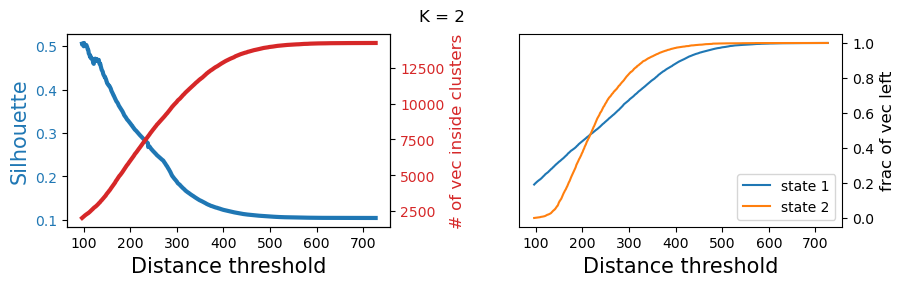

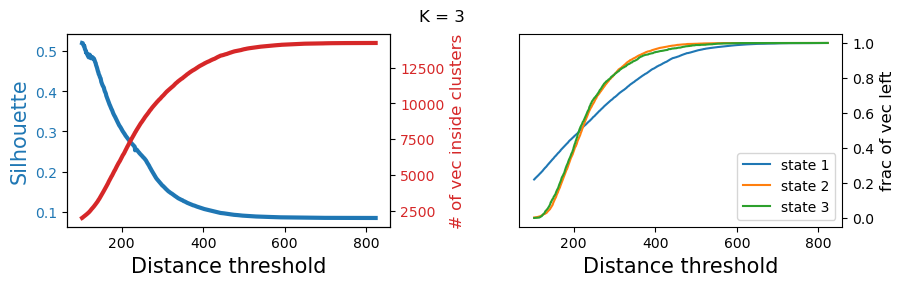

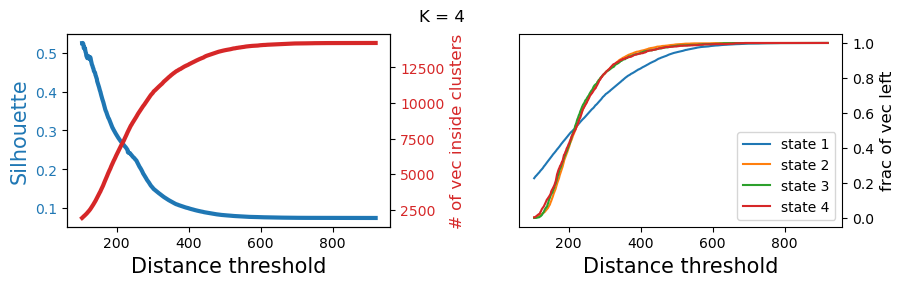

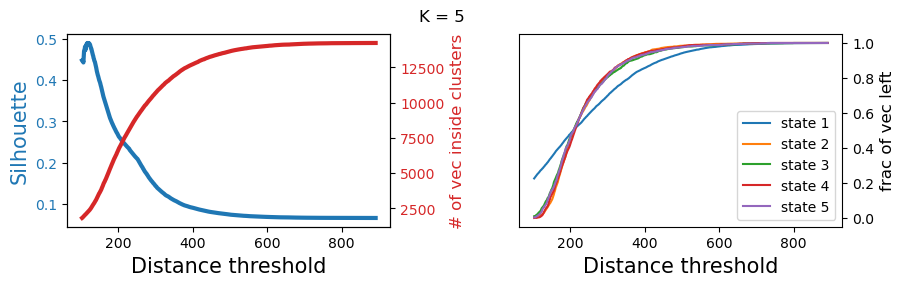

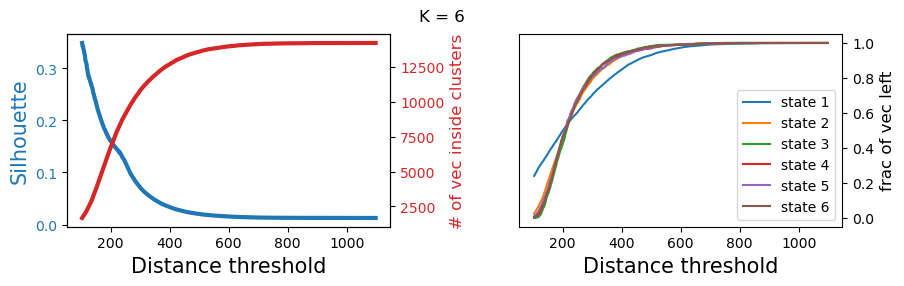

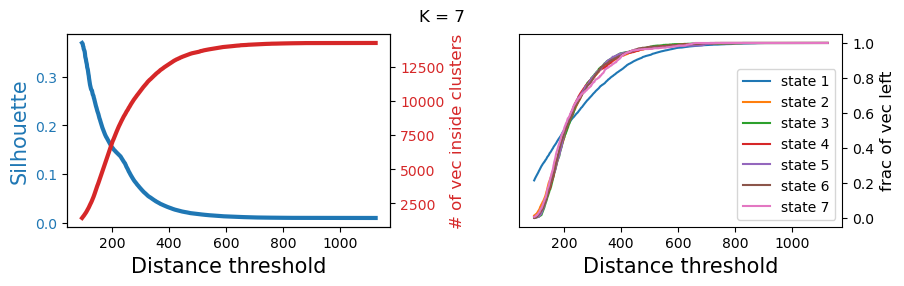

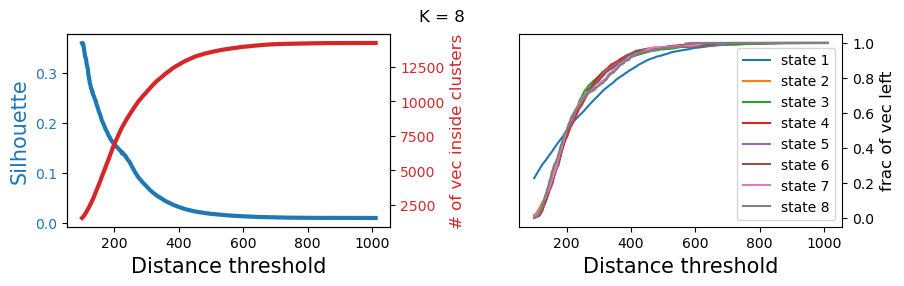

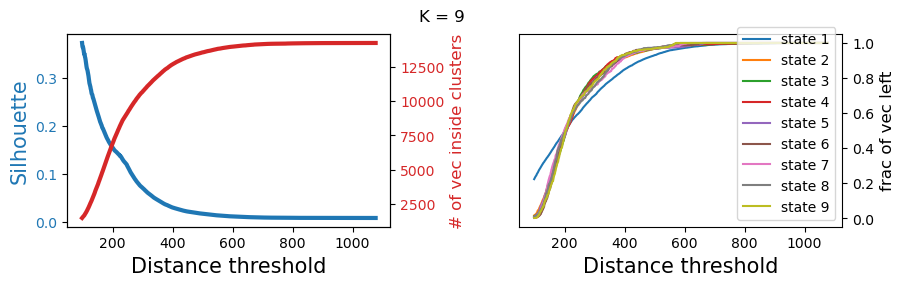

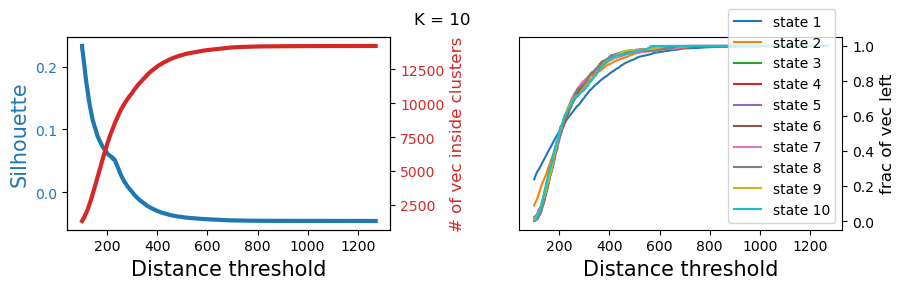

In [103]:
for i, thresholds in enumerate(thresholds_allstates):
    fig, (ax1, ax3) = plt.subplots(1,2, figsize=(10,2.5))
    plt.suptitle('K = '+str(i+2))
    ax1.plot(thresholds, silhouette_allstates[i], color='tab:blue', linewidth=3)
    ax1.set_ylabel('Silhouette', fontsize=15, color='tab:blue')
    ax1.tick_params(axis='y', labelcolor='tab:blue')
    ax2 = ax1.twinx()
    ax2.plot(thresholds, n_of_vec_allstates[i], color='tab:red', linewidth=3)
    # ax2.invert_yaxis()
    ax2.set_ylabel('# of vec inside clusters', fontsize=12, color='tab:red')
    ax2.tick_params(axis='y', labelcolor='tab:red')
    ax1.set_xlabel('Distance threshold', fontsize=15)

    for k__,n_of_vec_perstate in enumerate(np.asarray(n_of_vec_perstate_allstates[i])[:,:,0].transpose()):
        ax3.plot(thresholds, n_of_vec_perstate/n_of_vec_perstate[0], label='state '+str(k__+1))
    ax3.set_xlabel('Distance threshold', fontsize=15)
    ax3.set_ylabel('frac of vec left', fontsize=12)
    ax3.yaxis.tick_right()
    ax3.yaxis.set_label_position("right")
    ax3.legend(loc='lower right')
    plt.subplots_adjust( 
                        wspace=0.4, 
                        hspace=0.4)
        
    # fig.tight_layout

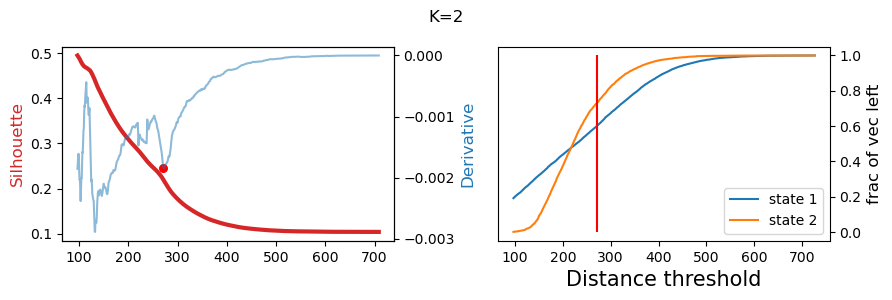

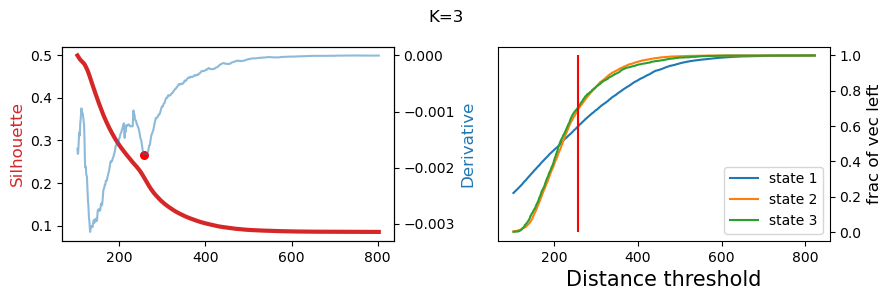

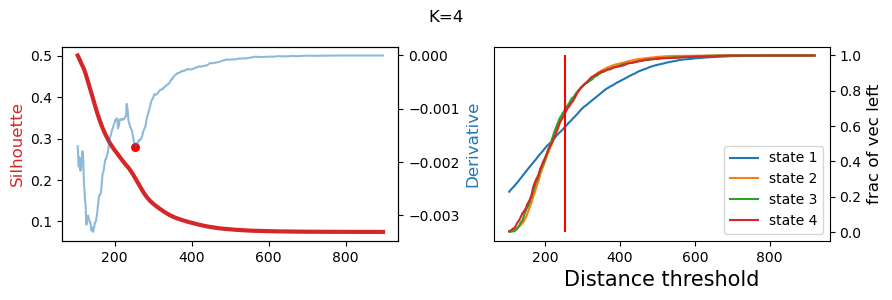

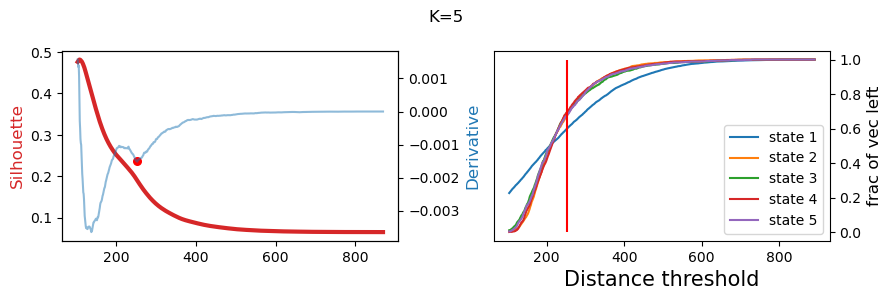

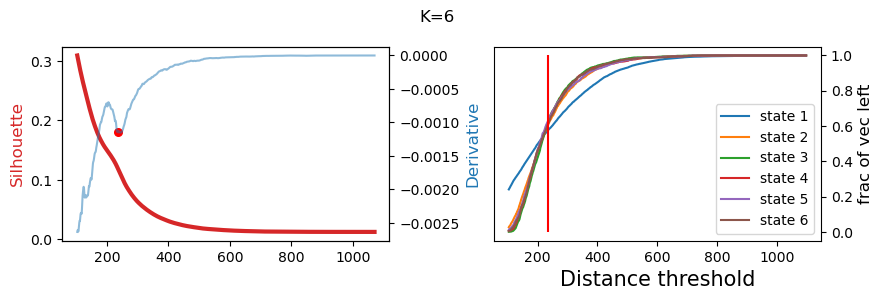

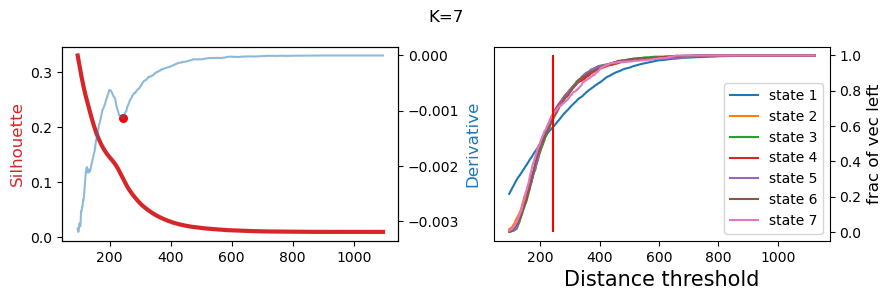

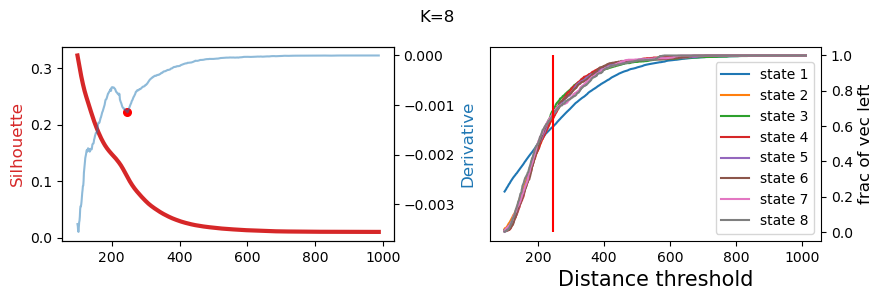

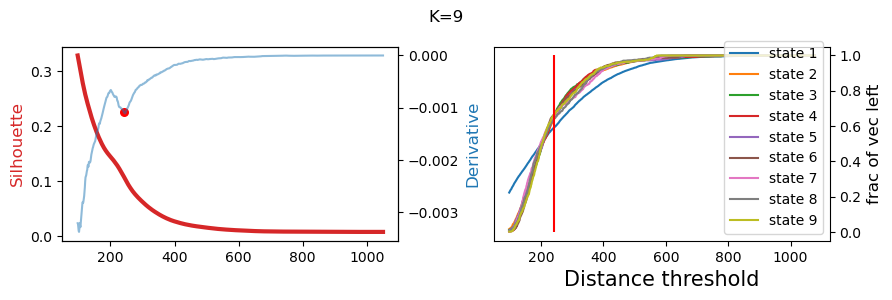

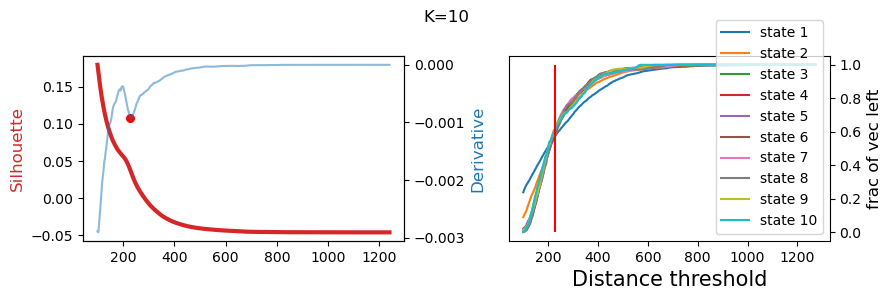

In [111]:
# Compute the optimal threshold
# Maybe it's better if I smooth the silhouette curve before
tol = 0.00001
win = 25
opt_threshes = []
for i, thresholds in enumerate(thresholds_allstates):
    x = thresholds
    y = silhouette_allstates[i] # curves
    x_, y_smooth = mov_av_smooth(x, y, win)
    dydx = np.gradient(y_smooth, x_) # first derivative
    # d2ydx2 = np.gradient(dydx, x) # second derivative
    # x_,dydx_ = mov_av_smooth(x, dydx, win) # smoothed first derivative
    # d2ydx2_ = np.gradient(dydx_, x_) # derivative of the smoothed first derivative

    x_min, y_min = find_the_min(x_,dydx, tol)
    opt_threshes.append(x_min)

    # fig = plt.figure()
    # plt.plot(x,y)
    # plt.plot(x_, y_smooth)
    
    fig,axs = plt.subplots(1,2, figsize=(9,3))
    fig.suptitle('K='+str(i+2))
    axs[0].plot(x_,y_smooth, color='tab:red', linewidth=3)
    # axs.plot(x_,dydx_, linewidth=2, color='tab:blue')
    axs[0].set_ylabel('Silhouette', fontsize=12, color='tab:red')
    ax = axs[0].twinx()
    ax.plot(x_, dydx, alpha=0.5)
    ax.set_ylabel('Derivative', fontsize=12, color='tab:blue')
    ax.set_xlabel('Threshold', fontsize=12)
    ax.scatter(x_min, y_min, s=30, color='r')
    # axs.plot(x,d2ydx2, alpha=0.5)
    # axs.plot(x_,d2ydx2_, linewidth=2, color='tab:blue')
    plt.tight_layout()
    # plt.savefig('output/MD_05122023/dist_thresh_sil_K'+str(i+2)+'_state.png',
    #             dpi=200)

    for k__,n_of_vec_perstate in enumerate(np.asarray(n_of_vec_perstate_allstates[i])[:,:,0].transpose()):
        axs[1].plot(thresholds, n_of_vec_perstate/n_of_vec_perstate[0], label='state '+str(k__+1))
    axs[1].set_xlabel('Distance threshold', fontsize=15)
    axs[1].set_ylabel('frac of vec left', fontsize=12)
    axs[1].yaxis.tick_right()
    axs[1].yaxis.set_label_position("right")
    axs[1].legend(loc='lower right')
    axs[1].vlines(x_min, 0,1, color='r')
    plt.subplots_adjust( 
                        wspace=0.4, 
                        hspace=0.4)

    plt.tight_layout(pad=1.0)

    plt.savefig('output/MD_05122023/dist_thresh_sil_K'+str(i+2)+'_state_with_frac.png',
                dpi=200)
# with open('output/MD_05122023/dist_opt_threshes_n'+str(n)+'.pickle', 'wb') as handle:
#     pickle.dump(opt_threshes, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [55]:
with open('output/MD_05122023/dist_opt_threshes_n1000.pickle', 'rb') as handle:
    opt_threshes = pickle.load(handle)

In [56]:
# Define new state indexes, with points above the threshold assigned to the baseline state
state_labels_list = [] # State indexes for each state
for k_,mal_dist in enumerate(mal_dist_kmean): # Loop over number of states
    thresh = opt_threshes[k_]
    idx = np.empty((0,))
    for s_i,s in enumerate(mal_dist['raw']): # Loop over the states
        pos = np.where(s['k']>thresh)[0] # which points have a dist above the thresholds - they become part of the baseline state
        idx_ = s['kind'][pos].astype(int) # Indx of the tp with respect to the concatenated indexing
        idx_ = [int(m-1) for m in idx_] # -1 Because indexing in s['kind'] start from 1
        idx = np.concatenate((idx_, idx), axis=0)
    # print(np.asarray(idx).astype(int).shape)
    # print(np.unique(k['IDX']))
    state_idx = np.array([s for s in kmean_res[k_]['IDX']]) # state index
    state_idx[np.array(idx).astype(int)] = 0
    # print(np.unique(state_idx))
    state_labels_list.append(state_idx)

# Comparison between centroids among different K (of the K-means)

## Comparison between centroids among different K (of the K-means)

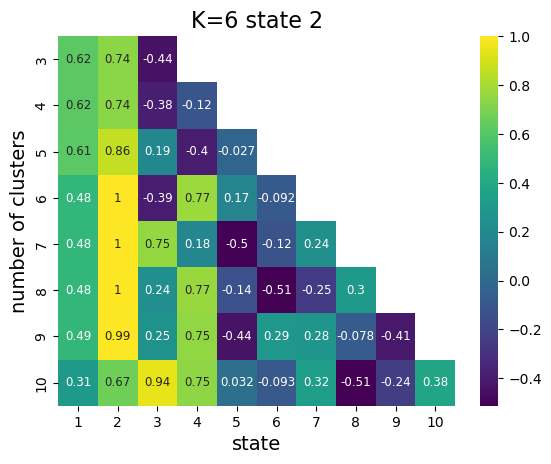

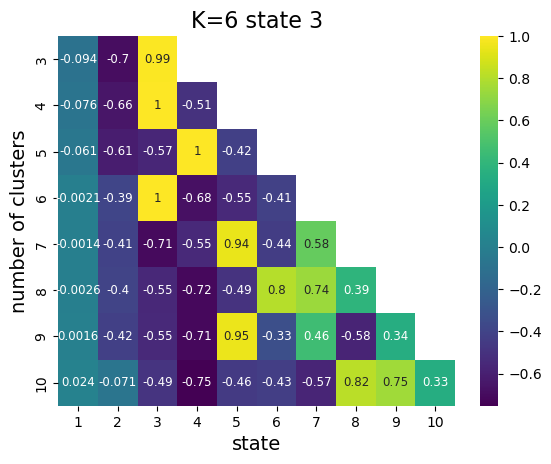

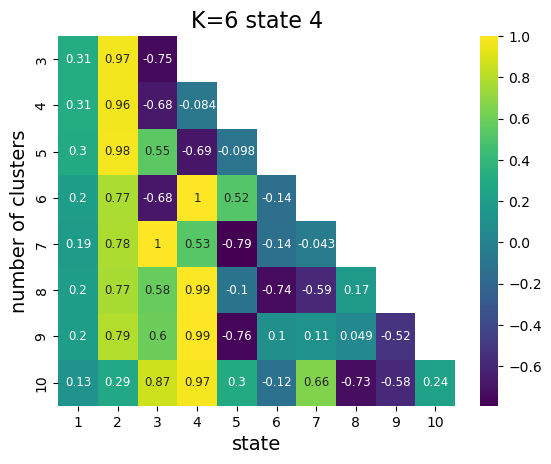

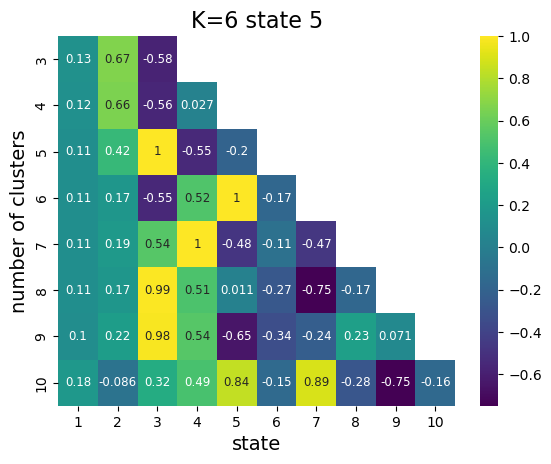

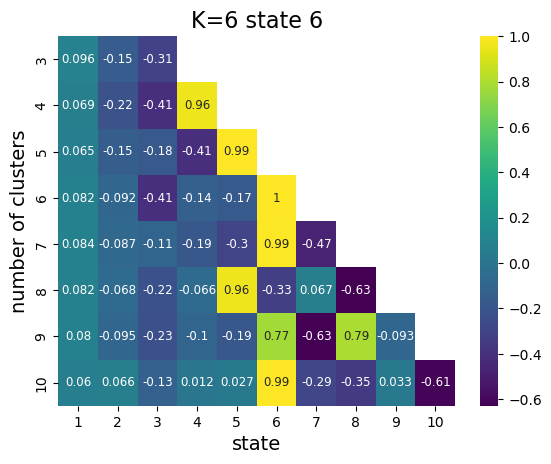

In [180]:
# I take the centroids for K=4 because they seems to be present in all the K clusterings
my_k = 6
centr_4 = kmeans_leida[my_k-2]['C']

K_max = 10


# for iii,c in enumerate(centr_4[1:]): # Loop over the centroids for K=4 (exluding the global signal state)
#     corr_m = np.full((7,10), np.nan)
#     i_ = 0 # the real counter
#     for i,k in enumerate(range(1,K_max-1)): # Loop over the K
#         if i!= my_k-3:
#             centroids = kmeans_leida[k]['C'] # centroids for the current K
#             for c_i,c_ in enumerate(centroids):
#                 corr_m[i_,c_i] = pearsonr(c,c_)[0]
#             i_ += 1
    
#     y_t = [y for y in range(3,10+1) if y!=my_k]
#     x_t = [x+1 for x in range(10)]
#     fig = plt.figure()
#     sns.heatmap(corr_m, xticklabels=x_t, yticklabels=y_t, annot=True, cmap='viridis',annot_kws={'fontsize':8.5})
#     plt.title('K='+str(my_k)+' state '+str(iii+2), fontsize=16)
#     plt.ylabel('number of clusters', fontsize=14)
#     plt.xlabel('state', fontsize=14)

#     plt.savefig('output/MD_05122023/corr_betw_centroids_K'+str(my_k)+'_state'+str(iii+2)+'.png',
#                 dpi=200)


# NOT REMOVING THE ROW OF THE CHOSEN K
for iii,c in enumerate(centr_4[1:]): # Loop over the centroids for K=4 (exluding the global signal state)
    corr_m = np.full((8,10), np.nan)
    i_ = 0 # the real counter
    for i,k in enumerate(range(1,K_max-1)): # Loop over the K
        centroids = kmeans_leida[k]['C'] # centroids for the current K
        for c_i,c_ in enumerate(centroids):
            corr_m[i_,c_i] = pearsonr(c,c_)[0]
        i_ += 1
    
    y_t = [y for y in range(3,10+1)]
    x_t = [x+1 for x in range(10)]
    fig = plt.figure()
    sns.heatmap(corr_m, xticklabels=x_t, yticklabels=y_t, annot=True, cmap='viridis',annot_kws={'fontsize':8.5})
    plt.title('K='+str(my_k)+' state '+str(iii+2), fontsize=16)
    plt.ylabel('number of clusters', fontsize=14)
    plt.xlabel('state', fontsize=14)

    # plt.savefig('output/MD_05122023/corr_betw_centroids_K'+str(my_k)+'_state'+str(iii+2)+'.png',
    #             dpi=200)

## Comparison at fixed K: similarity among mean EV belonging to different states

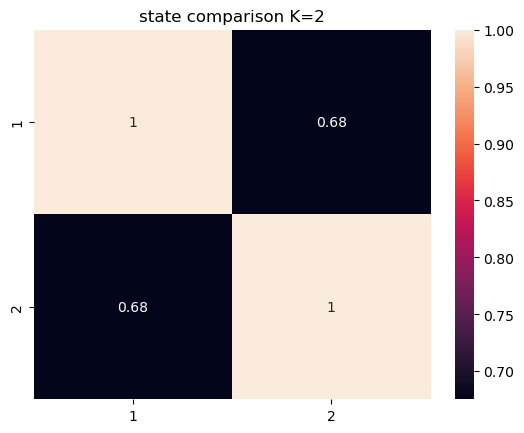

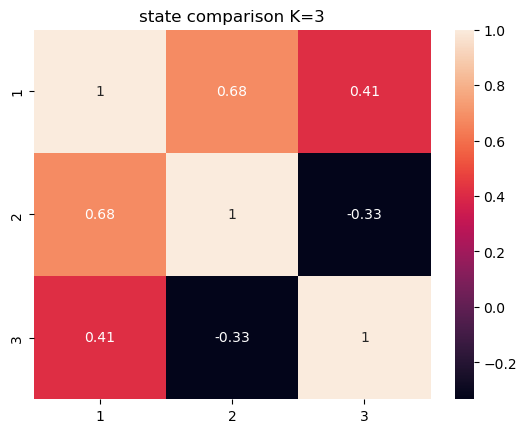

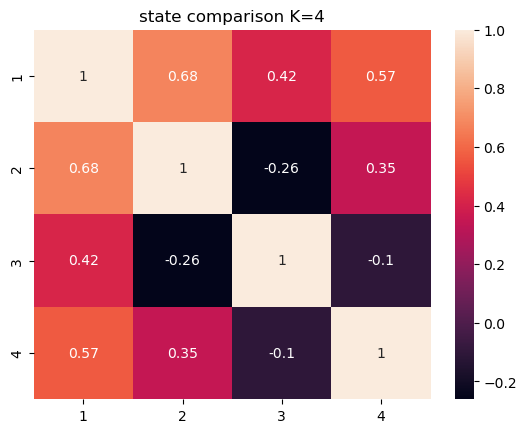

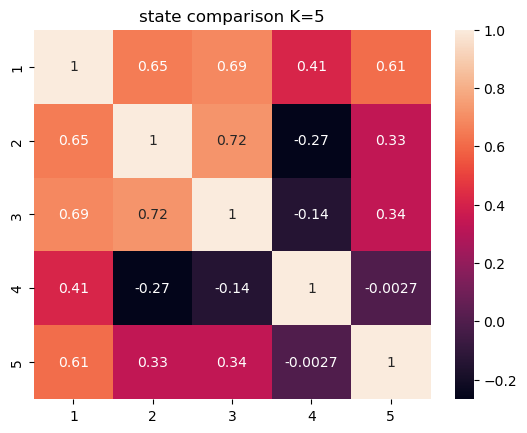

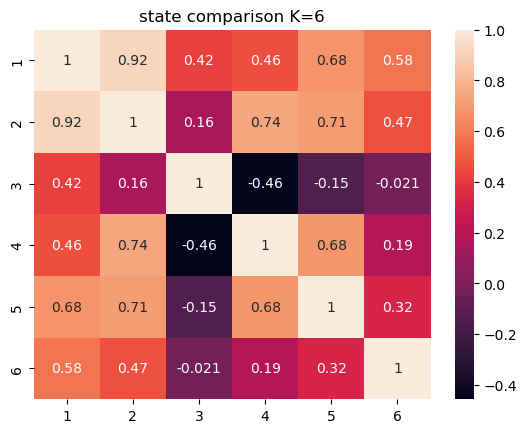

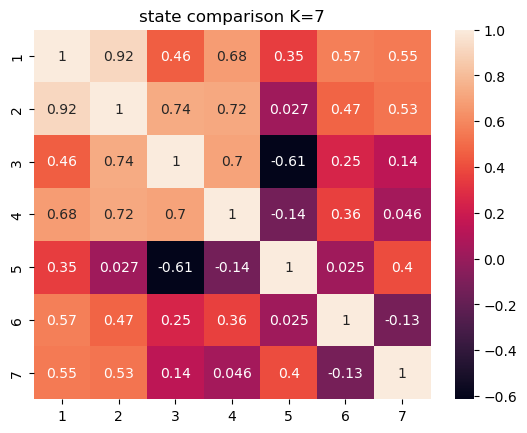

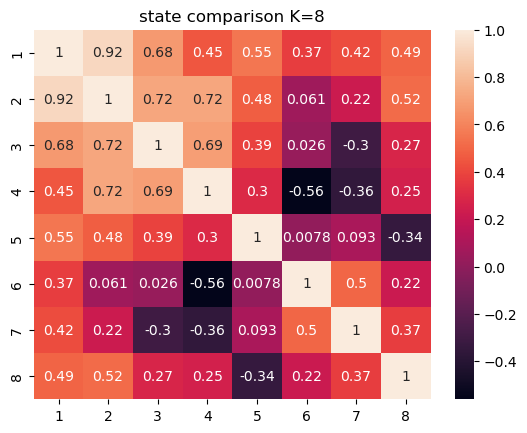

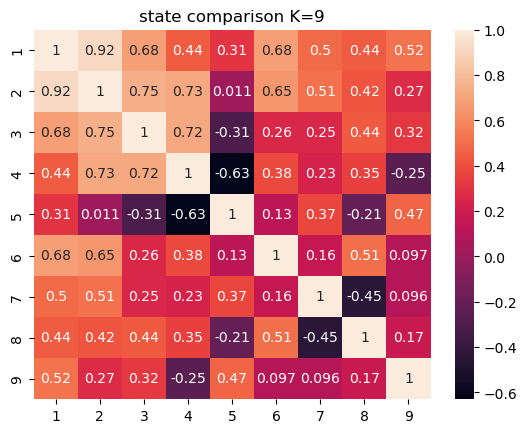

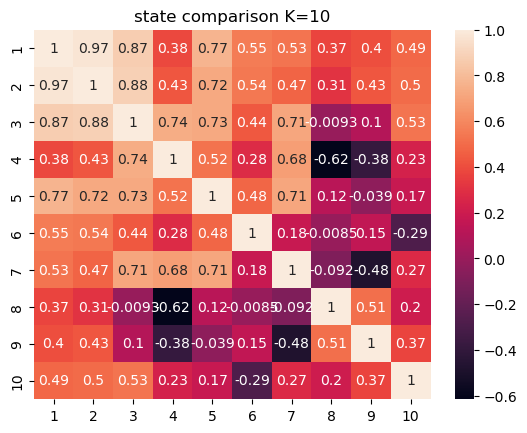

In [34]:
import warnings
warnings.filterwarnings('ignore')

for K in range(2,10+1):
    k = K - 2 # MD start to cluster from K=2
    state_labels = state_labels_list[k]
    states = []
    for s in range(1,K+1):
        states.append(Ev[np.where(state_labels==s)].mean(axis=0))
    sim_mat = np.empty((K,K))
    for i in range(K):
        for j in range(K):
            # print(states[i].shape, states[j].shape)
            sim_mat[i,j] = cosine_similarity(states[i].reshape(1, -1), states[j].reshape(1, -1))
    fig = plt.figure()
    tick = [t+1 for t in range(K)]
    sns.heatmap(sim_mat, annot=True, xticklabels=tick, yticklabels=tick)
    plt.title('state comparison K='+str(K))

    plt.savefig('output/MD_05122023/state_sim_K'+str(K)+'.png',
                dpi=200)     

In [61]:
Ev.shape

(14223, 234)

In [62]:
state_labels_list

[array([0., 0., 0., ..., 1., 0., 0.]),
 array([0., 0., 0., ..., 0., 0., 0.]),
 array([0., 0., 0., ..., 4., 0., 0.]),
 array([0., 0., 0., ..., 5., 0., 0.]),
 array([0., 0., 0., ..., 6., 0., 0.]),
 array([0., 0., 0., ..., 6., 0., 0.]),
 array([0., 0., 0., ..., 5., 0., 0.]),
 array([0., 0., 0., ..., 6., 0., 0.]),
 array([0., 0., 0., ..., 6., 0., 0.])]

# Goodness of clustering: inter-pattern correlation variance

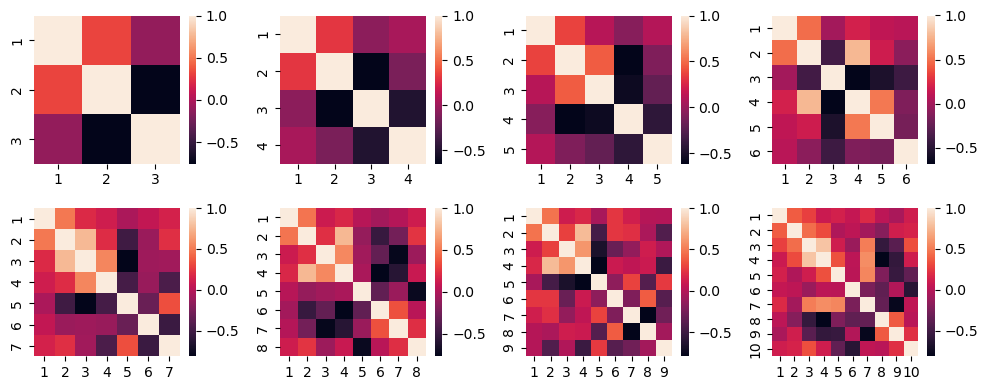

In [54]:
fig,axs = plt.subplots(2,4, figsize=(10,4))
corr_mats = []
for idx,ax in enumerate(axs.flat):
    results = kmeans_leida[idx+1]
    # Compute correlation between centroids of each K
    centrs = results['C'] # centroids
    corr_mat = np.empty((centrs.shape[0],centrs.shape[0]))# Init the corr matrix
    for i in range(centrs.shape[0]):
        for j in range(centrs.shape[0]):
            corr_mat[i,j] = pearsonr(centrs[i], centrs[j])[0]
    tick = [t+1 for t in range(centrs.shape[0])]
    sns.heatmap(corr_mat, ax=ax, xticklabels=tick, yticklabels=tick)
    corr_mats.append(corr_mat)
plt.tight_layout()

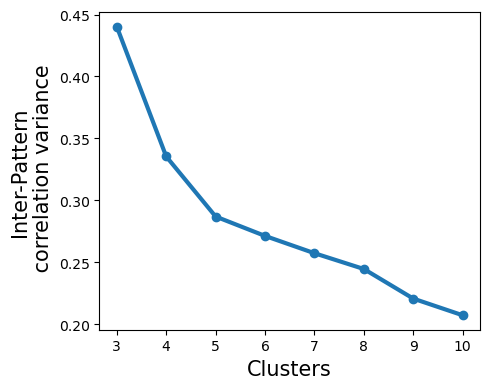

In [102]:
vars = [m.var() for m in corr_mats]
x = [i+3 for i in range(len(corr_mats))]
fig, ax = plt.subplots(1, figsize=(5,4))
ax.plot(x,vars, '-o', linewidth=3)
ax.set_xlabel('Clusters', fontsize=15)
ax.set_ylabel('Inter-Pattern\n correlation variance', fontsize=15)
plt.tight_layout()
plt.savefig('output/MD_05122023/clust_met_ipcv.png',
            dpi=200)

# Goodness of clustering: silhouette

### I use the optimal distance threshold for each K found before

In [60]:
def wcss(points, centroids, state_idx):
    unique_labels = np.unique(state_idx)
    # print(unique_labels)
    sum_sq_distance = 0
    for idx, C in enumerate(unique_labels):
        c = centroids[idx]
        for p in points[np.where(state_idx==C)]:
            sum_sq_distance += norm(p - c)**2
            
    return sum_sq_distance

In [94]:
# Silhouette score evaluation

K_max = 10
silhouettes = []
wcss_ = []
for i,k in enumerate(range(2,K_max+1)):
    print('State '+str(k))
    state_idx = state_labels_list[i]

    state_idx_nobase = np.where(state_idx!=0) # Remove the baseline state to compute silhouette score

    state_v = Ev[state_idx_nobase]
    # sub_samp = random.sample([i for i in range(state_v.shape[0])], n)
    sil = silhouette_score(state_v, state_idx[state_idx_nobase])
    # sil = silhouette_score(Ev, state_idx)
    silhouettes.append(sil)
    
    # Sum of Square Distance
    centroids = kmean_leida[i]['C']
    wcss_.append(wcss(state_v, centroids, state_idx[state_idx_nobase]))
    

State 2
State 3
State 4
State 5
State 6
State 7
State 8
State 9
State 10


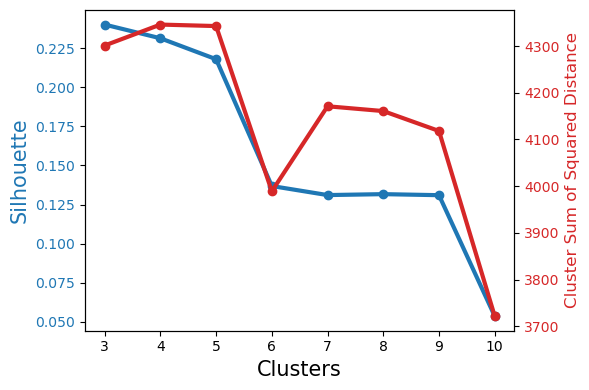

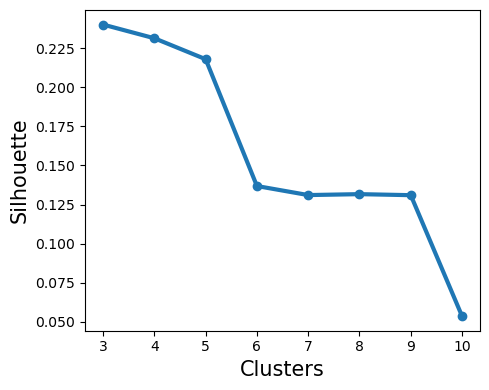

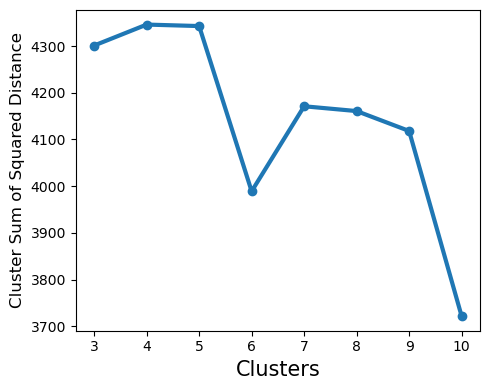

In [99]:
today = date.today()
DATE = today.strftime("%d%m%Y")
# checking if the directory exists or not

metricz = [silhouettes, wcss_]
x = [k for k in range(2,len(kmeans_leida)+2)]
fig, ax1 = plt.subplots(1, figsize=(6,4))
ax1.plot(x[1:], metricz[0][1:], '-o', color='tab:blue', linewidth=3)
ax1.set_ylabel('Silhouette', fontsize=15, color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax2 = ax1.twinx()
ax2.plot(x[1:], metricz[1][1:], '-o', color='tab:red', linewidth=3)
# ax2.invert_yaxis()
ax2.set_ylabel('Cluster Sum of Squared Distance', fontsize=12, color='tab:red')
ax2.tick_params(axis='y', labelcolor='tab:red')
ax1.set_xlabel('Clusters', fontsize=15)
plt.tight_layout()

plt.savefig('output/MD_05122023/clust_met.png',
            dpi=200)

metricz = [silhouettes, wcss_]
x = [k for k in range(2,len(kmeans_leida)+2)]
fig, ax1 = plt.subplots(1, figsize=(5,4))
ax1.plot(x[1:], metricz[0][1:], '-o', color='tab:blue', linewidth=3)
ax1.set_ylabel('Silhouette', fontsize=15,)
ax1.tick_params(axis='y')
ax1.set_xlabel('Clusters', fontsize=15)
plt.tight_layout()
plt.savefig('output/MD_05122023/clust_met_sil.png',
            dpi=200)

fig, ax2 = plt.subplots(1, figsize=(5,4))
ax2.plot(x[1:], metricz[1][1:], '-o', color='tab:blue', linewidth=3)
# ax2.invert_yaxis()
ax2.set_ylabel('Cluster Sum of Squared Distance', fontsize=12)
ax2.tick_params(axis='y')
ax2.set_xlabel('Clusters', fontsize=15)
plt.tight_layout()
plt.savefig('output/MD_05122023/clust_met_cssd.png',
            dpi=200)

In [516]:
# # Cluster visualzation through PCA
# # PCA

# n = 100 # random subsampling for the pca
# reps = 100
# # varss = [0.25,0.5,0.75,0.95]
# varss = [0.95]


# points_maxs = []
# points_mins = []
# points_means = []
# points_maxs_std = []
# points_mins_std = []
# points_means_std = []
# for var in varss:
#     points_max = []
#     points_min = []
#     points_mean = []
#     points_max_std = []
#     points_min_std = []
#     points_mean_std = []
#     print(var)
#     for k in range(3,K_max):
#         k = k-3
#         state_labels = kmeans_leida[k]['IDX']
#         states_idx = np.unique(state_labels)
#         intrinsic_dims = []
#         intrinsic_dims_std = []
#         for s in states_idx: # loop over states
#             intrinsic_dim = []
#             for piru in range(reps):
#                 state_v = Ev[np.where(state_labels==s)]
#                 sub_samp = random.sample([i for i in range(state_v.shape[0])], n)
#                 # PCA
#                 pca = sklearn.decomposition.PCA(n_components=100)
#                 pca.fit(state_v[sub_samp])
#                 V1_pca = pca.transform(state_v[sub_samp])
#                 exp_var_pca = pca.explained_variance_ratio_
#                 cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#                 intrinsic_dim.append(np.where(cum_sum_eigenvalues>var)[0][0])
#             intrinsic_dims.append(np.mean(intrinsic_dim))
#             intrinsic_dims_std.append(np.std(intrinsic_dim))
#         points_max.append(np.max(intrinsic_dims))
#         points_min.append(np.min(intrinsic_dims))
#         points_max_std.append(intrinsic_dims_std[np.argmax(intrinsic_dims)])
#         points_min_std.append(intrinsic_dims_std[np.argmin(intrinsic_dims)])
#         points_mean.append(np.mean(intrinsic_dims))
#         points_mean_std.append(np.std(intrinsic_dims))
# #         print(np.max(intrinsic_dims))
#         #         fig= plt.figure()
#         #         plt.title('PCA explained variance')
#         #         plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
#         #         plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
#         #         plt.ylabel('Explained variance ratio')
#         #         plt.xlabel('Principal component index')
#         #         plt.legend(loc='best')
#         #         plt.tight_layout()
#         #         plt.show()
#     points_mins.append(points_min)
#     points_means.append(points_mean)
#     points_maxs.append(points_max)
#     points_mins_std.append(points_min_std)
#     points_means_std.append(points_mean_std)
#     points_maxs_std.append(points_max_std)

In [517]:
# # plt.plot([x+3 for x in range(len(points_max))], points_max, label='max')
# # plt.plot([x+3 for x in range(len(points_max))], points_min, label='min')
# # plt.plot([x+3 for x in range(len(points_max))], points_mean, label='mean')
# # plt.legend()

# cmap = plt.cm.winter  # define the colormap

# fig = plt.figure()
# plt.title('intrinsic dimension - mean among clusters')
# for i,c in enumerate(points_means):
#     plt.plot([x+3 for x in range(len(c))], (c-np.mean(c))/np.std(c), label=str(varss[i]), color=cmap(i/len(points_means)))
# plt.legend()
    
# fig = plt.figure()
# plt.title('intrinsic dimension - min among clusters')
# for i,c in enumerate(points_mins):
#     plt.plot([x+3 for x in range(len(c))],(c-np.mean(c))/np.std(c), label=str(varss[i]), color=cmap(i/len(points_means)))
# plt.legend()

# fig = plt.figure()
# plt.title('intrinsic dimension - max  among clusters')
# for i,c in enumerate(points_maxs):
#     plt.plot([x+3 for x in range(len(c))], (c-np.mean(c))/np.std(c), label=str(varss[i]), color=cmap(i/len(points_means)))
# plt.legend()

In [518]:
# x = [x+3 for x in range(len(points_mins[-1]))]
# plt.plot([x+3 for x in range(len(points_maxs[-1]))], points_maxs[-1])
# plt.fill_between(x,
#                  np.subtract(points_maxs[-1], points_maxs_std[-1]), 
#                  np.subtract(points_maxs[-1], -np.asarray(points_maxs_std[-1])), alpha=0.2)
# plt.xlabel('K', fontsize=20)
# plt.ylabel('Intrinsic Dimension', fontsize=18);
# plt.title('Maximum of intrinsic dimension among cluster')
# plt.savefig('output/GraphAnal/MaximumIntrinsicDimension.png',
#             dpi=200)

## Functional characterization of states

In [37]:
# Everything necesessary for a RADAR PLOT

from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels, position=(-0.13,-0.13),
                                horizontalalignment='center', fontsize=10 )

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

In [81]:
thresh=3

In [52]:
len([';',';',';',';',';',';',';',';'])

8

In [80]:
func_char['Z-score;;;;;;;;'].values[0][:-8]

'-23.118173949647876'

In [107]:
char_dic = {'neg':{}, 
            'pos':{}}

my_path = 'output/Kmeans_FuncCharact/K6/'
for mm in ['neg', 'pos']:
    print(mm)
    if mm=='neg':
        func_char = pd.read_csv(my_path+'PL6_state4_'+mm+'_TAL_profile.csv')
        domains = func_char['Domain'].unique()
        for d in domains:
            somma = 0
            c = 0
            for v in func_char.loc[func_char['Domain']==d]['Z-score'].values:
                if v > thresh:
                    somma += v
                    c += 1
            if c==0:
                char_dic[mm][d] = 0
            else:
                char_dic[mm][d] = somma/c
    else:
        func_char = pd.read_csv(my_path+'PL6_state4_'+mm+'_TAL_profile.csv')
        domains = func_char['Domain'].unique()
        for d in domains:
            somma = 0
            c = 0
            for v in func_char['Z-score;;;;;;;;'].values:
                if float(v[:-8])>thresh:
                    somma += float(v[:-8])
                    c += 1
            if c == 0:
                char_dic[mm][d] = 0
            else:
                char_dic[mm][d] = somma/c


neg
pos


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

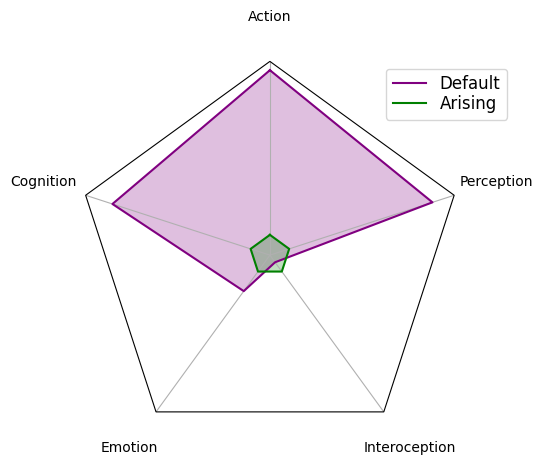

In [108]:
# radar chart
data = []
for k_1 in char_dic.keys():
    data_ = []
    for k_2 in char_dic[k_1].keys():
        data_.append(char_dic[k_1][k_2])
    data.append(data_)

    



N = len(domains)
theta = radar_factory(N, frame='polygon')

# spoke_labels = data.pop(0)

fig, axs = plt.subplots(figsize=(5, 5), nrows=1, ncols=1,
                        subplot_kw=dict(projection='radar'))
fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.85, bottom=0.05)

colors = ['purple', 'green']
# Plot the four cases from the example data on separate axes
# axs.set_rgrids([5, 10, 15, 20, 25])
# axs.set_title('cane', weight='bold', size='medium', position=(0.5, 1.1),
#              horizontalalignment='center', verticalalignment='center')


for d, color in zip(data, colors):
    axs.plot(theta, d, color=color)
#     axs.set_rticks([0.25,0.5, 0.75], labels=[])
#     axs.set_rlabel_position(-360/5)
    axs.set_rticks([0.1,0.2, 0.3], labels=[])
    axs.set_rlabel_position(-60)
    axs.fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
axs.set_varlabels(domains)

# add legend relative to top-left plot
labels = ('Default', 'Arising')
legend = axs.legend(labels, loc=(0.8, .85),
                          labelspacing=0.1, fontsize=12)

# plt.show()
plt.tight_layout
# plt.savefig('output/PlotGenerator/macro_areas_radar_normalize_plus_25082023.png', dpi=1000, bbox_inches='tight')

Default
Arising


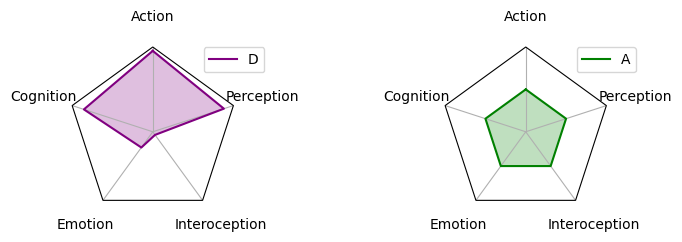

In [109]:
# radar chart
data = []
for k_1 in char_dic.keys():
    data_ = []
    for k_2 in char_dic[k_1].keys():
        data_.append(char_dic[k_1][k_2])
    data.append(data_)
    
colors = ['purple', 'green']
labels = ['Default', 'Arising']

fig, axs = plt.subplots(figsize=(7, 7), nrows=1, ncols=2,
                        subplot_kw=dict(projection='radar'))
for i,d in enumerate(data):
    
    N = len(domains)
    theta = radar_factory(N, frame='polygon')

    # spoke_labels = data.pop(0)


    fig.subplots_adjust(wspace=1.2, hspace=0.20, top=0.85, bottom=0.05)

    # Plot the four cases from the example data on separate axes
    # axs.set_rgrids([5, 10, 15, 20, 25])
    # axs.set_title('cane', weight='bold', size='medium', position=(0.5, 1.1),
    #              horizontalalignment='center', verticalalignment='center')

    color = colors[i]
    axs[i].plot(theta, d, color=color)
#     axs.set_rticks([0.25,0.5, 0.75], labels=[])
#     axs.set_rlabel_position(-360/5)
    axs[i].set_rticks([0.1,0.2, 0.3], labels=[])
    axs[i].set_rlabel_position(-60)
    axs[i].fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
    axs[i].set_varlabels(domains)

    label = labels[i]
    print(label)
    # add legend relative to top-left plot
    legend = axs[i].legend(label, loc=(0.8, .85),
                              labelspacing=0.1, fontsize=10)

    # plt.show()
    plt.tight_layout
    # plt.savefig('output/PlotGenerator/macro_areas_radar_normalize_plus_25082023.png', dpi=1000, bbox_inches='tight')

# Plot the centroids for each K

In [22]:
# sn_color = [
#           mpl.colors.to_rgba('purple',alpha), #Attention
#           mpl.colors.to_rgba('lightblue',alpha), #Auditive
#           mpl.colors.to_rgba('green',alpha), #Control  
#           mpl.colors.to_rgba('violet',alpha),#Default
#           mpl.colors.to_rgba('yellow',alpha), #Language
#           mpl.colors.to_rgba('orange',alpha), #Somatomotor
#           mpl.colors.to_rgba('gray', alpha),  # Subcortical
#           mpl.colors.to_rgba('red',alpha), #Visual
#          ]

In [23]:
list(atlas_labels['super network'].unique())

['Default',
 'Language',
 'Control',
 'Attention',
 'Auditory',
 'SomatoMotor',
 'Visual',
 'Subcortical']

In [24]:
sn_count = {}
for sn in list(atlas_labels['super network'].unique()):
    sn_count[sn] = len(atlas_labels.loc[atlas_labels['super network']==sn]['area'].values)
sn_count

{'Default': 38,
 'Language': 8,
 'Control': 40,
 'Attention': 50,
 'Auditory': 9,
 'SomatoMotor': 24,
 'Visual': 31,
 'Subcortical': 34}

In [43]:
np.sum(centroid<0)

234

In [38]:
centroid

array([-0.0652061 , -0.06007689, -0.06697078, -0.06715395, -0.0643249 ,
       -0.03761628, -0.0664506 , -0.06674304, -0.06682051, -0.06879738,
       -0.06657563, -0.06315919, -0.06651627, -0.06801122, -0.06760977,
       -0.05652805, -0.06733161, -0.06664699, -0.06813493, -0.06920203,
       -0.06973635, -0.06851936, -0.06632408, -0.07040984, -0.06838866,
       -0.06867668, -0.06795616, -0.06868483, -0.0693437 , -0.06863892,
       -0.06395263, -0.06605231, -0.06814228, -0.06588752, -0.06549974,
       -0.06845804, -0.06966876, -0.06220425, -0.06594389, -0.06682819,
       -0.0687555 , -0.06792215, -0.06914359, -0.0698    , -0.06939982,
       -0.07049859, -0.06818376, -0.06356914, -0.07048581, -0.06890887,
       -0.06668189, -0.06269897, -0.06509036, -0.06682471, -0.06699559,
       -0.06849914, -0.06872843, -0.06901555, -0.06718153, -0.06833683,
       -0.0699215 , -0.0690061 , -0.06851828, -0.07067693, -0.05777926,
       -0.06908926, -0.06854873, -0.06737944, -0.06828385, -0.06

In [56]:
centr_pos

array([234])

(234,)
(234,)
(234,)
(234,)


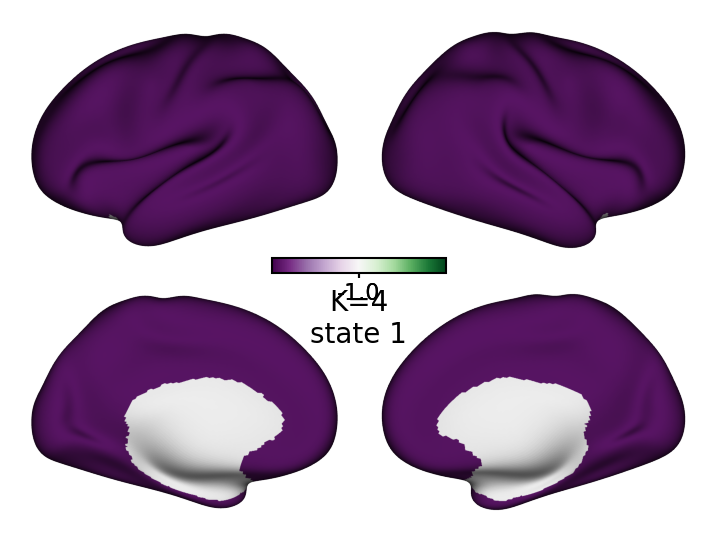

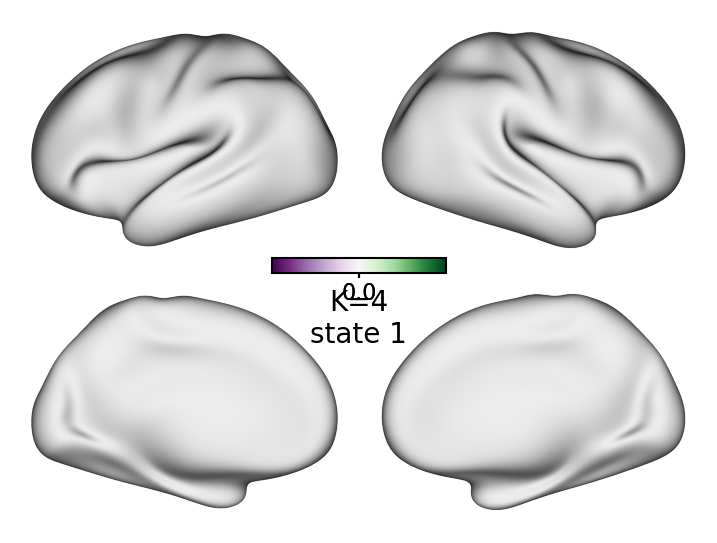

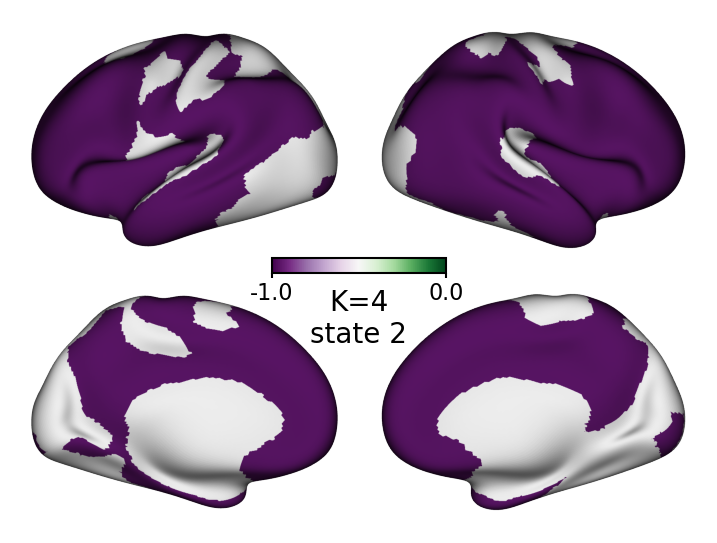

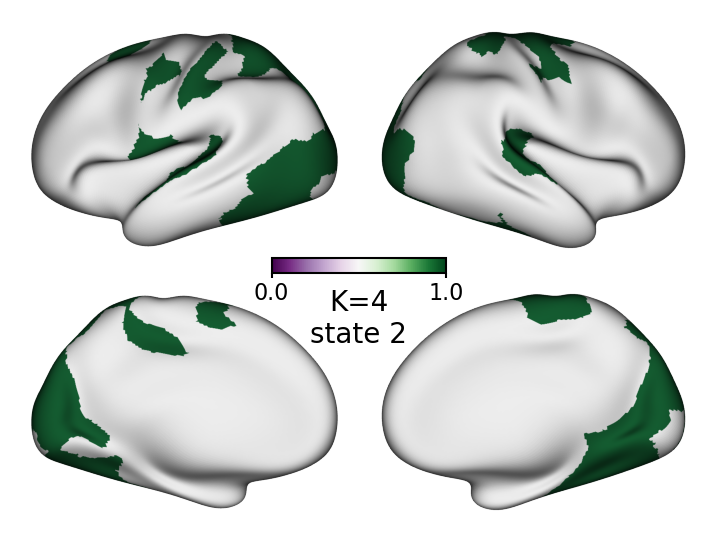

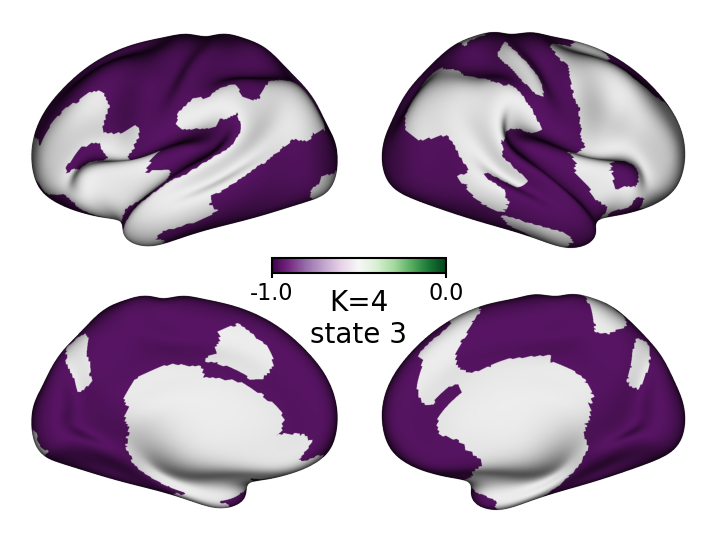

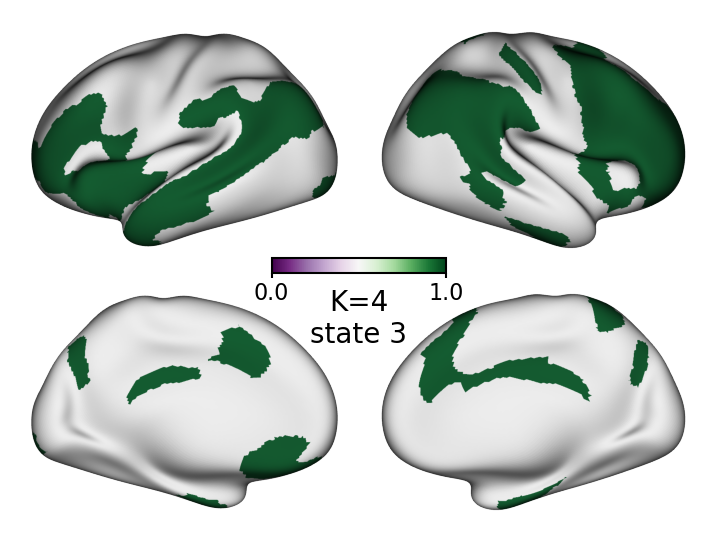

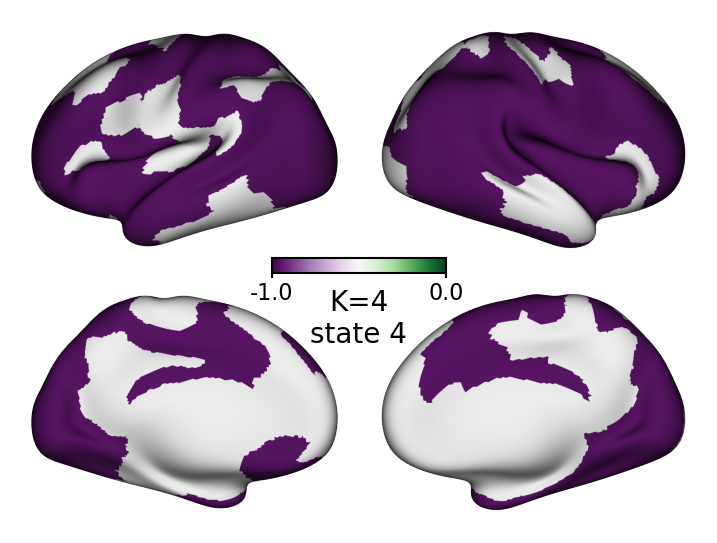

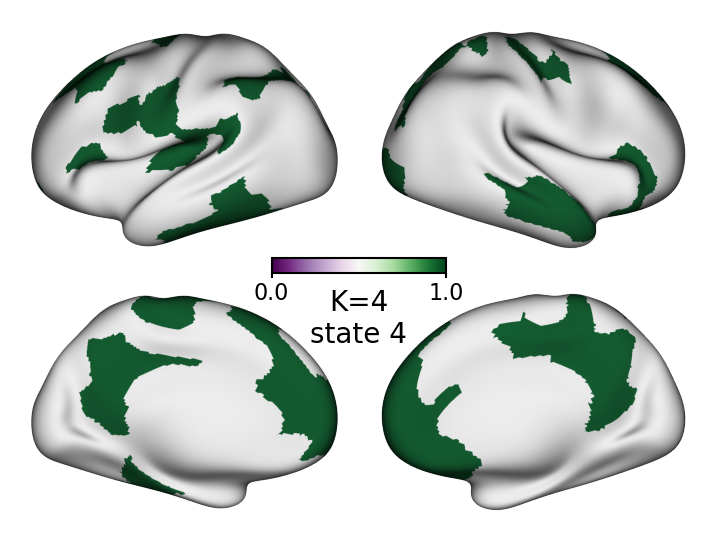

In [77]:
folder = 'output/MD_05122023/'

for kappone,k_l in enumerate(kmeans_leida): # Loop over states
    if kappone+2==4:
        # fare un cervellino per ogni centroide
        for state, centroid in enumerate(k_l['C']): # Loop over centroids
            print(centroid.shape)
            bin_centr_neg = np.zeros(centroid.shape)
            if len(np.where(centroid<0)[0])!=0:
                bin_centr_neg[np.where(centroid<0)[0]] = -1
            bin_centr_pos = np.zeros(centroid.shape)
            if len(np.where(centroid>0)[0])!=0:
                bin_centr_pos[np.where(centroid>0)[0]] = 1
            # ENIGMA PLOT
            # neg vals
            normal_view(bin_centr_neg[:200], parcellation_name='schaefer', parcellation='200', surftype='veryinflated', cmap='PRGn',
                        q_thresh=0.0001, center_cbar=True, exp_form=False, xlabel='K='+str(kappone+2)+'\nstate '+str(state+1))
            # full_view(centroid[:360], parcellation_name='glasser', surftype='veryinflated', xlabel='LIME corr', cmap='RdBu_r')
            # compose_full_view(save_svg=True, output_name='output/eyetracking/LIME/LIME_et_XAI_overlap_corr_'+XAI_model)
            
            # pos vals
            normal_view(bin_centr_pos[:200], parcellation_name='schaefer', parcellation='200', surftype='veryinflated', cmap='PRGn',
                        q_thresh=0.0, center_cbar=True, exp_form=False, xlabel='K='+str(kappone+2)+'\nstate '+str(state+1))
            # full_view(centroid[:360], parcellation_name='glasser', surftype='veryinflated', xlabel='LIME corr', cmap='RdBu_r')
            # compose_full_view(save_svg=True, output_name='output/eyetracking/LIME/LIME_et_XAI_overlap_corr_'+XAI_model)
            # break
            
            # # Make the cervellino
            # blank_brain = np.full(atlas.shape, np.nan)
            # for i,a in enumerate(centroid):# Loop over the areas    
            #     # if a<0:
            #     #     # print('cane')
            #     cord = np.where(atlas==i+1) # index in the atlas start from 1
            #     blank_brain[cord[0], cord[1], cord[2]] = a
            # b_min = blank_brain.min()
            # b_max = blank_brain.max()
    
            # # NILEARN PLOT
            # nii_img=nib.Nifti1Image(blank_brain, atlas_affine, atlas_header)
            # plotting.plot_glass_brain(nii_img, display_mode='l', black_bg=False, cmap='bwr',
            #                           title='K='+str(kappone+2)+' state '+str(state+1), plot_abs=False)
            # # plt.savefig(folder+'K'+str(kappone+2)+'/centroid_K'+str(kappone+2)+'state_'+str(state+1)+'.png', dpi=300)
    
            # # MAKE HISTOGRAMMINI
            # # Count how many areas per network the emergent community has
    
            # # I put in a dic the count area per super noetwork in the emergent community
            # sn_dic = {}
            # for sn in list(atlas_labels['super network'].unique()):
            #     sn_dic[sn] = 0 # Init
            # for i,a in enumerate(centroid):# Loop over the areas  
            #     if a > 0: # If the area belongs to the emergent community
            #         sn_dic[atlas_labels.loc[i]['super network']] += 1
            #         # print(atlas_labels.loc[i]['super network'])
            # # print(sn_dic)
            
            # # I normalize the count for each super network with respect to the total number of areas of each super network 
            # for sn in list(atlas_labels['super network'].unique()):
            #     sn_dic[sn]/=sn_count[sn]
            # # print(sn_dic)
    
            # # # HIST PLOT
            # # fig = plt.figure(figsize=(4.5,3))
            # # plt.title('Emergent Community - '+'K='+str(kappone+2)+' state '+str(state+1))
            # # plt.bar(np.arange(0,len(list(sn_dic.keys()))), list(sn_dic.values()), color=sn_color, tick_label=atlas_labels['super network'].unique())
            # # plt.xticks(rotation=45, ha='right')
            # # plt.ylabel('areas count')
            # # fig.tight_layout()
            # # plt.savefig(folder+'K'+str(kappone+2)+'/centroid_K'+str(kappone+2)+'state_'+str(state+1)+'_hist.png', dpi=300)
            
        

# Chose a K

In [31]:
K = 6
k = K - 2 # MD start to cluster from K=2
# Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
state_labels = state_labels_list[k]
print(state_labels.shape, state_labels.max())
centroids = kmeans_leida[k]['C']
print(centroids.shape)

(14223,) 6.0
(6, 234)


# Some extra info (for a fixed K)

In [525]:
K = 6
k = K - 2 # MD start to cluster from K=2
# Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
state_labels = state_labels_list[k]
print(state_labels.shape, state_labels.max())
centroids = kmeans_leida[k]['C']
print(centroids.shape)

# time points belonging to each state [state x time points]
states_index = []
for s in np.unique(state_labels):
    states_index.append(np.where(state_labels==s))

# Divide states indexes by group
groups_index = []
for g in np.unique(group_labels):
    groups_index.append(np.where(group_labels==g)[0])
    
states_index_groups = [] # [state 1, state2, state 3]
for s in states_index:
    groupz = {0:[], 1:[], 2:[]}
    for t in s[0]:
        groupz[group_labels[t][0]].append(t)
    states_index_groups.append(groupz)

# states_index = # time points belonging to each state [state x time points]
# group_index = # time points belonging to each group [gorups x time points]

# Basic dynamic evaluation: Life Time and Percentage of Occupancy

In [32]:
print(sns.__version__)
import statannotations
print(statannotations.__version__)

0.11.2
0.5.0


(14223,) 2.0
(2, 234)


NameError: name 'Annotator' is not defined

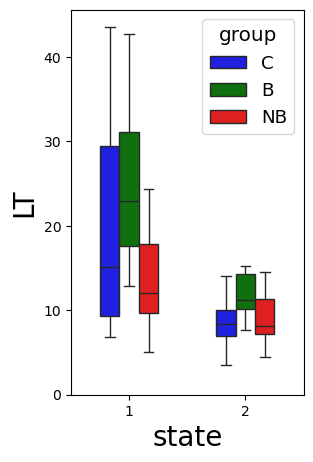

In [93]:
n_sub = int(state_labels_list[0].shape[0]/time_points)

for K in range(2,10+1):
    k = K - 2 # MD start to cluster from K=2
    # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
    state_labels = state_labels_list[k]
    print(state_labels.shape, state_labels.max())
    centroids = kmeans_leida[k]['C']
    print(centroids.shape)
    
    # SOME EXTRA INFOs
    # time points belonging to each state [state x time points]
    states_index = []
    for s in np.unique(state_labels):
        states_index.append(np.where(state_labels==s))
    # Divide states indexes by group
    groups_index = []
    for g in np.unique(group_labels):
        groups_index.append(np.where(group_labels==g)[0])
    states_index_groups = [] # [state 1, state2, state 3]
    for s in states_index:
        groupz = {0:[], 1:[], 2:[]}
        for t in s[0]:
            groupz[group_labels[t][0]].append(t)
        states_index_groups.append(groupz)
    
    # METRICS OF DYNAMICS
    metrics_dic = {'LT': [], 
                   'PO': [],
                   'sub': [],
                   'group': [],
                   'state': []}
    
    for n in range(n_sub):  # Loop over subjects
        ts = state_labels[n*time_points:(n+1)*time_points]
        for s in range(1, K+1): # Loop over state, no baseline state        
            metrics_dic['group'].append(group[n])
            metrics_dic['state'].append(s)
            metrics_dic['sub'].append(n+1)
            # PO
            metrics_dic['PO'].append(np.where(ts==s)[0].shape[0]/time_points)
            
        # AVERAGE LT    
        prev = ts[0]
        counts = {} # all the lifetimes, it's a dic
        for s in range(0, K+1): # Init the dic
            counts[s] = []
            
        count = 0
        for t in ts[1:]:
            if t==prev:
                count+=1
            else:
                counts[prev].append(count)
                count = 0
                prev = t
                
        for s in range(1, K+1): # Loop over state, no baseline state   
            if len(counts[s])==0:
                pino = 0
            else:
                pino = np.mean(counts[s])
                
            metrics_dic['LT'].append(pino)
    
    df_metrics = pd.DataFrame(metrics_dic)
    
    ### PLOT ###
    
    metrics = ['LT', 'PO']
    
    state_order = [s for s in range(1,K+1)] # 0 because we start from the baseline state - no baseline state   
    groups_order = ['C', 'B', 'NB']
    pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
             [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
             [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    
    annot_test =  'Brunner-Munzel'
    # annot_test = 't-test_ind'
    
    stats = []
    for metrica in metrics:
        hue_plot_params = {
            'data': df_metrics,
            'x': 'state',
            'y': metrica,
            "order": state_order,
            "hue": 'group',
            "hue_order": groups_order,
            "palette": my_pal
        }
    
        fig,ax = plt.subplots(1,1, figsize=(K*1.5,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            # Create new plot
        #     ax = get_log_ax()
    
            # Plot with seaborn
            sns.boxplot(ax=ax, **hue_plot_params,
                             showfliers=False,
                             width=0.5)
            ax.set_xlabel('state',fontsize=20)
            ax.set_ylabel(metrica, fontsize=20)
            ax.set_ylim(0,)
    
            # Add annotations
            # Cohen's D calculation
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='inside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
            _, stat = annotator.apply_and_annotate()
        #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
    
            # Label and show
            plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title('K='+str(K), fontsize=20)
        plt.tight_layout()
        stats.append(stat)
        # plt.savefig('output/MD_05122023/K'+str(K)+'/'+metrica+'_corr.png',
        #             dpi=200)


    ### ENTROPY ###

    # Compute entropy for the three groups - subject by subject
    entropy_dic = {'entropy': [],
                   'group': []}
    
    for i,g in enumerate(group):
        h = 0
        for p in df_metrics.loc[df_metrics['sub']==i+1]['PO'].values:
            h += p*np.log(p)
        entropy_dic['entropy'].append(-h)
        entropy_dic['group'].append(g)
    
    entropy_df = pd.DataFrame(entropy_dic)
    
    # PLOT
    groups_order = ['C', 'B', 'NB']
    pairs = [['C','B'], ['C','NB'], ['B', 'NB']]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    
    hue_plot_params = {
        'data': entropy_df,
        'x': 'group',
        'y': 'entropy',
        'order': groups_order,
        'palette': my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(7,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('group',fontsize=20)
        ax.set_ylabel('entropy', fontsize=20)
        ax.set_ylim(0,)
    
        # Add annotations
        # Cohen's D calculation
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
    #                         comparisons_correction='Benjamini-Hochberg')
        annotator.apply_and_annotate();
    #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
    
        # Label and show
        plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title('K='+str(K), fontsize=16)
    plt.tight_layout()
    plt.savefig('output/MD_05122023/K'+str(K)+'/PO_entropy.png',
                dpi=200)

In [662]:
# # Bonferroni correction within states

# for m in range(2):
#     print(m)
#     for i in range(len(stats[m])):   
#         if stats[m][i].data.pvalue <=0.05/3: # p corrected with boferroni
#             print(stats[m][i].data.group1, stats[m][i].data.group2, stats[m][i].data.pvalue)

In [669]:
# # Percentage of Occupancy vs Lifetime: Scatter Plot
# colorz = ['blue','green','red']
# groupz = ['C', 'B', 'NB']


# # All the states
# fig, ax = plt.subplots(1, figsize=(5, 5))
# for i in range(3):
#     LT = df_metrics.loc[df_metrics['group']==groupz[i]]['LT'].values
#     PO = df_metrics.loc[df_metrics['group']==groupz[i]]['PO'].values

#     ax.scatter(PO, LT, c=colorz[i])
#     ax.set_ylabel('LT', fontsize=18)
#     ax.set_xlabel('PO', fontsize=18)
    
# # State by state
# fig, axs = plt.subplots(2, 3, figsize=(10, 6))
# for s,ax in enumerate(axs.flat):
#     for i in range(3):
#         s_ = s + 1
#         LT = df_metrics.loc[df_metrics['group']==groupz[i]].loc[df_metrics['state']==s_]['LT'].values
#         PO = df_metrics.loc[df_metrics['group']==groupz[i]].loc[df_metrics['state']==s_]['PO'].values

#         ax.scatter(PO, LT, c=colorz[i])
#         ax.set_xlim(0,0.8)
#         ax.set_ylim(0,50)
# fig.supxlabel('PO', fontsize=18)
# fig.supylabel('LT', fontsize=18)

### Lifetime and Percentage of Occupancy representation (single subject representation) 

(14223,) 4.0
(4, 234)


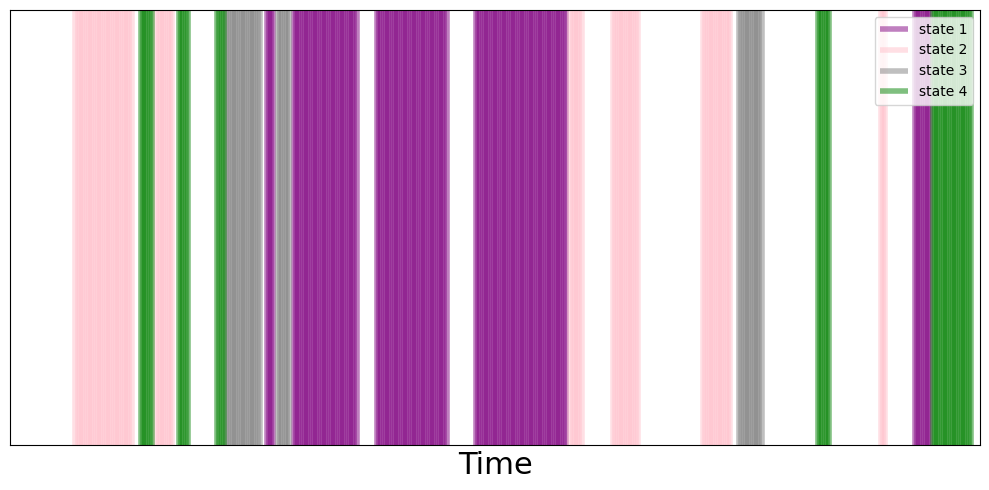

In [83]:
K = 4
k = K - 2 # MD start to cluster from K=2
# Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
state_labels = state_labels_list[k]
print(state_labels.shape, state_labels.max())
centroids = kmeans_leida[k]['C']
print(centroids.shape)

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

cs = ['purple', 'pink', 'grey', 'green', 'orange', 'tab:blue'] 
s=9

fig, ax = plt.subplots(1, figsize=(10,5))
ax.set_xticks([]);
ax.set_yticks([]);
for k_ in range(1,K+1):
    ax.vlines(np.where(state_labels[time_points*s:time_points*(s+1)]==k_),
              ymin=np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).min(),
              ymax=np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).max(), alpha=0.5,
              linewidth=4, color=cs[k_-1], label='state '+str(k_))
# ax.plot(np.mean(Ev[time_points*s:time_points*(s+1)],axis=1), linewidth=2, color='black', alpha=0.5)
ax.set_xlim(0, time_points)
ax.set_ylim(np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).min(),
            np.mean(Ev[time_points*s:time_points*(s+1)],axis=1).max())
ax.set_xlabel('Time', fontsize=22)
# ax.set_ylabel('Average Brain Activity', fontsize=22)

plt.legend(bbox_to_anchor=(1,1))
plt.tight_layout()
plt.savefig('output/MD_05122023/states_example_new.png',
            dpi=300)

# Network analysis with phase locking matrices

In [58]:
PL_thresh = False

K= 4
(4, 234)
4
STATE  1
STATE  2
STATE  3
STATE  4


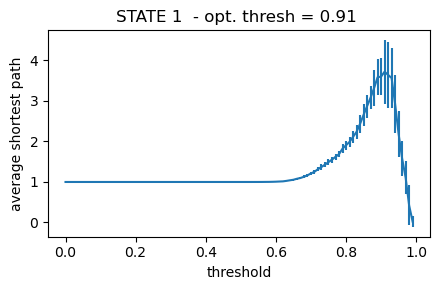

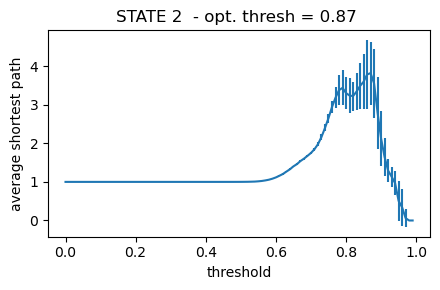

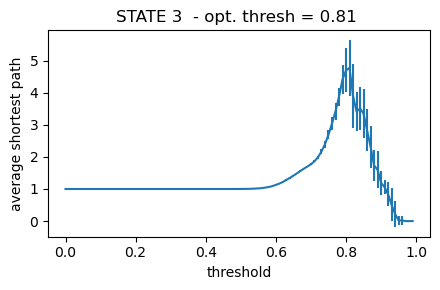

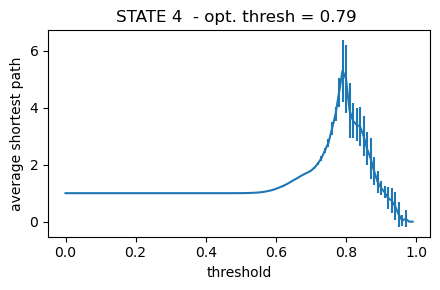

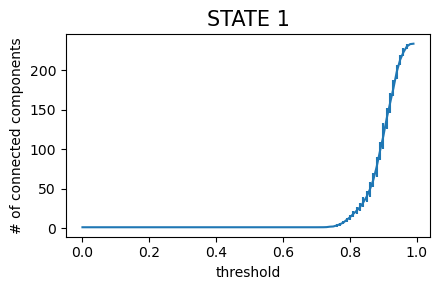

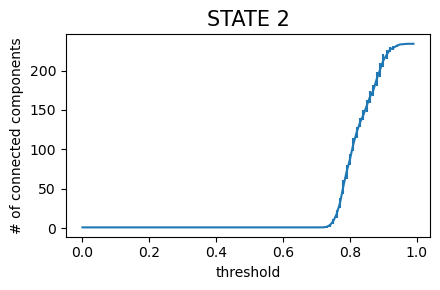

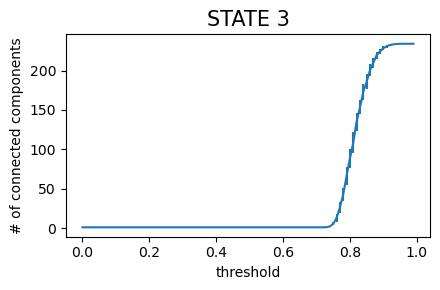

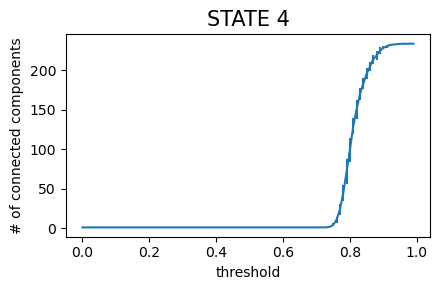

In [60]:
############################
### PERCOLATION ANALYSIS ###
############################

# Guardo come variano le metriche (tipo average shortest path e number of connected components) al variare della
# threshold che applico per binarizzare il grafo.
# Dovrei anche guardare cosa succede se vario la threshold che uso per le singole matrice di phase locking, ma lo
# facciamo un'altra volta

# I want to find the proper threshold for each states
# Explore the thresholds from -1

state_thresh_allK = []
for K in range(2,10+1): # Loop over K
    states_thresh = [] # For each state store threshold computed with percolation analysis
    if K==4:
        print('K=',K)
        k = K - 2 # MD start to cluster from K=2
        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        print(centroids.shape)
        
        # time points belonging to each state [state x time points]
        states_index = []
        for s in np.unique(state_labels)[1:]: # Remove the baseline state !!!!!!!!!!!!!!!!!!!!!!!!!
            states_index.append(np.where(state_labels==s))
        print(len(states_index))
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
        states_index_groups = [] # [state 1, state2, state 3]
        for s in states_index:
            groupz = {0:[], 1:[], 2:[]}
            for t in s[0]:
                groupz[group_labels[t][0]].append(t)
            states_index_groups.append(groupz)
        
        states_mets = []
        states_mets_2 = []
        for s in range(K): # Loop over states
            print('STATE ', s+1)
            mets = []
            mets_2 = []
            x = np.arange(0,1,0.01)
        #     x = [0.2, 0.6]
            for thresh_2 in x:
                # if thresh_2%0.2==0:
                #     print(thresh_2)
                thresh = 0.99
                n_pick = 50
                n_samp = 50
        
                met = []
                met_2 = []
                for t in range(n_pick):
                    # Pick a random s-ample of phase locking matrix
                    idxs = random.choices(states_index[s][0], k=n_samp)
                    mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                    for j in idxs:
        #                 print('pino', j)
                        np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                        m = plm_tc[j]
                        m = np.abs(m)
                        if PL_thresh==True:
                            m[np.where(m<thresh)] = 0
                        mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                    meanchia = mat.mean(axis=0)
                    # Devo thresholdare pure la matrice media
                    meanchia[np.where(meanchia<thresh_2)] = 0
        
                    # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                    G = nx.from_numpy_array(meanchia)
                    # Which metrics I want to look at
                    met.append(graph_metrics('average_shortest_path', G))
                    met_2.append(graph_metrics('number_connected_components', G))
                mets.append(met)
                mets_2.append(met_2)
            states_mets.append(mets)
            states_mets_2.append(mets_2)
        
        ###########################
        ### PLOTS and THRESHOLD ###
        ###########################
        
        # shortest path 
        y_states = []
        y_err_states = []
        for mets in states_mets:
            y = []
            y_err = []
            for m in mets:
        #         y.append(np.median(m))
                y.append(np.mean(m))
        
                y_err.append(np.std(m))
            y_states.append(y)
            y_err_states.append(y_err)
        
        states_thresh = [] # For each state store threshold computed with percolation analysis
        
        for s,met in enumerate(y_states):
            fig = plt.figure(figsize=(4.5,3))
            plt.title('STATE {}  - opt. thresh = {} '.format(s+1, round(x[np.argmax(y_states[s])], 4)), 
                                                 fontsize=12)
            plt.errorbar(x, met, yerr=y_err_states[s])
            plt.xlabel('threshold')
            plt.ylabel('average shortest path')
            states_thresh.append(x[np.argmax(y_states[s])])    
            fig.tight_layout()
            # plt.savefig('output/MD_05122023/K'+str(K)+'/Percolation_ShortestPath_npick'+str(n_pick)+ \
            #             '_nsamp'+str(n_samp)+'_K'+str(K)+'_state'+str(s+1)+'.png',
            #             dpi=200, bbox_extra_artists=[my_sup])
        
            
        # number connected components
        y_states_2 = []
        y_err_states_2 = []
        for mets in states_mets_2:
            y = []
            y_err = []
            for m in mets:
        #         y.append(np.median(m))
                y.append(np.mean(m))
        
                y_err.append(np.std(m))
            y_states_2.append(y)
            y_err_states_2.append(y_err)
        
        for s,met in enumerate(y_states_2):
            fig = plt.figure(figsize=(4.5,3))
            plt.title('STATE {}'.format(s+1), fontsize=15)
            plt.errorbar(x, met, yerr=y_err_states_2[s])
            plt.xlabel('threshold')
            plt.ylabel('# of connected components')
            fig.tight_layout()
            # plt.savefig('output/MD_05122023/K'+str(K)+'/Percolation_NumConnComp_npick'+str(n_pick)+ \
            #             '_nsamp'+str(n_samp)+'_K'+str(K)+'_state'+str(s+1)+'.png',
            #             dpi=200, bbox_extra_artists=[my_sup])
        
            
    state_thresh_allK.append(states_thresh)

if PL_thresh:
    with open('output/MD_05122023/opt_thresh.pickle', 'wb') as handle:
        pickle.dump(state_thresh_allK, handle, protocol=pickle.HIGHEST_PROTOCOL) 
else:
    with open('output/MD_05122023/NO_PL_thresh/opt_thresh.pickle', 'wb') as handle:
        pickle.dump(state_thresh_allK, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [61]:
# Optimal thresholds
if PL_thresh:
    with open('output/MD_05122023/percolation_opt_thresh.pickle', 'rb') as handle:
        opt_threshes = pickle.load(handle)
else:
    with open('output/MD_05122023/NO_PL_thresh/opt_thresh.pickle', 'rb') as handle:
        opt_threshes = pickle.load(handle)

In [30]:
# # PLOT EXAMPLE
# mmm = []
# ggg = []
# sss = []
# for kkk, m_state in enumerate(metrics):
#     mmm += m_state[0] + m_state[1] + m_state[2]
#     ggg += ['C']*len(m_state[0]) + ['B']*len(m_state[1]) + ['NB']*len(m_state[2])
#     sss += [kkk+1]*len(m_state[0] + m_state[1] + m_state[2])
# df_metrics = pd.DataFrame(data = {metrica: mmm, 'groups': ggg, 'state':sss})

# state_order = [s for s in range(1,K+1)]
# groups_order = ['C', 'B', 'NB']
# pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
#          [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
#          [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
# my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
# annot_test =  'Brunner-Munzel'

# hue_plot_params = {
#     'data': df_metrics,
#     'x': 'state',
#     'y': metrica,
#     "order": state_order,
#     "hue": 'groups',
#     "hue_order": groups_order,
#     "palette": my_pal
# }


# with sns.plotting_context("notebook", font_scale = 1.2):
#     # Create new plot
# #     ax = get_log_ax()

#     # Plot with seaborn
#     ax = sns.boxplot(**hue_plot_params,
#                      showfliers=False,
#                      width=0.5)

#     # Add annotations
#     annotator = Annotator(ax, pairs, **hue_plot_params)
#     annamobbene = annotator.configure(test=annot_test).apply_and_annotate()

#     # Label and show
#     plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(0.2,0,1,1))
# plt.tight_layout(pad=3.0)
# plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png')

In [63]:
def do_overlap(intervallo1, intervallo2):
    a, b = intervallo1
    c, d = intervallo2

    # Controlla se gli intervalli si sovrappongono
    return (a <= d and b >= c)

(4, 234)
4
global_efficiency
global_efficiency
global_efficiency
global_efficiency


NameError: name 'do_overlap' is not defined

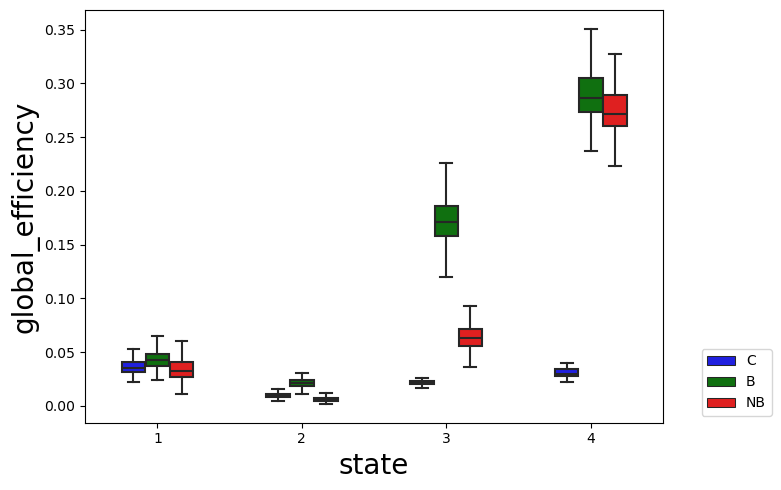

In [62]:
# GLOBAL METRICS


# Once I compute the optimal threshold I can compare metrics between groups
# metriche = ['average_shortest_path','number_connected_components','size_giant_component',
#             'fraction_of_edges','average_degree',
#             'average_local_efficiency', 'global_efficiency']
metriche = ['global_efficiency']
n_pick = 200
# n_samp = 20
eps = 0.1
for i,K in enumerate(range(2,10+1)): # Loop over K
    if K==4:
        k = K - 2 # MD start to cluster from K=2
        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        print(centroids.shape)
        
        # time points belonging to each state [state x time points]
        states_index = []
        for s in np.unique(state_labels)[1:]: # Remove the baseline state
            states_index.append(np.where(state_labels==s))
        print(len(states_index))
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
        states_index_groups = [] # [state 1, state2, state 3]
        for s in states_index:
            groupz = {0:[], 1:[], 2:[]}
            for t in s[0]:
                groupz[group_labels[t][0]].append(t)
            states_index_groups.append(groupz)

        # find the number of point of the state with the smallest representation
        min_s  = []
        for g in range(3): # loop over groups
            min = 20000
            for s in states_index_groups: # loop over states
                # print(len(s[g]))
                if len(s[g]) < min:
                    min = len(s[g])
            min_s.append(min)
    
        for metrica in metriche:
            conf_dic = {}
            df_metrics = [] # List which contains dataframe for each state
            metrics = [] # metrics for each state
            for s in range(K): # Loop over states - exclude baseline state (0), ma lo faccio già prima
                thresh_2 = opt_threshes[i][s]
                print(metrica)
                thresh = 0.99
                mets = [] # metrics for each group
                # I have to evaluate the metrics for the three groups
                for g_idx in range(3):
                    n_samp = int(0.75*min_s[g_idx])
                    met = []
                    for t in range(n_pick):
                        # Pick a random s-ample of phase locking matrix
                        idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
                        mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                        for j in idxs:
                            np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                            m = plm_tc[j]
                            m = np.abs(m)
                            if PL_thresh:
                                m[np.where(m<thresh)] = 0
                            mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                        meanchia = mat.mean(axis=0)
                        # Devo thresholdare pure la matrice media
                        meanchia[np.where(meanchia<thresh_2)] = 0
        
                        # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                        G = nx.from_numpy_array(meanchia)
                        # Which metrics I want to look at
                        met.append(graph_metrics(metrica, G))
                    mets.append(met)
                metrics.append(mets)
                
            mmm = []
            ggg = []
            sss = []
            for kkk, m_state in enumerate(metrics):
                mmm += m_state[0] + m_state[1] + m_state[2]
                ggg += ['C']*len(m_state[0]) + ['B']*len(m_state[1]) + ['NB']*len(m_state[2])
                sss += [kkk+1]*len(m_state[0] + m_state[1] + m_state[2])
            df_metrics = pd.DataFrame(data = {metrica: mmm, 'groups': ggg, 'state':sss})
            
            state_order = [s for s in range(1,K+1)]
            groups_order = ['C', 'B', 'NB']
            pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
                     [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
                     [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
            my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
        #     annot_test =  'Brunner-Munze'
            annot_test = 't-test_ind'
        
            hue_plot_params = {
                'data': df_metrics,
                'x': 'state',
                'y': metrica,
                "order": state_order,
                "hue": 'groups',
                "hue_order": groups_order,
                "palette": my_pal
            }
            
            fig,ax = plt.subplots(1,1, figsize=(K*2,5))
            with sns.plotting_context("notebook", font_scale = 1.2):
                # Create new plot
            #     ax = get_log_ax()
        
                # Plot with seaborn
                sns.boxplot(ax=ax, **hue_plot_params,
                                 showfliers=False,
                                 width=0.5)
                ax.set_xlabel('state',fontsize=20)
                ax.set_ylabel(metrica, fontsize=20)
        
        #         # Add annotations
        #         # Cohen's D calculation
        #         pvalues = annotate_D(pairs, metrica, df_metrics)
        #         print(pairs)
        #         annotator = Annotator(ax, pairs, **hue_plot_params)
        #         annotator.set_pvalues(pvalues)
        #         annotator.annotate()
        # #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
        
                # Label and show
                plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2,0))
            plt.tight_layout()
            if PL_thresh:
                plt.savefig('output/MD_05122023/K'+str(K)+'/GMETRICS_'+metrica+'_npick'+str(n_pick)+'_nsamp75minclust_K'+str(K)+'_no_annot.png',
                            dpi=200)
            else:
                plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/GMETRICS_'+metrica+'_npick'+str(n_pick)+'_nsamp75minclust_K'+str(K)+'_no_annot.png',
                            dpi=200)
            for p_i,p in enumerate(pairs):
                d1 = df_metrics.loc[df_metrics['groups']==p[0][1]].loc[df_metrics['state']==p[0][0]]['global_efficiency'].values
                d2 = df_metrics.loc[df_metrics['groups']==p[1][1]].loc[df_metrics['state']==p[1][0]]['global_efficiency'].values
            
                inter1 = [np.percentile(d1,2.5), np.percentile(d1,97.5)]
                inter2 = [np.percentile(d2,2.5), np.percentile(d2,97.5)]
            
                conf_dic[p_i] = do_overlap(inter1,inter2)

                
        #     fig = plt.figure(figsize=(6,4))
        #     plt.title(metrica)
        #     with open('output/GraphAnal/'+DATE+'/'+metrica+'_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'_ttest.txt', 'w') as f:
        #         for s in range(K):
        #         #     plt.ylim(0,1)
        #             bp = plt.boxplot([metrics[s][0], metrics[s][1], metrics[s][2]], positions = [s-eps, s, s+eps],
        #                              patch_artist=True,
        #                              labels=['','State'+str(s+1),''], showfliers=False)
        #             bp['boxes'][0].set_facecolor('blue')
        #             bp['boxes'][1].set_facecolor('green')
        #             bp['boxes'][2].set_facecolor('red')
        
        #             # t-tests 
        #             print('STATE ', s+1)
        #             test1 = ttest_ind(metrics[s][0], metrics[s][1])
        #             print(test1)
        #             test2 = ttest_ind(metrics[s][0], metrics[s][2])
        #             print(test2)
        #             test3 = ttest_ind(metrics[s][1], metrics[s][2])
        #             print(test3)
        #             print('\n')
        
        # #             # WRIte ttest results
        # #             f.write('STATE {}'.format(str(s+1)))
        # #             f.write('\n')
        # #             f.write(str(test1))
        # #             f.write(' CvsB')
        # #             f.write('\n')
        # #             f.write(str(test2))
        # #             f.write(' CvsNB')
        # #             f.write('\n')
        # #             f.write(str(test3))
        # #             f.write(' BvsNB')
        # #             f.write('\n')
        
        #     plt.legend([bp["boxes"][0], bp["boxes"][1], bp["boxes"][2]], ['C', 'B', 'NB'], loc='upper left')    
        #     p_1 = ttest_ind(C_met, B_met)[1]
        #     axs.set_title(metrica+' - p CvsB = {} CvsNB = {} BvsNB = {}'.format(round(p_1,4), round(p_2,4), round(p_3,4)), fontsize=11)
        #     axs.boxplot([C_met, B_met, NB_met], labels=['C','B','NB'], showfliers=False);

print(conf_dic)
for p_i,p in enumerate(pairs):
    if not cond_dic[p_i]:
        print(p)

In [64]:
for p_i,p in enumerate(pairs):
    d1 = df_metrics.loc[df_metrics['groups']==p[0][1]].loc[df_metrics['state']==p[0][0]]['global_efficiency'].values
    d2 = df_metrics.loc[df_metrics['groups']==p[1][1]].loc[df_metrics['state']==p[1][0]]['global_efficiency'].values

    inter1 = [np.percentile(d1,2.5), np.percentile(d1,97.5)]
    inter2 = [np.percentile(d2,2.5), np.percentile(d2,97.5)]

    conf_dic[p_i] = do_overlap(inter1,inter2)

In [67]:
print(conf_dic)
for p_i,p in enumerate(pairs):
    if not conf_dic[p_i]:
        print(p)

{0: True, 1: True, 2: False, 3: False, 4: True, 5: True, 6: False, 7: False, 8: True, 9: False, 10: False, 11: True}
[(3, 'C'), (3, 'B')]
[(4, 'C'), (4, 'B')]
[(3, 'C'), (3, 'NB')]
[(4, 'C'), (4, 'NB')]
[(2, 'B'), (2, 'NB')]
[(3, 'B'), (3, 'NB')]


(4, 234)
4
STATE  1
STATE  2
STATE  3
STATE  4
{0: True, 1: False, 2: True, 3: False, 4: True, 5: True, 6: True, 7: False, 8: True, 9: True, 10: True, 11: True}


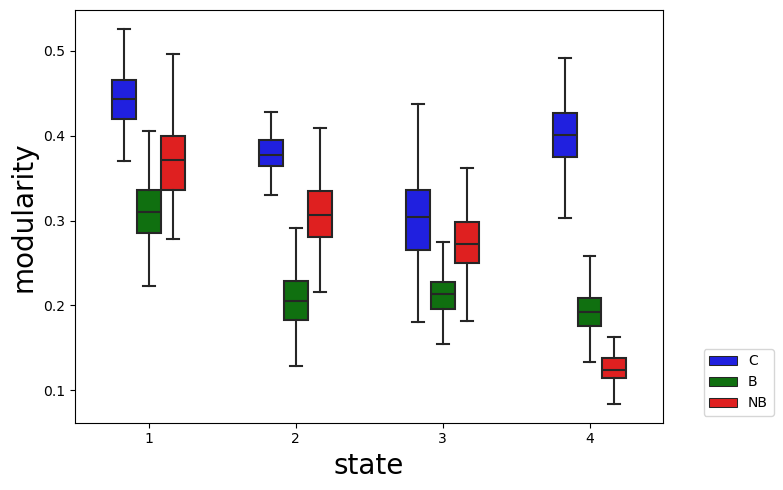

In [100]:
### MODULARITY ###

# EFFICIENCY, INTEGRATION and SEGREGATION
# Modularity measures segregation

eps = 0.1
n_pick=200
# n_samp =5
for i,K in enumerate(range(2,10+1)): # Loop over K
    if K==4:
        k = K - 2 # MD start to cluster from K=2
        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        print(centroids.shape)
        
        # time points belonging to each state [state x time points]
        states_index = []
        for s in np.unique(state_labels)[1:]: # Remove the baseline state !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            states_index.append(np.where(state_labels==s))
        print(len(states_index))
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
        states_index_groups = [] # [state 1, state2, state 3]
        for s in states_index:
            groupz = {0:[], 1:[], 2:[]}
            for t in s[0]:
                groupz[group_labels[t][0]].append(t)
            states_index_groups.append(groupz)

        # find the number of point of the state with the smallest representation
        min_s  = []
        for g in range(3): # loop over groups
            min = 20000
            for s in states_index_groups: # loop over states
                # print(len(s[g]))
                if len(s[g]) < min:
                    min = len(s[g])
            min_s.append(min)
        
        metrics = [] # metrics for each state
        conf_dic = {}
        for s in range(K): # Loop over states
            print('STATE ', s+1)
            thresh_2 = opt_threshes[i][s]
            thresh = 0.99

            mets = [] # metrics for each group
            # I have to evaluate the metrics for the three groups
            for g_idx in range(3):
                n_samp = int(0.75*min_s[g_idx])
                met = []
                for t in range(n_pick):
                    # Pick a random s-ample of phase locking matrix
                    idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
                    mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                    for j in idxs:
                        np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                        m = plm_tc[j]
                        m = np.abs(m)
                        if PL_thresh:
                            m[np.where(m<thresh)] = 0
                        mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                    meanchia = mat.mean(axis=0)
                    # Devo thresholdare pure la matrice media
                    meanchia[np.where(meanchia<thresh_2)] = 0
        
                    # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                    G = nx.from_numpy_array(meanchia)
                    # Which metrics I want to look at
                    met.append(nx.community.modularity(G, list(mas_list.values())))
                    
                mets.append(met) # groups
            metrics.append(mets) # states
        
        mmm = []
        ggg = []
        sss = []
        for kkk, m_state in enumerate(metrics):
            mmm += m_state[0] + m_state[1] + m_state[2]
            ggg += ['C']*len(m_state[0]) + ['B']*len(m_state[1]) + ['NB']*len(m_state[2])
            sss += [kkk+1]*len(m_state[0] + m_state[1] + m_state[2])
        df_metrics = pd.DataFrame(data = {'modularity': mmm, 'groups': ggg, 'state':sss})
        
        state_order = [s for s in range(1,K+1)]
        groups_order = ['C', 'B', 'NB']
        pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
                 [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
                 [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
        my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
        #     annot_test =  'Brunner-Munze'
        annot_test = 't-test_ind'
        
        hue_plot_params = {
            'data': df_metrics,
            'x': 'state',
            'y': 'modularity',
            "order": state_order,
            "hue": 'groups',
            "hue_order": groups_order,
            "palette": my_pal
        }
        
        fig,ax = plt.subplots(1,1, figsize=(K*2,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            # Create new plot
        #     ax = get_log_ax()
        
            # Plot with seaborn
            sns.boxplot(ax=ax, **hue_plot_params,
                             showfliers=False,
                             width=0.5)
            
            # pvalues = annotate_D(pairs, 'modularity', df_metrics)
            # # Add annotations
            # annotator = Annotator(ax, pairs, **hue_plot_params)
            # annotator.set_pvalues(pvalues)
            # annotator.annotate()
            ax.set_xlabel('state',fontsize=20)
            ax.set_ylabel('modularity', fontsize=20)

            for p_i,p in enumerate(pairs):
                d1 = df_metrics.loc[df_metrics['groups']==p[0][1]].loc[df_metrics['state']==p[0][0]]['modularity'].values
                d2 = df_metrics.loc[df_metrics['groups']==p[1][1]].loc[df_metrics['state']==p[1][0]]['modularity'].values
            
                inter1 = [np.percentile(d1,2.5), np.percentile(d1,97.5)]
                inter2 = [np.percentile(d2,2.5), np.percentile(d2,97.5)]
            
                conf_dic[p_i] = do_overlap(inter1,inter2)
        
            # Label and show
            plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
        plt.tight_layout()
        if PL_thresh:
            plt.savefig('output/MD_05122023/K'+str(K)+'/GMETRICS_modularity_npick'+str(n_pick)+'_nsamp75minclust_K'+str(K)+'_no_annot.png',
                        dpi=200)
        else:
            plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/GMETRICS_modularity_npick'+str(n_pick)+'_nsamp75minclust_K'+str(K)+'_no_annot.png',
                        dpi=200)

print(conf_dic)
for pin,v in enumerate(list(conf_dic.values())):
    if not v:
        print(pairs[pin])

In [ ]:
# # CORRELATION BETWEEN GRAPH'S METRICS

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

# eps = 0.1
# metrica = 'global_efficiency'

# metrics = [] # metrics for each state
# metrics_2 = []
# for s in range(K): # Loop over states
#     print('STATE ', s+1)
#     thresh_2 = states_thresh[s]
#     thresh = 0.99
#     n_pick = 50
#     n_samp = 50
#     mets = [] # metrics for each group
#     mets_2 = []
#     # I have to evaluate the metrics for the three groups
#     for g_idx in range(3):
#         met = []
#         met_2 = []
#         for t in range(n_pick):
#             # Pick a random s-ample of phase locking matrix
#             idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
#             mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
#             for j in idxs:
#                 np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
#                 m = plm_tc[j]
#                 m = np.abs(m)
#                 m[np.where(m<thresh)] = 0
#                 mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
#             meanchia = mat.mean(axis=0)
#             # Devo thresholdare pure la matrice media
#             meanchia[np.where(meanchia<thresh_2)] = 0
#             # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
#             G = nx.from_numpy_array(meanchia)
#             # Which metrics I want to look at
#             met.append(nx.community.modularity(G, mas_list))
#             met_2.append(graph_metrics(metrica, G))
#         mets.append(met) # groups
#         mets_2.append(met_2)
#     metrics.append(mets) # states
#     metrics_2.append(mets_2)

In [ ]:
# # BARPLOTS
# groups_names = ['CONTROLS', 'BLINDSIGHT', 'NO-BLINDSIGHT']
# my_col = ['blue', 'green', 'red']


# def is_sig(p, thresh=0.05):
#     if p <= thresh:
#         alpha=1
#     else:
#         alpha=0.25
#     return alpha
    
# width= 0.2
# fig, ax = plt.subplots(1,1)
# for s in range(K):
#     for g in range(len(groups_names)):
#         stat = pearsonr(metrics[s][g], metrics_2[s][g])[0]
#         pval = pearsonr(metrics[s][g], metrics_2[s][g])[1]
        
#         ax.axhline(y=0)
#         ax.bar(x=s+g*width,
#                height=stat,
#                width=width,
#                alpha=is_sig(pval),
#                color=my_col[g])
# ax.set_xticks([s+width for s in range(K)])
# ax.set_xticklabels(['state '+str(s+1) for s in range(K)])

# # For the legned
# import matplotlib.patches as mpatches
# blue_patch = mpatches.Patch(color='blue', label='C')
# green_patch = mpatches.Patch(color='green', label='B')
# red_patch = mpatches.Patch(color='red', label='NB')
# plt.ylabel('pearson')
# plt.title('Modularity - Global Efficiency correlation')
# plt.legend(handles=[blue_patch, green_patch, red_patch],
#           loc='lower right', bbox_to_anchor=(1.2, 0.8))

# plt.tight_layout()
# plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/GMETRICS_modularityVSglobaleff_npick'+ \
#             str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png', dpi=200)

# # CORRELATION MATRIX (group,metric)
# rows = [(0, 'm'),(0, 'e'),(1, 'm'),(1, 'e'),(2, 'm'),(2, 'e')]
# rows_lab = ['C-mod','C-eff','B-mod','B-eff','NB-mod','NB-eff',]
# row_dic = {'m':metrics, 'e':metrics_2}

# matr_stat = np.empty((len(rows),len(rows)))
# matr_p = np.empty((len(rows),len(rows)))
# for s in range(K):
#     fig, axs = plt.subplots(1,1, figsize=(6,5))
#     for i,r in enumerate(rows):
#         for j,c in enumerate(rows):
#             matr_stat[i][j] = pearsonr(row_dic[r[1]][s][r[0]], row_dic[c[1]][s][c[0]])[0]
#             matr_p[i][j] = pearsonr(row_dic[r[1]][s][r[0]], row_dic[c[1]][s][c[0]])[1]
#     my_sup = plt.suptitle('Modularity - Global Efficiency correlation: STATE '+str(s+1))
    
#     # display only significative values
#     for i in range(K):
#         for j in range(K):
#             if matr_p[i][j]>=0.05:
#                 matr_stat[i][j]=0
                
#     sns.heatmap(matr_stat, linewidth=0.8, xticklabels=rows_lab, yticklabels=rows_lab, cmap='bwr',
#                 annot=True, ax=axs, vmin=-1, vmax=1)
#     for t in axs.texts:
#         if float(t.get_text())!=0:
#             t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
#         else:
#             t.set_text("") # if not it sets an empty text

# #     sns.heatmap(matr_p, linewidth=0.8, xticklabels=rows_lab, yticklabels=rows_lab, cmap='Greens_r',
# #                 annot=True, vmax=0.05, ax=axs[1])
    
#     axs.set_yticklabels(axs.get_yticklabels(), rotation = 0, fontsize = 8)
#     axs.set_xticklabels(axs.get_xticklabels(), rotation = 0, fontsize = 8)
# #     axs[1].set_yticklabels(axs[1].get_yticklabels(), rotation = 0, fontsize = 8)
# #     axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation = 0, fontsize = 8)
    
#     plt.tight_layout()
#     plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/GMETRICS_modularityVSglobaleff_state'+str(s+1)+'npick'+ \
#                 str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
#                 bbox_extra_artists=[my_sup], dpi=200)

In [96]:
sns.__version__

'0.13.1'

(4, 234)
4
[0.91, 0.87, 0.81, 0.79]
betweenness centrality
STATE  1
0.91
STATE  2
0.87
STATE  3
0.81
STATE  4
0.79
cort_subcort_connectivity
[(3, 'C'), (3, 'B')]
[(4, 'C'), (4, 'B')]
[(4, 'C'), (4, 'NB')]
[(3, 'B'), (3, 'NB')]
homotopic_connectivity
CPU times: user 37min 54s, sys: 8min 50s, total: 46min 45s
Wall time: 46min 46s


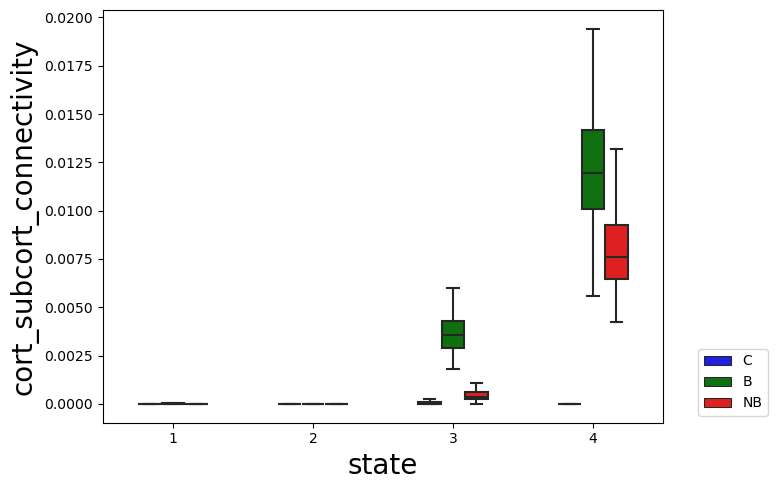

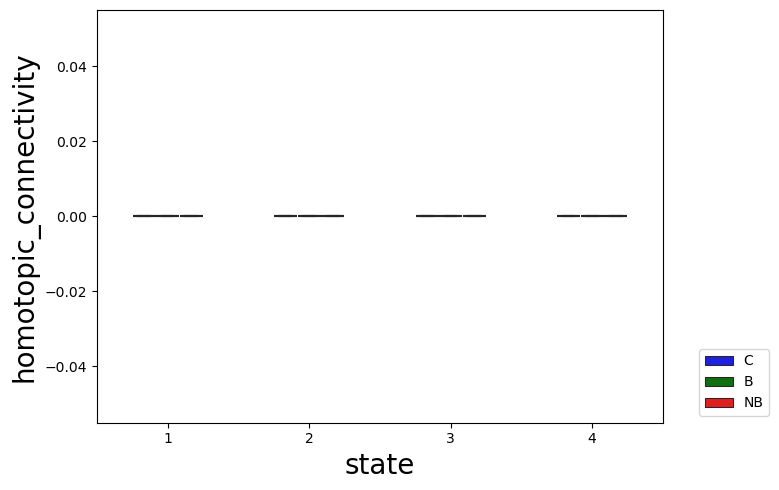

In [154]:
%%time
# CORTICO-SUCORCORTICO CONNECTIONS (BOXPLOT)

subcortical_idxs = atlas_labels.loc[atlas_labels['super network']=='Subcortical'].index
cortical_idxs = atlas_labels.loc[atlas_labels['super network']!='Subcortical'].index
full_c_sc_link = subcortical_idxs.shape[0]*cortical_idxs.shape[0]

metrics_label = ['cort_subcort_connectivity', 'homotopic_connectivity']

n_pick = 200
n_samp = 2 # Sampling number is the 75% of time points belonging to the pattern with smallest representation.
eps = 0.1
for i,K in enumerate(range(2,10+1)): # Loop over K
    k = K - 2 # MD start to cluster from K=2
    if K==4:
        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        print(centroids.shape)
        
        # time points belonging to each state [state x time points]
        states_index = []
        for s in np.unique(state_labels)[1:]: # Remove the baseline state !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            states_index.append(np.where(state_labels==s))
        print(len(states_index))
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
        states_index_groups = [] # [state 1, state2, state 3]
        for s in states_index:
            groupz = {0:[], 1:[], 2:[]}
            for t in s[0]:
                groupz[group_labels[t][0]].append(t)
            states_index_groups.append(groupz)
    
        # find the number of point of the state with the smallest representation
        min_s  = []
        for g in range(3): # loop over groups
            min = 20000
            for s in states_index_groups: # loop over states
                # print(len(s[g]))
                if len(s[g]) < min:
                    min = len(s[g])
            min_s.append(min)
        
        states_thresh = opt_threshes[i]
        print(states_thresh)
        maps_metrics = []
        piero = 0
        print(metriche_label[piero])
        metrics1 = [] # metrics for each state
        metrics2 = [] # metrics for each state
        for s in range(K): # Loop over states
            print('STATE ', s+1)
            thresh_2 = states_thresh[s]
            print(thresh_2)
            mets1 = [] # metrics for each group
            mets2 = [] # metrics for each group
            # I have to evaluate the metrics for the three groups
            for g_idx in range(3):
                n_samp = int(0.75*min_s[g_idx])
                met1 = []
                met2 = []
                for t in range(n_pick):
                    # Pick a random s-ample of phase locking matrix
                    idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
                    mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                    for j in idxs:
                        np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                        m = plm_tc[j]
                        m = np.abs(m)
                        mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                    meanchia = mat.mean(axis=0)
                    # Devo thresholdare pure la matrice media
                    meanchia[np.where(meanchia<thresh_2)] = 0
    
                    # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                    # G = nx.from_numpy_array(meanchia) # I DON'T NEED THE GRAPH, I CAN WORK WITH THE ADJACENCY MATRIX
                    # Which metrics I want to look at
                    
                    # Take only the cortico-subcortical link
                    sub_meanchia = meanchia[subcortical_idxs]
                    sub_meanchia = meanchia[subcortical_idxs]
                    sub_meanchia[:,subcortical_idxs]=0
                    # number of cortico-subcortical link
                    perc_c_sc_link = np.sum(sub_meanchia)/full_c_sc_link

                    # Inter hemispheric connections
                    cort_homo = np.sum(np.diag(meanchia[:200,:200]))
                    scoll_homo = np.sum(meanchia[-1,-2])
                    subcort_homo = np.sum(np.diag(meanchia[200:232, 200:232]))
                    
                    homo_conn = cort_homo + scoll_homo + subcort_homo

                    
                    
                    met1.append(perc_c_sc_link)
                    met2.append(homo_conn)
                mets1.append(met1) # groups
                mets2.append(met2) # groups
            metrics1.append(mets1) # states
            metrics2.append(mets2) # states
        all_metrics =[metrics1, metrics2]
    
    
        labels = ['C', 'B', 'NB']
        colors = ['blue','green','red']
        cmaps = ['RdBu','PiYG','bwr']

        for m_i, metrics in enumerate(all_metrics):
    
            mmm = []
            ggg = []
            sss = []
            for kkk, m_state in enumerate(metrics):
                mmm += m_state[0] + m_state[1] + m_state[2]
                ggg += ['C']*len(m_state[0]) + ['B']*len(m_state[1]) + ['NB']*len(m_state[2])
                sss += [kkk+1]*len(m_state[0] + m_state[1] + m_state[2])
            df_metrics = pd.DataFrame(data = {metrics_label[m_i]: mmm, 'groups': ggg, 'state':sss})
            state_order = [s for s in range(1,K+1)]
            groups_order = ['C', 'B', 'NB']
            pairs = [[(k,'C'),(k,'B')] for k in range(1,K+1)] + \
                     [[(k,'C'),(k,'NB')] for k in range(1,K+1)] + \
                     [[(k,'B'),(k,'NB')] for k in range(1,K+1)]
            my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
        #     annot_test =  'Brunner-Munze'
            annot_test = 't-test_ind'
        
            hue_plot_params = {
                'data': df_metrics,
                'x': 'state',
                'y': metrics_label[m_i],
                "order": state_order,
                "hue": 'groups',
                "hue_order": groups_order,
                "palette": my_pal
            }
            
            fig,ax = plt.subplots(1,1, figsize=(K*2,5))
            with sns.plotting_context("notebook", font_scale = 1.2):
                
                # Plot with seaborn
                sns.boxplot(ax=ax, **hue_plot_params,
                                 showfliers=False,
                                 width=0.5)
                ax.set_xlabel('state',fontsize=20)
                ax.set_ylabel(metrics_label[m_i], fontsize=20)
        
        #         # Add annotations
        #         # Cohen's D calculation
        #         pvalues = annotate_D(pairs, metrica, df_metrics)
        #         print(pairs)
        #         annotator = Annotator(ax, pairs, **hue_plot_params)
        #         annotator.set_pvalues(pvalues)
        #         annotator.annotate()
        # #         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
        
                # Label and show
                plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2,0))
            plt.tight_layout()
            plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/GMETRICS_'+metrics_label[m_i]+'_npick'+str(n_pick)+'_nsamp75minclust_K'+str(K)+'_no_annot.png',
                        dpi=200)
            print(metrics_label[m_i])
            for p_i,p in enumerate(pairs):
                d1 = df_metrics.loc[df_metrics['groups']==p[0][1]].loc[df_metrics['state']==p[0][0]][metrics_label[m_i]].values
                d2 = df_metrics.loc[df_metrics['groups']==p[1][1]].loc[df_metrics['state']==p[1][0]][metrics_label[m_i]].values
            
                inter1 = [np.percentile(d1,2.5), np.percentile(d1,97.5)]
                inter2 = [np.percentile(d2,2.5), np.percentile(d2,97.5)]
            
                conf_dic[p_i] = do_overlap(inter1,inter2)
                if not do_overlap(inter1,inter2):
                    print(p)

    

In [68]:
from nilearn import plotting

(4, 234)
4
[0.91, 0.87, 0.81, 0.79]
betweenness centrality
STATE  1
0.91
STATE  2
0.87
STATE  3
0.81
STATE  4
0.79


/home/alessio/miniconda3/envs/bs_laido_new/lib/python3.12/site-packages/nilearn/_utils/niimg.py:61: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

154_C vs. 154_B: Custom statistical test, P_val:1.000e+00
187_C vs. 187_B: Custom statistical test, P_val:1.000e+00
178_C vs. 178_B: Custom statistical test, P_val:1.000e+00
76_C vs. 76_B: Custom statistical test, P_val:1.000e+00
65_B vs. 65_NB: Custom statistical test, P_val:1.000e+00
154_B vs. 154_NB: Custom statistical test, P_val:1.000e+00
187_B vs. 187_NB: Custom statistical test, P_val:1.000e+00
178_B vs. 178_NB: Custom statistical test, P_val:1.000e+00
76_B vs. 76_NB: Custom statistical test, P_val:1.000e+00
190_C vs. 190_B: Custom statistical test, P_val:1.000e+00
65_C vs. 65_B: Custom statistical test, P_val:1.000e+00
190_B vs. 190_NB: Custom statistical test, P_val:1.000e+00
154_C vs. 154_NB: Custom statistical test, P_val:1.000e+00
187_C vs. 187_NB: Custom statistical test, P_val:5.000e-02
178_C v

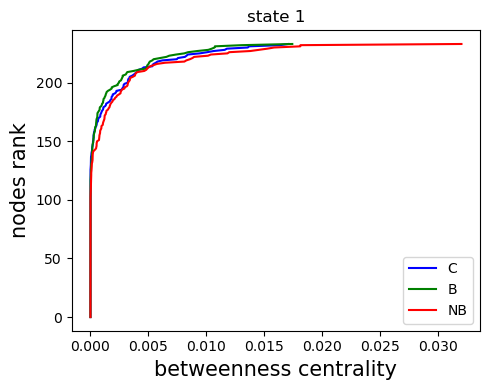

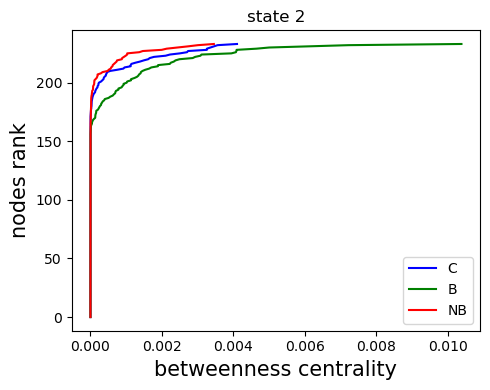

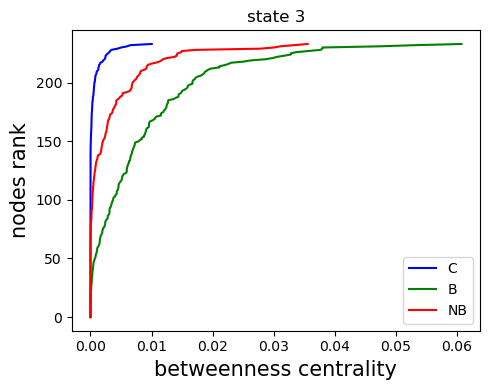

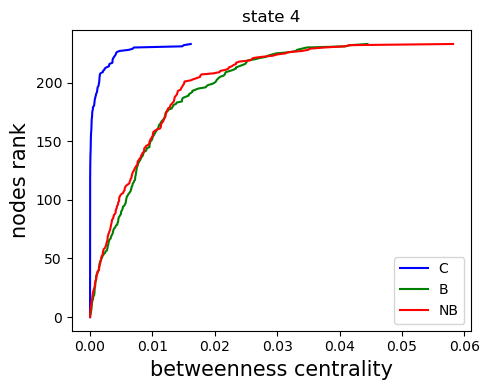

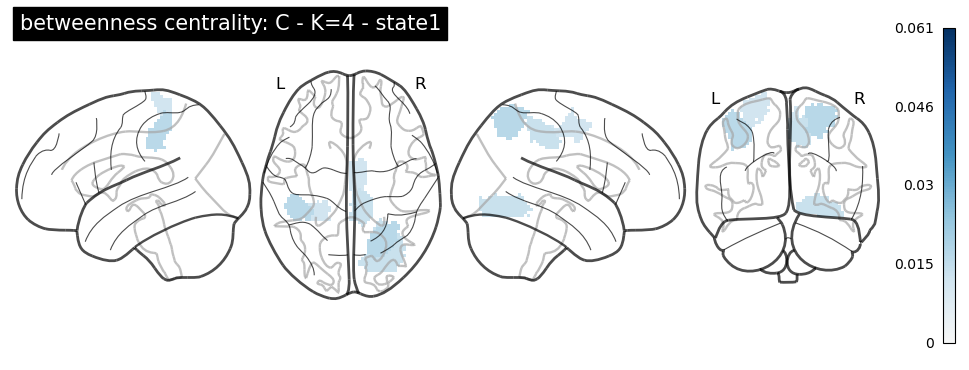

...

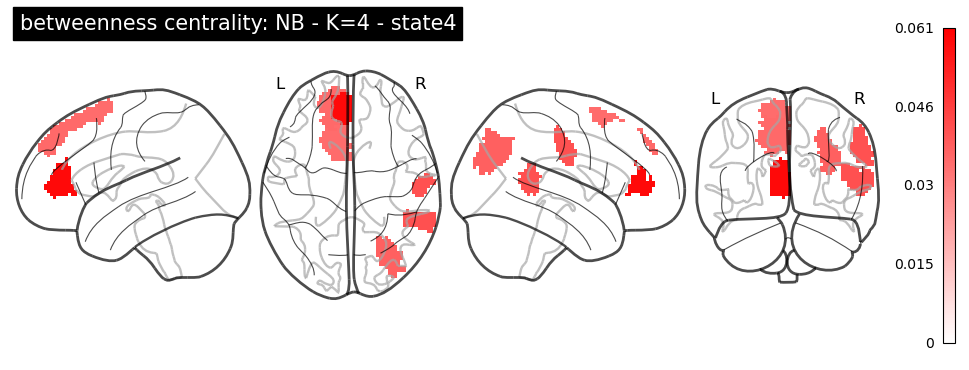

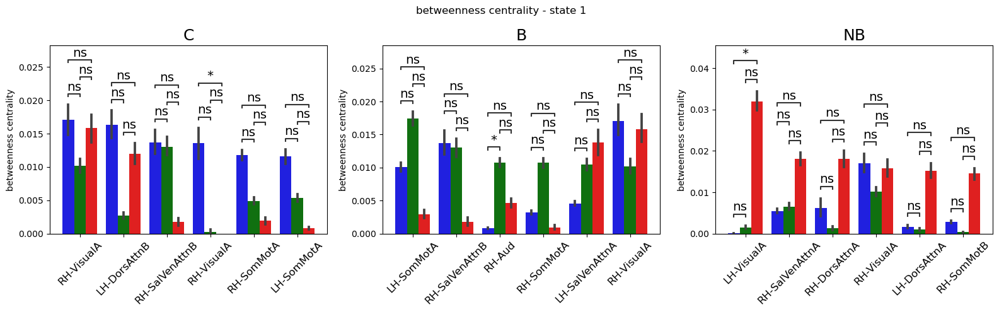

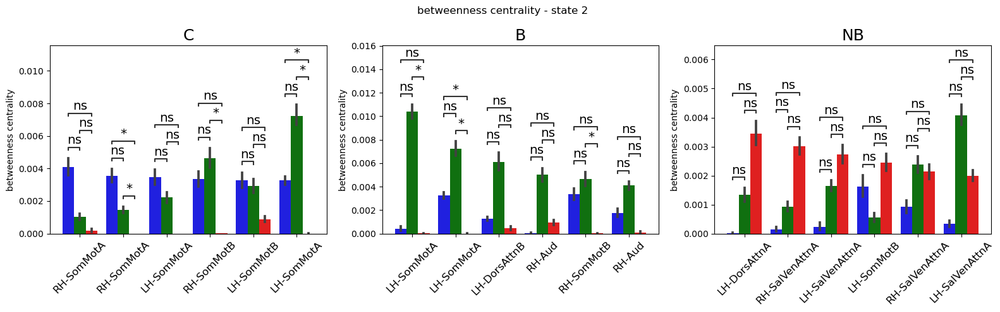

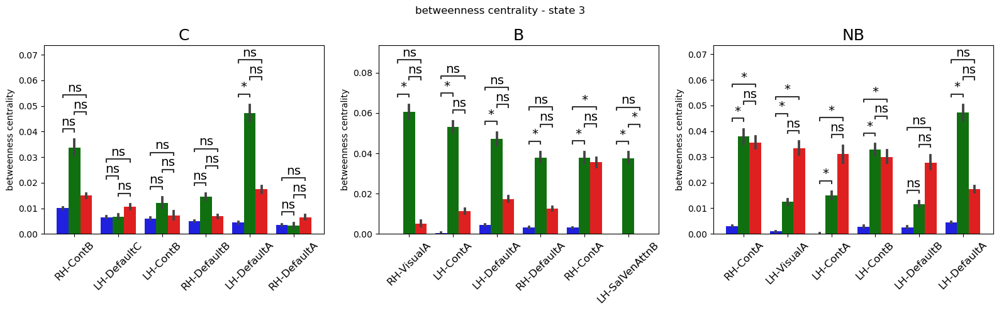

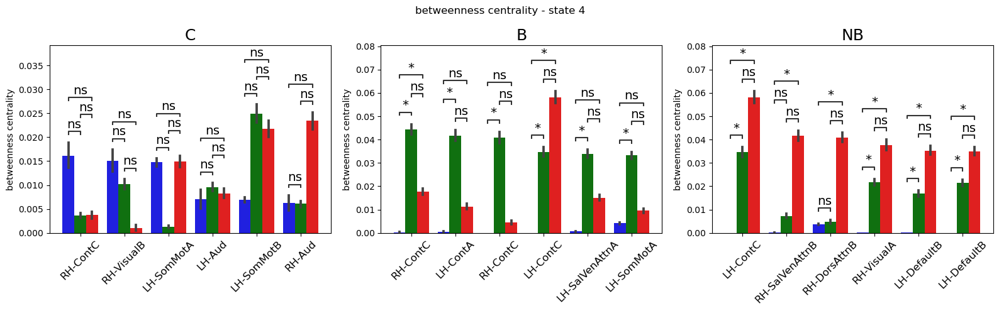

In [71]:
%%time
# PARDALOS PLOT - rank each node with respect to local efficiency

# metriche_label = ['betweenness centrality', 'local efficiency']
metriche_label = ['betweenness centrality']
# metriche_label = ['local efficiency']

# metrica='local_efficiency_notav'
# metrichee=['betweeness_centrality', 'local_efficiency_notav']
metrichee=['betweeness_centrality']
# metrichee=['local_efficiency_notav']

# metrica='eigenvector_centrality'
thresh = 0.99
n_pick = 200
n_samp = 10 # Sampling number is the 75% of time points belonging to the pattern with smallest representation.
eps = 0.1
for i,K in enumerate(range(2,10+1)): # Loop over K
    k = K - 2 # MD start to cluster from K=2
    if K==4:

        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        print(centroids.shape)
        
        # time points belonging to each state [state x time points]
        states_index = []
        for s in np.unique(state_labels)[1:]: # Remove the baseline state !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            states_index.append(np.where(state_labels==s))
        print(len(states_index))
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
        states_index_groups = [] # [state 1, state2, state 3]
        for s in states_index:
            groupz = {0:[], 1:[], 2:[]}
            for t in s[0]:
                groupz[group_labels[t][0]].append(t)
            states_index_groups.append(groupz)
    
        # find the number of point of the state with the smallest representation
        min_s  = []
        for g in range(3): # loop over groups
            min = 20000
            for s in states_index_groups: # loop over states
                # print(len(s[g]))
                if len(s[g]) < min:
                    min = len(s[g])
            min_s.append(min)
        
        states_thresh = opt_threshes[i]
        print(states_thresh)
        maps_metrics = []
        piero = 0
        for metrica in metrichee:
            print(metriche_label[piero])
            metrics = [] # metrics for each state- 
            for s in range(K): # Loop over states
                print('STATE ', s+1)
                thresh_2 = states_thresh[s]
                print(thresh_2)
                mets = [] # metrics for each group
                # I have to evaluate the metrics for the three groups
                for g_idx in range(3):
                    n_samp = int(0.75*min_s[g_idx])
                    met = []
                    met = np.empty((0,plm_tc.shape[-2]))
                    for t in range(n_pick):
                        # Pick a random s-ample of phase locking matrix
                        idxs = random.choices(states_index_groups[s][g_idx], k=n_samp)
                        mat = np.empty((0,plm_tc.shape[-2],plm_tc.shape[-1]))
                        for j in idxs:
                            np.fill_diagonal(plm_tc[j], 0) # Remove ones on the diagonal
                            m = plm_tc[j]
                            m = np.abs(m)
                            if PL_thresh: 
                                m[np.where(m<thresh)] = 0
                            mat = np.concatenate((mat, np.expand_dims(m, axis=0)))
                        meanchia = mat.mean(axis=0)
                        # Devo thresholdare pure la matrice media
                        meanchia[np.where(meanchia<thresh_2)] = 0
        
                        # MEANCHIA DEVO TRESHOLDARLA PRIMA DI CREARE IL GRAFO
                        G = nx.from_numpy_array(meanchia)
                        # Which metrics I want to look at
                        mmm = graph_metrics(metrica, G)
                        mmm = np.expand_dims(np.asarray(mmm), axis=0)
                        met = np.concatenate((met, mmm))
                    mets.append(met) # groups
                metrics.append(mets) # states
        
        
            labels = ['C', 'B', 'NB']
            colors = ['blue','green','red']
            cmaps = ['RdBu','PiYG','bwr']
    
            # PLOT PARDALOS CURVES
            for s in range(K):
                fig,ax = plt.subplots(1,1, figsize=(5, 4))
                ax.set_title('state {}'.format(s+1))
                for g in range(3):
                    m = np.mean(metrics[s][g], axis=0)
                    m = np.sort(m)
                    ax.plot(m,range(m.shape[0]), label=labels[g], color=colors[g])
                    ax.set_xlabel(metriche_label[piero], fontsize=15)
                    ax.set_ylabel('nodes rank', fontsize=15)
        
                ax.legend(loc='lower right')
                fig.tight_layout()
                
                if PL_thresh: 
                    plt.savefig('output/MD_05122023/K'+str(K)+'/Pardalos_'+metrica+'_npick'+ \
                                str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                                dpi=200)
                else:
                    plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/Pardalos_'+metrica+'_npick'+ \
                                str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                                dpi=200)   
    
    
            # PLOT LOCAL EFFICIENCY AND BETWEENESS OVER THE BRAIN - CERVELLINI
            for s in range(K): # Loop over states
                fig = plt.figure()
                # ax.set_title('state {}'.format(s+1))
                m__ = np.mean(metrics, axis=2)
                for g in range(3):
                    m = np.mean(metrics[s][g], axis=0) # Local Eff/Betweeness centr for each node
                    le_rank = np.argsort(m)[::-1]
                    empty_brain = np.full(atlas.shape, np.nan)
                    for a_idx in le_rank[:6]: # Loop over the areas
                        m_a = m[a_idx]
                        cord = np.where(atlas==a_idx+1)
                        empty_brain[cord[0], cord[1], cord[2]] = m_a
                    nii_brain = nib.Nifti1Image(empty_brain, affine=atlas_affine)
                    plotting.plot_glass_brain(nii_brain, display_mode='lzry', cmap=cmaps[g], colorbar=True,
                                              vmin=0, vmax=m__.max(), symmetric_cbar=False, plot_abs=True,
                                              # symmetric_cbar=False, plot_abs=True,
                                              title=metriche_label[piero]+': '+labels[g]+' - K='+str(K)+' - state'+str(s+1))
                
                    fig.tight_layout()
                    plt.close(fig)
                    if PL_thresh: 
                        plt.savefig('output/MD_05122023/K'+str(K)+'/Brain_'+labels[g]+' '+metrica+'_npick'+ \
                                    str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                                    dpi=200)
                        nib.save(nii_brain, 
                                 'output/MD_05122023/K'+str(K)+'/Brain_'+labels[g]+' '+metrica+'_npick'+ \
                                    str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.nii.gz')
                    else:
                        plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/Brain_'+labels[g]+' '+metrica+'_npick'+ \
                                    str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                                    dpi=200)
                        nib.save(nii_brain, 
                                 'output/MD_05122023/K'+str(K)+'/NO_PL_thresh/Brain_'+labels[g]+' '+metrica+'_npick'+ \
                                    str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.nii.gz')
                
            # SEABORN BARPLOT # AREAS RANK - VERSION 3 -- DEFINITIVO
            my_col = ['blue', 'green', 'red']
            state_order = [s for s in range(1,K+1)]
            groups_order = ['C', 'B', 'NB']
            comparison = True
        
            n = 6 # How many areas I want to show
            # I want one color for macro area
            ## START COLOR STUFF ##
        
            # Divide areas for macro areas
            mas = np.unique(atlas_labels['super network'].values)
            areas = atlas_labels['area'].values
            networks = atlas_labels['network'].values
            hemi = atlas_labels['hemisphere'].values
            
            # mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]
        
            cmap = plt.cm.jet  # define the colormap
            cmaplist = [cmap(i) for i in range(cmap.N)]
            # force the first color entry to be grey
            cmaplist[0] = (.5, .5, .5, 1.0)
            # create the new map
            cmap = mpl.colors.LinearSegmentedColormap.from_list(
                   'Custom cmap', cmaplist, cmap.N)
            # define the bins and normalize
            bounds = np.linspace(0, len(mas_dic)-1, len(mas_dic))
            norm = mpl.colors.BoundaryNorm(list(mas_dic.values()), cmap.N)
        
            states_mas_color = []
            mas_color = []
            for k_i,k in enumerate(mas_dic.keys()):
                i_ = 0
                mas_color.append(cmap(k_i/len(mas_list)))
                for _ in mas_list[k]:
                    states_mas_color.append(cmap(k_i/len(mas_list)))
                    i_ += 1
            ## END COLOR STUFF ##     
        
            df_metrics = []
            ranks = []
            for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
                df_metrics_ = []
                ranks_ = []
                for j in range(3): # groups
                    mmm = []
                    ggg = []
                    are = []
                    rank = np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n] # area ranking based on the given metrics
                    rankpp = np.sort(np.mean(metrics[i][j],axis=0))[::-1][:n]
                    ranks_.append(rank)
                    for jj in range(3): # groups
                        for r in rank:
                            lunghez = len(metrics[i][jj][:,r])
        
                            mmm += metrics[i][jj][:,r].tolist() # metrics values
                            ggg += [groups_order[jj]]*lunghez # group label
                            are += [r]*lunghez # area
                    # 'state' is node
                    df_metrics_.append(pd.DataFrame(data = {metriche_label[piero]: mmm, 'groups': ggg, 'state':are}))
                ranks.append(ranks_)
                df_metrics.append(df_metrics_)
        
        
            my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
            #     annot_test =  'Brunner-Munze'
            annot_test = 't-test_ind'
        
            maps_states = []
            for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
                fig,axs = plt.subplots(1,3, figsize=(16,5))
                my_sup = plt.suptitle(metriche_label[piero]+' - state '+ str(i+1))
                
                maps_groups = []
                for j in range(3): # groups
                    axs[j].set_title(groups_order[j], fontsize=18)
                    pairs = [[(s,'C'),(s,'B')] for s in ranks[i][j]] + \
                             [[(s,'C'),(s,'NB')] for s in ranks[i][j]] + \
                             [[(s,'B'),(s,'NB')] for s in ranks[i][j]]
        
                    hue_plot_params = {
                        'data': df_metrics[i][j],
                        'x': 'state',
                        'y': metriche_label[piero],
                        "order": ranks[i][j],
                        "hue": 'groups',
            #             "hue_order": groups_order,
                        "palette": my_pal,
                    }
        
                    with sns.plotting_context("notebook", font_scale = 1.2):
                        # Create new plot
                    #     ax = get_log_ax()
        
                        # Plot with seaborn
                        sns.barplot(ax=axs[j],
                                    **hue_plot_params)
        
                        # Label and show
                        axs[j].legend_.remove()
                        plt.legend([], [], frameon=False)
                        axs[j].set_xticklabels(hemi[ranks[i][j]]+'-'+networks[ranks[i][j]],rotation=45, fontsize=12)
                        axs[j].set_xlabel('')
                        
                        
                        
                        pvalues = conf_int_pval(pairs, metriche_label[piero], df_metrics[i][j])
                        # Add annotations
                        annotator = Annotator(axs[j], pairs, **hue_plot_params)
                        annotator.set_pvalues(pvalues)
                        annotator.annotate()
                    
            
                plt.tight_layout()    
                # plt.close(fig)t
                if PL_thresh: 
                    plt.savefig('output/MD_05122023/K'+str(K)+'/NODERANK_'+metrica+'Rank_state'+str(i+1)+'_npick'+ \
                                str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                                dpi=200, bbox_extra_artists=[my_sup])
                else:
                    plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/NODERANK_'+metrica+'Rank_state'+str(i+1)+'_npick'+ \
                                str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                                dpi=200, bbox_extra_artists=[my_sup])
            maps_metrics.append(maps_states)
        
            piero +=1 

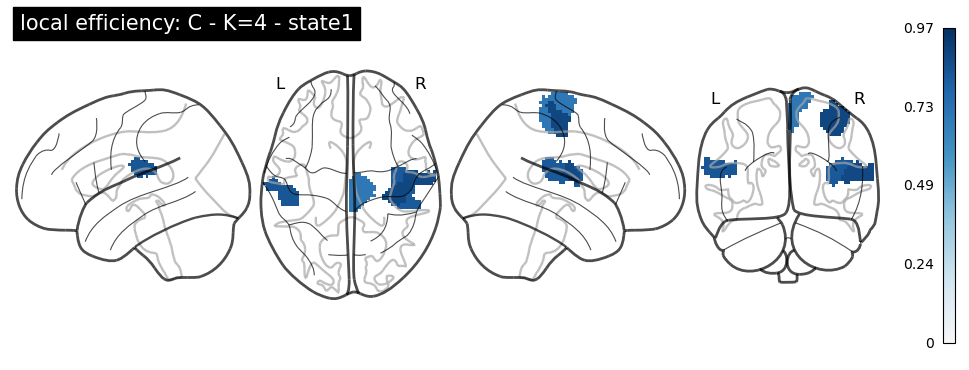

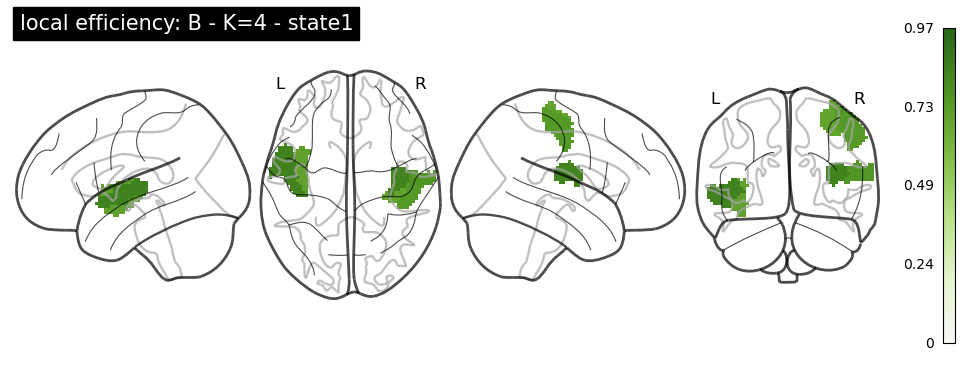

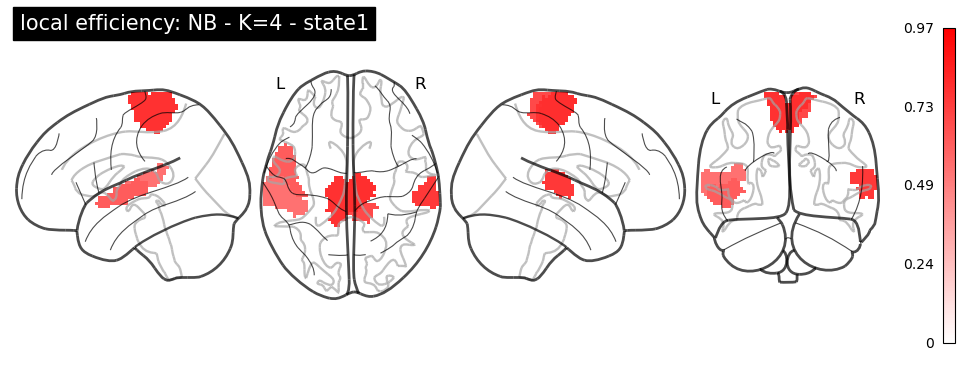

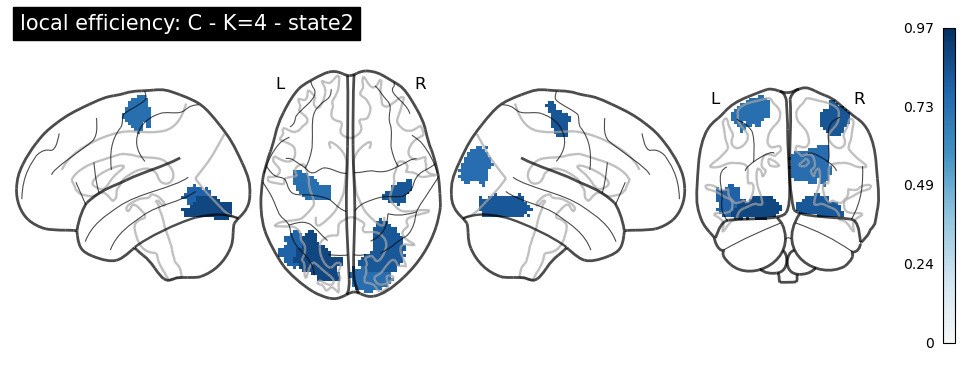

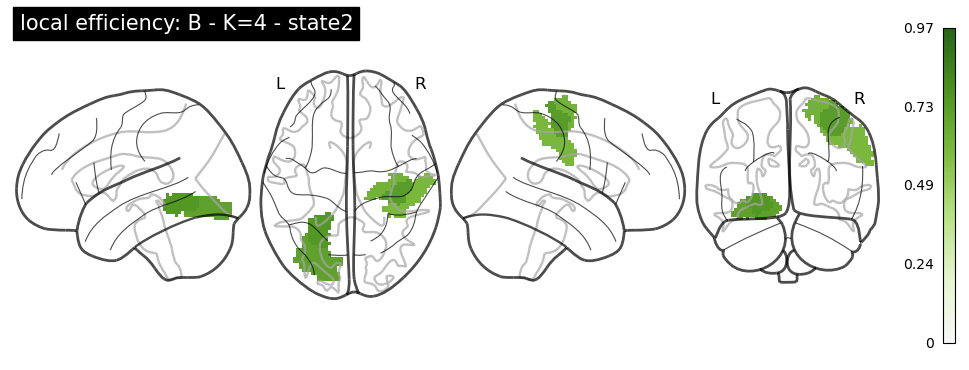

...

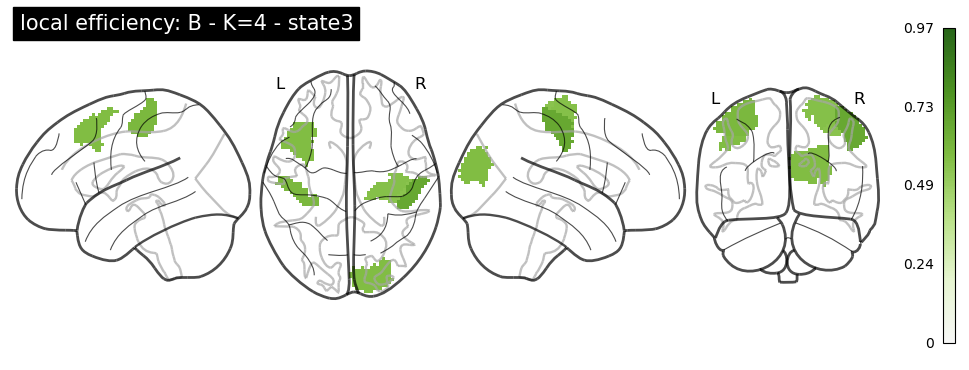

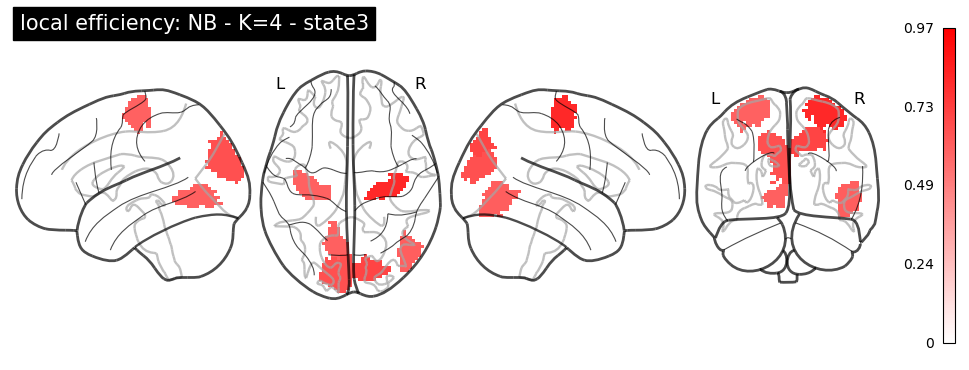

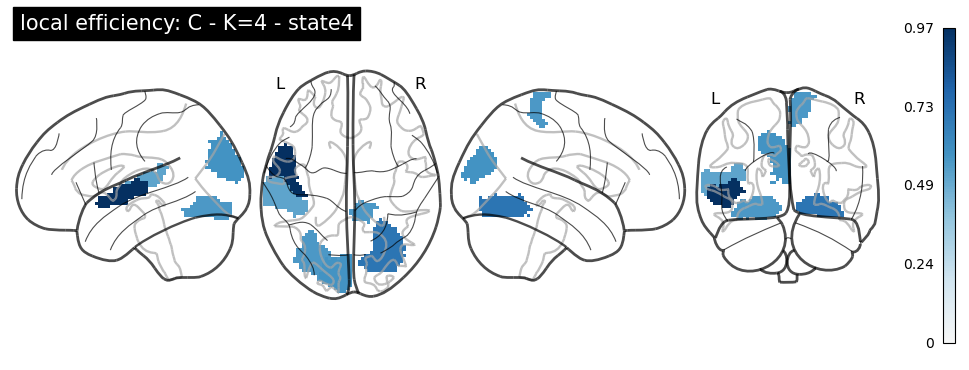

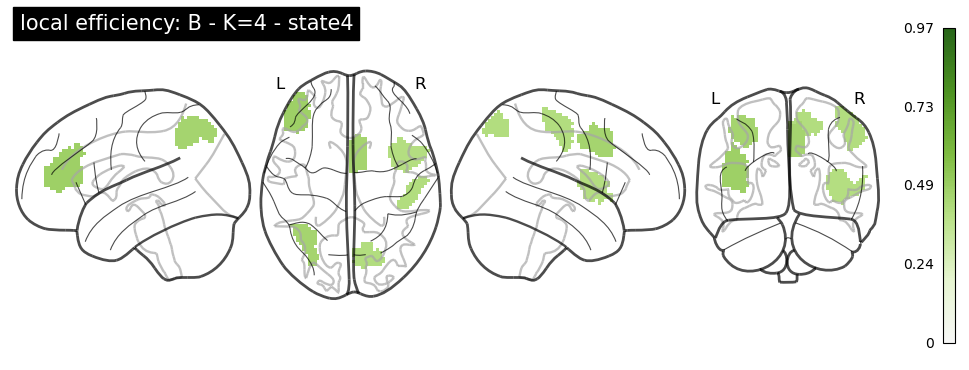

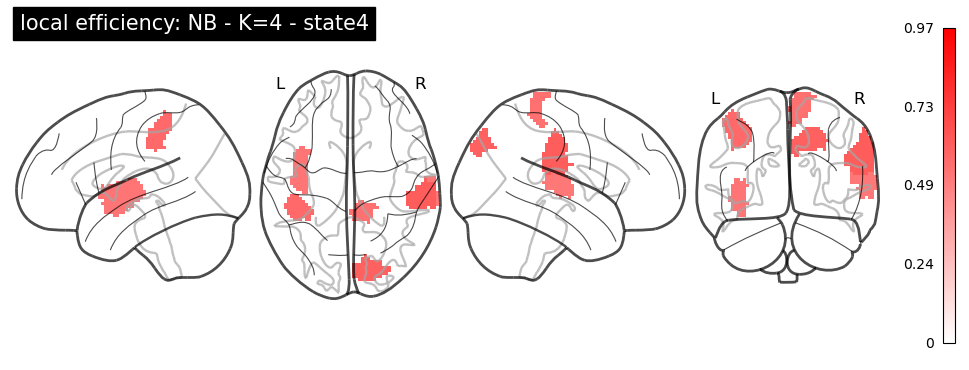

In [96]:
### PLOT ONLY THE FIRST 6 AREAS (WITH RESPECT TO THE LOCAL EFFICIENCY) ###

# PLOT LOCAL EFFICIENCY AND BETWEENESS OVER THE BRAIN - CERVELLINI
K = 4
for s in range(4): # Loop over states
    fig = plt.figure()
    # ax.set_title('state {}'.format(s+1))
    m__ = np.mean(metrics, axis=2)
    for g in range(3):
        m = np.mean(metrics[s][g], axis=0) # Local Eff/Betweeness centr for each node
        le_rank = np.argsort(m)[::-1]
        empty_brain = np.full(atlas.shape, np.nan)
        for a_idx in le_rank[:6]: # Loop over the areas
            m_a = m[a_idx]
            cord = np.where(atlas==a_idx+1)
            empty_brain[cord[0], cord[1], cord[2]] = m_a
        nii_brain = nib.Nifti1Image(empty_brain, affine=atlas_affine)
        plotting.plot_glass_brain(nii_brain, display_mode='lzry', cmap=cmaps[g], colorbar=True,
                                  vmin=0, vmax=m__.max(), symmetric_cbar=False, plot_abs=True,
                                  # symmetric_cbar=False, plot_abs=True,
                                  title=metriche_label[piero-1]+': '+labels[g]+' - K='+str(K)+' - state'+str(s+1))
    
        fig.tight_layout()
        plt.close(fig)
        plt.savefig('output/MD_05122023/K'+str(K)+'/Brain_'+labels[g]+' '+metrica+'_npick'+ \
                    str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                    dpi=200)
        # nib.save(nii_brain, 
        #          'output/MD_05122023/K'+str(K)+'/Brain_'+labels[g]+' '+metrica+'_npick'+ \
        #             str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.nii.gz')

In [101]:
# SEABORN BARPLOT # AREAS RANK - VERSION 3 -- DEFINITIVO
my_col = ['blue', 'green', 'red']
state_order = [s for s in range(1,K+1)]
groups_order = ['C', 'B', 'NB']
comparison = True

n = 6 # How many areas I want to show
# I want one color for macro area
## START COLOR STUFF ##

# Divide areas for macro areas
mas = np.unique(atlas_labels['super network'].values)
areas = atlas_labels['area'].values
networks = atlas_labels['network'].values
hemi = atlas_labels['hemisphere'].values

# mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]

cmap = plt.cm.jet  # define the colormap
cmaplist = [cmap(i) for i in range(cmap.N)]
# force the first color entry to be grey
cmaplist[0] = (.5, .5, .5, 1.0)
# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
       'Custom cmap', cmaplist, cmap.N)
# define the bins and normalize
bounds = np.linspace(0, len(mas_dic)-1, len(mas_dic))
norm = mpl.colors.BoundaryNorm(list(mas_dic.values()), cmap.N)

states_mas_color = []
mas_color = []
for k_i,k in enumerate(mas_dic.keys()):
    i_ = 0
    mas_color.append(cmap(k_i/len(mas_list)))
    for _ in mas_list[k]:
        states_mas_color.append(cmap(k_i/len(mas_list)))
        i_ += 1
## END COLOR STUFF ##     

df_metrics = []
ranks = []
for i in range(4): # states - ONE DATAFRAME FOR EACH STATE
    df_metrics_ = []
    ranks_ = []
    for j in range(3): # groups
        mmm = []
        ggg = []
        are = []
        rank = np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n] # area ranking based on the given metrics
        rankpp = np.sort(np.mean(metrics[i][j],axis=0))[::-1][:n]
        ranks_.append(rank)
        for jj in range(3): # groups
            for r in rank:
                lunghez = len(metrics[i][jj][:,r])

                mmm += metrics[i][jj][:,r].tolist() # metrics values
                ggg += [groups_order[jj]]*lunghez # group label
                are += [r]*lunghez # area
        # 'state' is node
        df_metrics_.append(pd.DataFrame(data = {metriche_label[piero-1]: mmm, 'groups': ggg, 'state':are}))
    ranks.append(ranks_)
    df_metrics.append(df_metrics_)


my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
#     annot_test =  'Brunner-Munze'
annot_test = 't-test_ind'

maps_states = []
for i in range(4): # states - ONE DATAFRAME FOR EACH STATE
    fig,axs = plt.subplots(1,3, figsize=(16,5))
    my_sup = plt.suptitle(metriche_label[piero-1]+' - state '+ str(i+1))
    
    maps_groups = []
    for j in range(3): # groups
        axs[j].set_title(groups_order[j], fontsize=18)
        pairs = [[(s,'C'),(s,'B')] for s in ranks[i][j]] + \
                 [[(s,'C'),(s,'NB')] for s in ranks[i][j]] + \
                 [[(s,'B'),(s,'NB')] for s in ranks[i][j]]

        hue_plot_params = {
            'data': df_metrics[i][j],
            'x': 'state',
            'y': metriche_label[piero-1],
            "order": ranks[i][j],
            "hue": 'groups',
#             "hue_order": groups_order,
            "palette": my_pal,
        }

        with sns.plotting_context("notebook", font_scale = 1.2):
            # Create new plot
        #     ax = get_log_ax()

            # Plot with seaborn
            sns.barplot(ax=axs[j],
                        **hue_plot_params)

            # Label and show
            axs[j].legend_.remove()
            plt.legend([], [], frameon=False)
            axs[j].set_xticklabels(hemi[ranks[i][j]]+'-'+networks[ranks[i][j]],rotation=45, fontsize=12)
            axs[j].set_xlabel('')
            
            
            
            pvalues = conf_int_pval(pairs, metriche_label[piero-1], df_metrics[i][j])
            # Add annotations
            annotator = Annotator(axs[j], pairs, **hue_plot_params)
            annotator.set_pvalues(pvalues)
            annotator.annotate()
        

    plt.tight_layout()    
    # plt.close(fig)
    plt.savefig('output/MD_05122023/K'+str(K)+'/NODERANK_'+metrica+'Rank_state'+str(i+1)+'_npick'+ \
                str(n_pick)+'_nsamp75minclust_K'+str(K)+'state'+str(s+1)+'.png',
                dpi=200, bbox_extra_artists=[my_sup])

AxisError: axis -1 is out of bounds for array of dimension 0

In [66]:
np.asarray(metrics).shape

(4, 3, 200, 234)

In [71]:
i

4

In [ ]:
## Save the highest areas with respect to the metric (local efficiency or betweeness centrality)
# cs = ['Blues','Greens','Reds']
# groups_name = ['CONTROLS', 'BLINDSIGHT', 'NO-BLINDSIGHT']
# for i in range(K):
#     fig, axs = plt.subplots(3,figsize=(8,8))
#     for j in range(3):
#         plotting.plot_glass_brain(maps_metrics[0][i][j], display_mode='lzry', black_bg=False, cmap=cs[j],
#                                  axes=axs[j])
#         axs[j].set_title('Local efficiency rank - state '+str(i+1)+' - '+groups_name[j], y=0.98)
# #         plt.tight_layout()    
#         plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/NODERANK_'+metrica+'Brains_state'+str(i+1)+ \
#                     '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
#                     dpi=200)  

# #         break
# #     break

In [ ]:
# # BOXPLOT # Areas rank - version 1

# comparison = True

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE): 
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE)

# n = 6
# # I want one color for macro area
# ## START COLOR STUFF ##

# # Divide areas for macro areas
# mas = np.unique(atlas_labels['network'].values)

# mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]

# cmap = plt.cm.jet  # define the colormap
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# cmaplist[0] = (.5, .5, .5, 1.0)
# # create the new map
# cmap = mpl.colors.LinearSegmentedColormap.from_list(
#        'Custom cmap', cmaplist, cmap.N)
# # define the bins and normalize
# bounds = np.linspace(0, len(mas_list)-1, len(mas_list))
# norm = mpl.colors.BoundaryNorm(mas_dic_count, cmap.N)

# states_mas_color = []
# mas_color = []
# for k in mas_dic.keys():
#     i = 0
#     mas_color.append(cmap(k/len(mas_list)))
#     for _ in mas_dic[k]:
#         states_mas_color.append(cmap(k/len(mas_list)))
#         i += 1
# ## END COLOR STUFF ##      
        
# tit = ['C','B','NB']
# # c = 'red'
# for i in range(K): # Loop over states
#     fig,axs = plt.subplots(1,3, figsize=(10,6))
#     fig.tight_layout(pad=4.0)
#     for j in range(3): # Loop over groups
        
# #         print(np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:10])
# #         axs[(i*3)+j].boxplot(np.transpose(metrics[i][j][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]]),
# #                     vert=False, showfliers=False, positions=[k for k in range(n)])
#         fig.suptitle(metrica + ' - state {}'.format(i+1))
#         lll = atlas_labels.iloc[np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]]['n_area'] # areas name
#         ll = []
#         c = []
#         for l in lll:
#             m_a = atlas_labels[atlas_labels['n_area']==l]['network'].values[0]
#             ll.append(m_a)
#             c.append(mas_color[mas.tolist().index(m_a)])
#         bp = axs[j].boxplot(metrics[i][j][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]],
#                           vert=False, showfliers=False, positions=[k for k in range(n)][::-1],
#                           labels=lll, patch_artist=True, widths = 0.5)
#         if comparison:
#             bp_ = []
#             other_j = []
#             eh = 1
#             for pino in [0,1,2]: # Check the same area for the other groups
#                 if pino!=j:
#                     bp_.append(axs[j].boxplot(metrics[i][pino][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]],
#                                       vert=False, showfliers=False, positions=[k+eh/5 for k in range(n)][::-1],
#                                       labels=['']*n, patch_artist=True, widths = 0.3))
#                     eh += 1
#                     other_j.append(pino)
                
#         if comparison:
#             for f,patch in enumerate(bp['boxes']):
#                     patch.set(facecolor=my_pal[tit[j]], alpha=0.8)
#             for pluto,bbb in enumerate(bp_):
#                 for f,patch in enumerate(bbb['boxes']):
#                         patch.set(facecolor=my_pal[tit[other_j[pluto]]], alpha=0.5)
#         else:
#             for f,patch in enumerate(bp['boxes']):
#                     patch.set(facecolor=c[f]) 

            
#         axs[j].set_title(tit[j])
#         uu = np.unique(ll)
#         arguu = [ll.index(u) for u in uu]
#         if not comparison:
#             axs[j].legend([bp['boxes'][u] for u in arguu], uu, loc='lower center',
#                           bbox_to_anchor=(0.22, -0.09-(len(uu)-2)*0.055, 0.5, 0.2), fontsize=7)
#         axs[j].set_xticks([])
#     plt.tight_layout()
# #     if comparison:
# #         plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                     'Comparison_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                     dpi=200)
# #     else:
# #         plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                     '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                     dpi=200)

In [ ]:
# # BARPLOT # Areas rank - Version 2
# my_col = ['blue', 'green', 'red']
# comparison = True

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE): 
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE)

# n = 6
# # I want one color for macro area
# ## START COLOR STUFF ##

# # Divide areas for macro areas
# mas = np.unique(atlas_labels['network'].values)

# mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]

# cmap = plt.cm.jet  # define the colormap
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# cmaplist[0] = (.5, .5, .5, 1.0)
# # create the new map
# cmap = mpl.colors.LinearSegmentedColormap.from_list(
#        'Custom cmap', cmaplist, cmap.N)
# # define the bins and normalize
# bounds = np.linspace(0, len(mas_list)-1, len(mas_list))
# norm = mpl.colors.BoundaryNorm(mas_dic_count, cmap.N)

# states_mas_color = []
# mas_color = []
# for k in mas_dic.keys():
#     i = 0
#     mas_color.append(cmap(k/len(mas_list)))
#     for _ in mas_dic[k]:
#         states_mas_color.append(cmap(k/len(mas_list)))
#         i += 1
# ## END COLOR STUFF ##      
        
# tit = ['C','B','NB']
# # c = 'red'
# for i in range(K): # Loop over states
#     fig,axs = plt.subplots(1,3, figsize=(10,4))
#     fig.tight_layout(pad=4.0)
#     for j in range(3): # Loop over groups
        
#         fig.suptitle(metrica + ' - state {}'.format(i+1))
#         lll = atlas_labels.iloc[np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]]['n_area'].values # areas name
#         ll = []
#         c = []
#         for l in lll:
#             m_a = atlas_labels[atlas_labels['n_area']==l]['network'].values[0]
#             ll.append(m_a)
#             c.append(mas_color[mas.tolist().index(m_a)])
            
#         bp_ = []
#         other_j = []
#         eh = 1
#         for pino in [0,1,2]: # Check the same area for the other groups
#             if pino==j:
#                 alpha=1
#             else:
#                 alpha=0.5
                
#             bp_.append(axs[j].barh(width=np.mean(metrics[i][pino][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]], axis=0),
#                                    xerr=np.std(metrics[i][pino][:,np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n]], axis=0),
#                                    y=[k*2+pino*0.4 for k in range(n)][::-1],
#                                    height=0.4,
#                                    alpha=alpha,
#                                    color=my_col[pino],
#                                    tick_label=lll.tolist()))
# #             if pino!=1:
# #                 axs[j].set_yticklabels([])
# #             else:
# #                 axs[j].set_yticklabels(lll.tolist())

#             axs[j].set_yticklabels(lll.tolist(),rotation=30, fontsize=8)
                
# #         for f,patch in enumerate(bp['boxes']):
# #                 patch.set(facecolor=my_pal[tit[j]], alpha=0.8)
# #         for pluto,bbb in enumerate(bp_):
# #             for f,patch in enumerate(bbb['boxes']):
# #                     patch.set(facecolor=my_pal[tit[other_j[pluto]]], alpha=0.5)

            
#         axs[j].set_title(tit[j])
#         uu = np.unique(ll)
#         arguu = [ll.index(u) for u in uu]
# #         axs[j].legend([bp['boxes'][u] for u in arguu], uu, loc='lower center',
# #                       bbox_to_anchor=(0.22, -0.09-(len(uu)-2)*0.055, 0.5, 0.2), fontsize=7)
#     plt.tight_layout()

# #     plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                 'Comparison_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                 dpi=200)

# #         plt.savefig('output/GraphAnal/'+DATE+'/'+metrica+'Rank_state'+str(i+1)+ \
# #                     '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
# #                     dpi=200)

In [ ]:
# # SEABORN BARPLOT # AREAS RANK - VERSION 3 -- DEFINITIVO
# my_col = ['blue', 'green', 'red']
# state_order = [s for s in range(1,K+1)]
# groups_order = ['C', 'B', 'NB']
# comparison = True

# n = 6
# # I want one color for macro area
# ## START COLOR STUFF ##

# # Divide areas for macro areas
# mas = np.unique(atlas_labels['network'].values)
# araes = atlas_labels['n_area'].values

# mas_dic_count = [len(mas_dic[k]) for k in mas_dic.keys()]

# cmap = plt.cm.jet  # define the colormap
# cmaplist = [cmap(i) for i in range(cmap.N)]
# # force the first color entry to be grey
# cmaplist[0] = (.5, .5, .5, 1.0)
# # create the new map
# cmap = mpl.colors.LinearSegmentedColormap.from_list(
#        'Custom cmap', cmaplist, cmap.N)
# # define the bins and normalize
# bounds = np.linspace(0, len(mas_list)-1, len(mas_list))
# norm = mpl.colors.BoundaryNorm(mas_dic_count, cmap.N)

# states_mas_color = []
# mas_color = []
# for k in mas_dic.keys():
#     i = 0
#     mas_color.append(cmap(k/len(mas_list)))
#     for _ in mas_dic[k]:
#         states_mas_color.append(cmap(k/len(mas_list)))
#         i += 1
# ## END COLOR STUFF ##     

# df_metrics = []
# ranks = []
# for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
#     df_metrics_ = []
#     ranks_ = []
#     for j in range(3): # groups
#         mmm = []
#         ggg = []
#         are = []
#         rank = np.argsort(np.mean(metrics[i][j],axis=0))[::-1][:n] # area ranking based on the given metrics
#         rankpp = np.sort(np.mean(metrics[i][j],axis=0))[::-1][:n]
#         ranks_.append(rank)
#         for jj in range(3): # groups
#             for r in rank:
#                 lunghez = len(metrics[i][jj][:,r])

#                 mmm += metrics[i][jj][:,r].tolist() # metrics values
#                 ggg += [groups_order[jj]]*lunghez # group label
#                 are += [r]*lunghez # area
#         df_metrics_.append(pd.DataFrame(data = {metrica: mmm, 'groups': ggg, 'node':are}))
#     ranks.append(ranks_)
#     df_metrics.append(df_metrics_)


# my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
# #     annot_test =  'Brunner-Munze'
# annot_test = 't-test_ind'

# for i in range(K): # states - ONE DATAFRAME FOR EACH STATE
#     fig,axs = plt.subplots(1,3, figsize=(16,5))
#     my_sup = plt.suptitle(metrica+' - state '+ str(i+1))
#     for j in range(3): # groups
#         axs[j].set_title(groups_order[j])
#         pairs = [[(s,'C'),(s,'B')] for s in ranks[i][j]] + \
#                  [[(s,'C'),(s,'NB')] for s in ranks[i][j]] + \
#                  [[(s,'B'),(s,'NB')] for s in ranks[i][j]]

#         hue_plot_params = {
#             'data': df_metrics[i][j],
#             'x': 'node',
#             'y': metrica,
#             "order": ranks[i][j],
#             "hue": 'groups',
# #             "hue_order": groups_order,
#             "palette": my_pal,
#         }

#         with sns.plotting_context("notebook", font_scale = 1.2):
#             # Create new plot
#         #     ax = get_log_ax()

#             # Plot with seaborn
#             sns.barplot(ax=axs[j],
#                         **hue_plot_params)
            
#             # Label and show
#             axs[j].legend_.remove()
#             plt.legend([], [], frameon=False)
#             axs[j].set_xticklabels(areas[ranks[i][j]],rotation=30, fontsize=8)
#             axs[j].set_xlabel('')

#             # Add annotations
#             annotator = Annotator(axs[j], pairs, **hue_plot_params)
#             annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
            
#     plt.tight_layout()    
#     plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/NODERANK_'+metrica+'Rank_state'+str(i+1)+ \
#                 'Comparison_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
#                 dpi=200, ,bbox_extra_artists=[my_sup])






# STATE TRANSITIONS - Evaluate transition probability between states

In [158]:
import matplotlib
from itertools import combinations
import tqdm


In [33]:
# pip install seaborn==0.13.1

In [34]:
# import seaborn as sns
sns.__version__

'0.13.1'

findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeOneSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeTwoSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeThreeSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFourSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFiveSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmsy10'] not

(4498,) (2387,) (2112,)


findfont: Font family ['cmex10'] not found. Falling back to DejaVu Sans.
findfont: Font family ['DejaVu Sans Display'] not found. Falling back to DejaVu Sans.


(4545,) (2373,) (2086,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(4537,) (2394,) (2074,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(4599,) (2328,) (2100,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(4321,) (2248,) (1988,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(4511,) (2357,) (2057,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(4547,) (2347,) (2086,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(4510,) (2280,) (2104,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


(4208,) (2212,) (1935,)


/tmp/ipykernel_5477/2798841038.py:257: RuntimeWarning: invalid value encountered in divide
  matrix[r] = matrix[r]/row.sum()


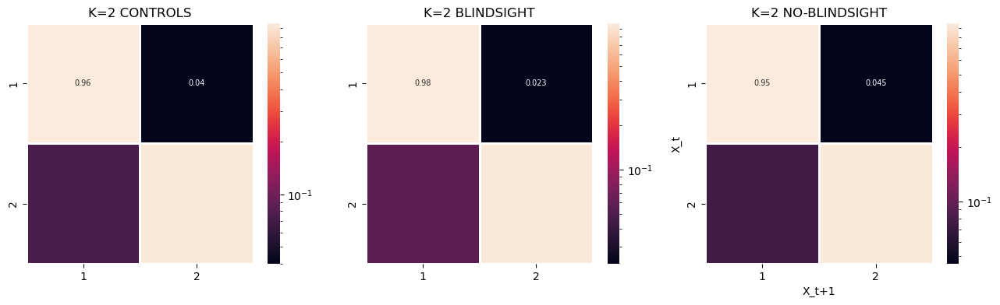

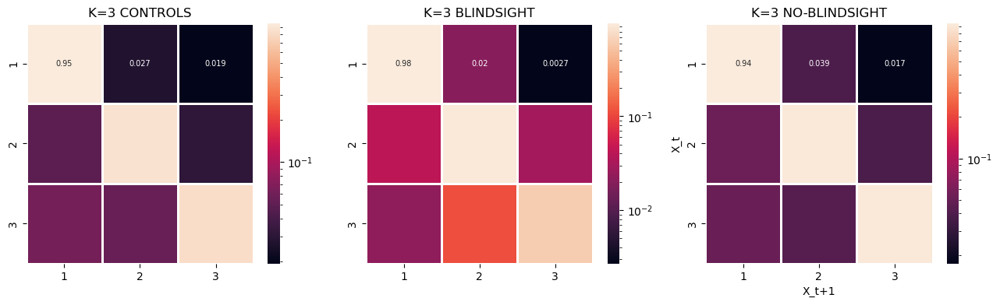

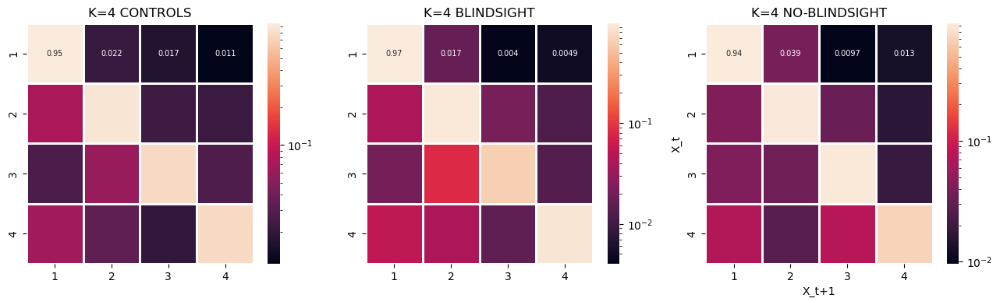

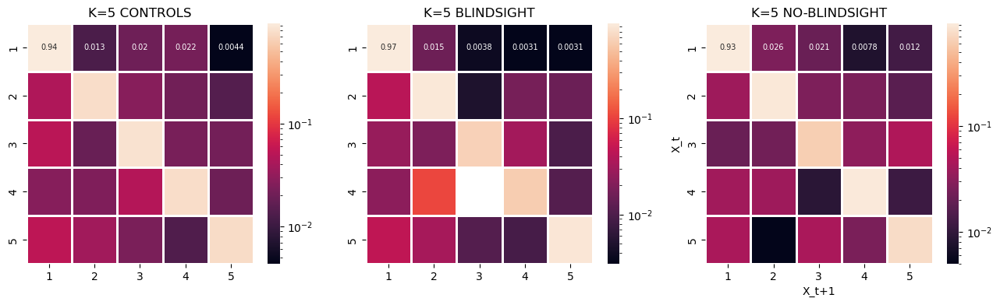

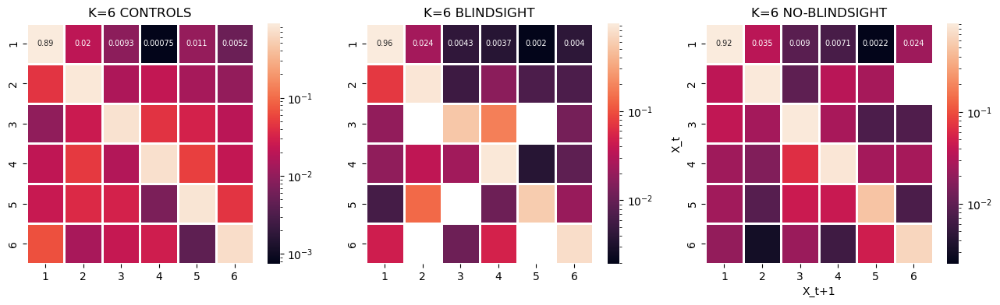

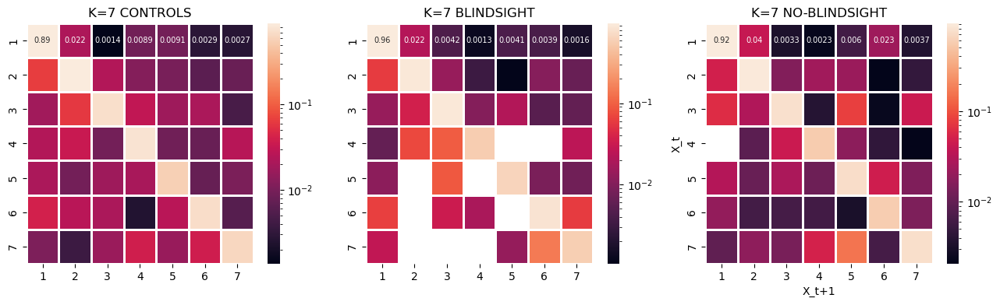

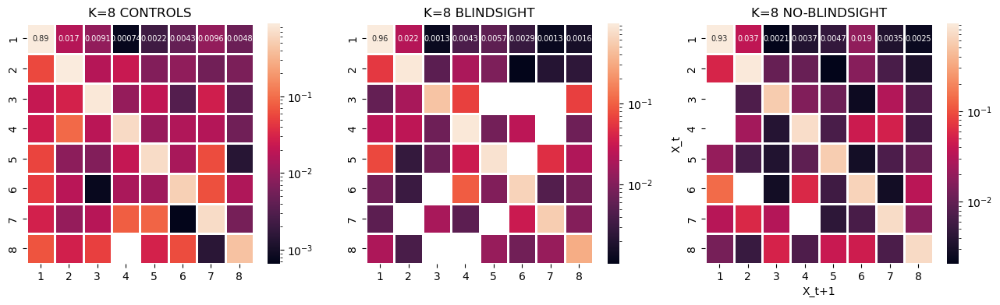

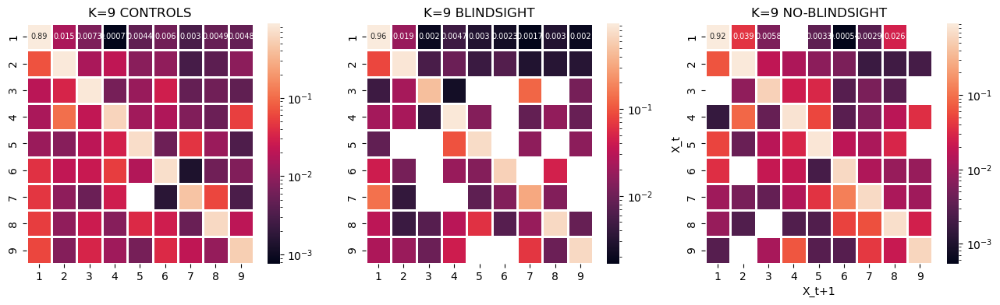

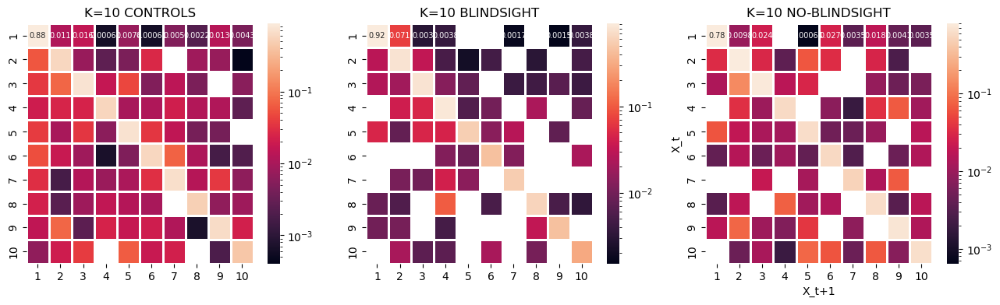

In [159]:
sub_idxs = [] # subject of each time point
for s in range(int((state_labels_list[0].shape[0])/time_points)):
    sub_idxs += [s]*time_points
len(sub_idxs)
    
BASELINE = False # Consider or not the baseline as a state
baseline_fig_label = {True:'baseline', False:'NObaseline'}

prob_trans_list_allK = []
if BASELINE:
    ######################
    ## WITH BASELINE ##
    ######################
    for i,K in enumerate(range(2,10+1)): # Loop over K
        k = K - 2 # MD start to cluster from K=2
        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        # print(centroids.shape)
        
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
    
        # Define some stuff
        C_states = np.empty((0,))
        B_states = np.empty((0,))
        NB_states = np.empty((0,))
        
        for s,lab in zip(state_labels, group_labels):
            s = np.expand_dims(s, axis=0)
            if   lab==0: # C
                C_states = np.concatenate((C_states, s))
            elif lab==1: # B
                B_states = np.concatenate((B_states, s))
            else:        # NB
                NB_states = np.concatenate((NB_states, s))
                
        print(C_states.shape, B_states.shape, NB_states.shape)
    
        # COUNT THE TRANSITION BETWEEN EACH COUPLE OF STATES
        # subject-by-subject
        C = int(np.sum(group_labels==0)/time_points)
        B = int(np.sum(group_labels==1)/time_points)
        NB = int(np.sum(group_labels==2)/time_points)
        groups = [C_states, B_states, NB_states]
        groups_num = [C, B, NB]
    
    
        tot = []
        prob_trans_list = [] # I save all the prob transition matrices of each subject of each group in a list
        for g, g_num in zip(groups, groups_num):
            matrices = np.empty((0, K+1, K+1))
            # Loop over subjects
            to = 0
            for s in range(g_num): # Loop over subjects
                matrix = np.zeros((K+1, K+1))
                # count the number of transition within each possible couple of states
                prev = int(g[s*time_points])
                for t, tp in enumerate(g[(s*time_points)+1:(s+1)*time_points]): # Loop over the time points within the subject
                    tp = int(tp) 
        #             print(prev, tp)
                    matrix[prev, tp] += 1
                    if prev!=tp:
                        to += 1 # total number of transitions between different states
                    prev = tp
                tot.append(to)
                # matrix normalization to obtain probabilities
                for r,row in enumerate(matrix):
                    matrix[r] = matrix[r]/row.sum()
        #             matrix[r] = matrix[r]
                # Check nan values
                if np.isnan(matrix).any():
                    iid = np.where(np.isnan(matrix))
                    matrix[iid] = 0
                matrix = np.expand_dims(matrix, axis=0)
                matrices = np.concatenate((matrices, matrix))
        #         print(matrices.shape)
            prob_trans_list.append(matrices)
            
            
        state_names = [i for i in range(K+1)]
        groups_names = ['CONTROLS', 'BLINDSIGHT', 'NO-BLINDSIGHT']
        fig,axs = plt.subplots(1,3, figsize=(13,4))
        for i,ax in enumerate(axs.flat):
            ax.set_title('K='+str(K)+' '+groups_names[i])
        #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
            sns.heatmap(prob_trans_list[i].mean(axis=0), linewidth=0.8,
                        xticklabels=state_names, yticklabels=state_names, annot=True, annot_kws={'fontsize':7}, ax=ax)
            plt.xlabel('X_t+1')
            plt.ylabel('X_t')

        plt.tight_layout(pad=1.0)
        # plt.savefig('output/MD_05122023/K'+str(K)+'/TransProb_K'+str(K)+'_'+baseline_fig_label[BASELINE]+'.png',
        #             dpi=200)
            
    
        # # WITH NO DIAG
        # fig,axs = plt.subplots(1,3, figsize=(10,2.5))
        # for i,ax in enumerate(axs.flat):
        #     mat = prob_trans_list[i].mean(axis=0)
        #     for idx in range(K+1):
        #         mat[idx,idx] = np.nan
        #     ax.set_title('K='+str(K)+' '+groups_names[i])
        # #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
        #     sns.heatmap(mat, linewidth=0.8,
        #                 xticklabels=state_names, yticklabels=state_names,
        #                 annot=True, ax=ax)
        #     plt.xlabel('X_t+1')
        #     plt.ylabel('X_t')
            
            # plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+'ProbTransition_NoDiag_'+groups_names[i]+ \
            #             '_'+DATE+'.png',
            #             dpi=200)
            
        # break
        prob_trans_list_allK.append(prob_trans_list)

    # Statistica tra gruppi - WITH BASELINE
    
    pairs = [(0,1),(0,2),(1,2)]
    pairs_tit = ['CvsB', 'CvsNB', 'BvsNB']
    nnn = ['C','B','NB']
    annot_test = 't-test_ind'
    
    
    for i,K in enumerate(range(2,10+1)): # Loop over K
        prob_trans_list = prob_trans_list_allK[i]
    
        state_names = [i for i in range(K+1)]
        matrice_ps = []
        fig, axs = plt.subplots(1,3, figsize=(12,3.8))
        for p_i, p in enumerate(pairs):
            matrice_s = np.empty((K+1,K+1))
            matrice_p = np.empty((K+1,K+1))
            for i in range(K+1):
                for j in range(K+1):
                    matrice_s[i,j] = ttest_ind(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[0]
                    matrice_p[i,j] = ttest_ind(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[1]
            matrice_ps.append(matrice_p)
            
            my_sup = plt.suptitle('K='+str(K)+' Transition Probability')
            # display only significative values
            for i in range(K):
                for j in range(K):
                    if matrice_p[i][j]>=0.05:
                        matrice_s[i][j]=0
                        
            sns.heatmap(matrice_s, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
                        ax=axs[p_i], vmin=-1, vmax=1, annot_kws={'fontsize':7}, linecolor='grey')
            for t in axs[p_i].texts:
                if float(t.get_text())!=0:
                    t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
                else:
                    t.set_text("") # if not it sets an empty text
            axs[p_i].set_title(pairs_tit[p_i]+' statistics')
            
        #     sns.heatmap(matrice_p, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='Greens_r', annot=True,
        #                 ax=axs[1], vmax=0.05)
        #     axs[1].set_title('p-values')
            
        fig.tight_layout(pad=1.0)
        # plt.savefig('output/MD_05122023/K'+str(K)+'/TranProb_statistics_K'+str(K)+'_'+baseline_fig_label[BASELINE]+'.png',
        #             dpi=200, bbox_extra_artists=[my_sup])
            
        # for i in range(3):
        #     reject, pvals_corr = pg.multicomp(matrice_ps[i], method='fdr_bh')
        #     print(reject)

elif not BASELINE:
    ######################
    ## WITH NO BASELINE ##
    ######################
    for i,K in enumerate(range(2,10+1)): # Loop over K
        k = K - 2 # MD start to cluster from K=2
        # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
        state_labels = state_labels_list[k]
        # print(state_labels.shape, state_labels.max())
        centroids = kmeans_leida[k]['C']
        # print(centroids.shape)
        
        # time points belonging to each state [state x time points]
        states_index = []
        for s in np.unique(state_labels)[1:]: # Remove the baseline state !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            states_index.append(np.where(state_labels==s))
        # print(len(states_index))
        
        # Divide states indexes by group
        groups_index = []
        for g in np.unique(group_labels):
            groups_index.append(np.where(group_labels==g)[0])
            
        states_index_groups = [] # [state 1, state2, state 3]
        for s in states_index:
            groupz = {0:[], 1:[], 2:[]}
            for t in s[0]:
                groupz[group_labels[t][0]].append(t)
            states_index_groups.append(groupz)
    
        # Define some stuff
        C_states = np.empty((0,))
        B_states = np.empty((0,))
        NB_states = np.empty((0,))
    
        C_subs = []
        B_subs = []
        NB_subs = []
    
        count = 0
        for s,lab in zip(state_labels, group_labels):
            if s!=0: # Ignore the baseline state
                s = np.expand_dims(s, axis=0)
                if   lab==0: # C
                    C_states = np.concatenate((C_states, s))
                    C_subs += [sub_idxs[count]]
                elif lab==1: # B
                    B_states = np.concatenate((B_states, s))
                    B_subs += [sub_idxs[count]]
                else:        # NB
                    NB_states = np.concatenate((NB_states, s))
                    NB_subs += [sub_idxs[count]]
            count += 1
            
        
        print(C_states.shape, B_states.shape, NB_states.shape)
    
        # COUNT THE TRANSITION BETWEEN EACH COUPLE OF STATES
        # subject-by-subject
        groups = [C_states, B_states, NB_states]
        groups_subs_idx = [C_subs, B_subs, NB_subs]
    
    
        tot = []
        prob_trans_list = [] # I save all the prob transition matrices of each subject of each group in a list
        for g, g_subs in zip(groups, groups_subs_idx):
            matrices = np.empty((0, K, K))
            # Loop over subjects
            to = 0
            for s in np.unique(g_subs): # Loop over subject
                matrix = np.zeros((K, K))
                # count the number of transition between each possible couple of states (no baseline state)
                cacco = g[np.where(g_subs==s)] # all the time points belonging to the current subject
                prev = int(cacco[0]) - 1 # The state state of the first time point
                for t, tp in enumerate(cacco[1:]):
                    tp = int(tp) - 1 
                    matrix[prev, tp] += 1
                    if prev!=tp:
                        to += 1 # total number of transitions between different states
                    prev = tp
                tot.append(to)
                # matrix normalization to obtain probabilities
                for r,row in enumerate(matrix):
                    matrix[r] = matrix[r]/row.sum()
        #             matrix[r] = matrix[r]
                # Check nan values
                if np.isnan(matrix).any():
                    iid = np.where(np.isnan(matrix))
                    matrix[iid] = 0
                matrix = np.expand_dims(matrix, axis=0)
                matrices = np.concatenate((matrices, matrix))
        #         print(matrices.shape)
            prob_trans_list.append(matrices)
            
            
        state_names = [i+1 for i in range(K)]
        groups_names = ['CONTROLS', 'BLINDSIGHT', 'NO-BLINDSIGHT']
        fig,axs = plt.subplots(1,3, figsize=(13,4))
        for i,ax in enumerate(axs.flat):
            ax.set_title('K='+str(K)+' '+groups_names[i])
        #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
            sns.heatmap(prob_trans_list[i].mean(axis=0), linewidth=0.8,
                        xticklabels=state_names, yticklabels=state_names, annot=True, annot_kws={'fontsize':7}, ax=ax,
                        norm=matplotlib.colors.LogNorm())
            plt.xlabel('X_t+1')
            plt.ylabel('X_t')

        plt.tight_layout(pad=1.0)
            
        # plt.savefig('output/MD_05122023/K'+str(K)+'/TransProb_K'+str(K)+'_'+baseline_fig_label[BASELINE]+'.png',
        #             dpi=200)
    
        # # WITH NO DIAG
        # fig,axs = plt.subplots(1,3, figsize=(10,2.5))
        # for i,ax in enumerate(axs.flat):
        #     mat = prob_trans_list[i].mean(axis=0)
        #     for idx in range(K):
        #         mat[idx,idx] = np.nan
        #     ax.set_title('K='+str(K)+' '+groups_names[i])
        # #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
        #     sns.heatmap(mat, linewidth=0.8,
        #                 xticklabels=state_names, yticklabels=state_names,
        #                 annot=True, ax=ax)
        #     plt.xlabel('X_t+1')
        #     plt.ylabel('X_t')
            
            # plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+'ProbTransition_NoDiag_'+groups_names[i]+ \
            #             '_'+DATE+'.png',
            #             dpi=200)
            
        prob_trans_list_allK.append(prob_trans_list)

    # # Statistica tra gruppi
    
    # # pairs = [(0,1),(0,2),(1,2)]
    # # pairs_tit = ['CvsB', 'CvsNB', 'BvsNB']
    # pairs = [(1,2)]
    # pairs_tit = ['BvsNB']
    # nnn = ['C','B','NB']
    # annot_test = 't-test_ind'
    
    
    # for i,K in enumerate(range(2,10+1)): # Loop over K
    #     if K==4:
    #         prob_trans_list = prob_trans_list_allK[i]
        
        
        
    #         state_names = [i+1 for i in range(K)]
    #         matrice_ps = []
    #         fig, axs = plt.subplots(1,3, figsize=(12,3.8))
    #         print(K)
    #         for p_i, p in enumerate(pairs):
    #             matrice_s = np.empty((K,K))
    #             matrice_p = np.empty((K,K))
    #             matrice_eff = np.empty((K,K))
    #             for i in range(K):
    #                 for j in range(K):
    #                     # matrice_s[i,j] = ttest_ind(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[0]
    #                     # matrice_p[i,j] = ttest_ind(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[1]
    #                     matrice_eff[i,j] = pg.compute_effsize(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j],paired=False, eftype='cohen')
    #                     matrice_s[i,j] = scipy.stats.brunnermunzel(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[0]
    #                     matrice_p[i,j] = scipy.stats.brunnermunzel(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[1]
    #                     # Generate all possible permutations
    #                     all_permutations = list(combinations(range(16), 8))
    #                     n_permutations = len(all_permutations)
    #                     count = 0
    #                     combined = np.concatenate([prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j]])
    #                     # Permutation test
    #                     for perm in tqdm.tqdm(all_permutations):
    #                         permuted_group1 = combined[list(perm)]
    #                         permuted_group2 = combined[list(set(range(16)) - set(perm))]
    #                         _stat, _ = scipy.stats.brunnermunzel(permuted_group1, permuted_group2)
                            
    #                         if np.abs(_stat) >= np.abs(matrice_s[i,j]):
    #                             count += 1

    #                     # Calculate the p-value
    #                     matrice_p[i,j] = count / n_permutations
                            
    #             matrice_ps.append(matrice_p)
                
    #             my_sup = plt.suptitle('K='+str(K)+' Transition Probability')
    #             # display only significative values
    #             for i in range(K):
    #                 for j in range(K):
    #                     if matrice_p[i][j]>=0.05:
    #                         matrice_s[i][j]=0
                            
    #             sns.heatmap(matrice_s, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
    #                         ax=axs[p_i], vmin=-1, vmax=1, annot_kws={'fontsize':7}, linecolor='grey')
    #             for t in axs[p_i].texts:
    #                 if float(t.get_text())!=0:
    #                     t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
    #                 else:
    #                     t.set_text("") # if not it sets an empty text
    #             axs[p_i].set_title(pairs_tit[p_i]+' statistics')
    #             # print(matrice_p)
    #             print(matrice_eff)
                
    #         #     sns.heatmap(matrice_p, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='Greens_r', annot=True,
    #         #                 ax=axs[1], vmax=0.05)
    #         #     axs[1].set_title('p-values')
                
    #         fig.tight_layout(pad=1.0)
    #         # plt.savefig('output/MD_05122023/K'+str(K)+'/TransProb_statistics_K'+str(K)+'_'+baseline_fig_label[BASELINE]+'.png',
    #         #             dpi=200, bbox_extra_artists=[my_sup])
                
    #     # for i in range(3):
    #     #     reject, pvals_corr = pg.multicomp(matrice_ps[i], method='fdr_bh')
    #     #     print(reject)

In [43]:
# ######################
# ## WITHOUT BASELINE ##
# ######################

# sub_idxs = [] # subject of each time point
# for s in range(int((state_labels_list[0].shape[0])/time_points)):
#     sub_idxs += [s]*time_points
# len(sub_idxs)

# # today = date.today()
# # DATE = today.strftime("%d%m%Y")
# # # checking if the directory exists or not
# # if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
# #     # if the demo_folder directory is not present 
# #     # then create it.
# #     os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))

# prob_trans_list_allK = []
# for i,K in enumerate(range(2,10+1)): # Loop over K
#     k = K - 2 # MD start to cluster from K=2
#     # Keys: IDX: state index for each time point, C: centroids coordinates, SUMD: buh, D: buh
#     state_labels = state_labels_list[k]
#     # print(state_labels.shape, state_labels.max())
#     centroids = kmeans_leida[k]['C']
#     print(centroids.shape)
    
#     # time points belonging to each state [state x time points]
#     states_index = []
#     for s in np.unique(state_labels)[1:]: # Remove the baseline state !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#         states_index.append(np.where(state_labels==s))
#     print(len(states_index))
    
#     # Divide states indexes by group
#     groups_index = []
#     for g in np.unique(group_labels):
#         groups_index.append(np.where(group_labels==g)[0])
        
#     states_index_groups = [] # [state 1, state2, state 3]
#     for s in states_index:
#         groupz = {0:[], 1:[], 2:[]}
#         for t in s[0]:
#             groupz[group_labels[t][0]].append(t)
#         states_index_groups.append(groupz)

#     # Define some stuff
#     C_states = np.empty((0,))
#     B_states = np.empty((0,))
#     NB_states = np.empty((0,))

#     C_subs = []
#     B_subs = []
#     NB_subs = []

#     count = 0
#     for s,lab in zip(state_labels, group_labels):
#         if s!=0: # Ignore the baseline state
#             s = np.expand_dims(s, axis=0)
#             if   lab==0: # C
#                 C_states = np.concatenate((C_states, s))
#                 C_subs += [sub_idxs[count]]
#             elif lab==1: # B
#                 B_states = np.concatenate((B_states, s))
#                 B_subs += [sub_idxs[count]]
#             else:        # NB
#                 NB_states = np.concatenate((NB_states, s))
#                 NB_subs += [sub_idxs[count]]
#         count += 1
        
    
#     print(C_states.shape, B_states.shape, NB_states.shape)

#     # COUNT THE TRANSITION BETWEEN EACH COUPLE OF STATES
#     # subject-by-subject
#     groups = [C_states, B_states, NB_states]
#     groups_subs_idx = [C_subs, B_subs, NB_subs]



#     tot = []
#     prob_trans_list = [] # I save all the prob transition matrices of each subject of each group in a list
#     for g, g_subs in zip(groups, groups_subs_idx):
#         matrices = np.empty((0, K, K))
#         # Loop over subjects
#         to = 0
#         for s in np.unique(g_subs): # Loop over subject
#             matrix = np.zeros((K, K))
#             # count the number of transition between each possible couple of states (no baseline state)
#             cacco = g[np.where(g_subs==s)] # all the time points belonging to the current subject
#             prev = int(cacco[0]) - 1 # The state state of the first time point
#             for t, tp in enumerate(cacco[1:]):
#                 tp = int(tp) - 1 
#                 matrix[prev, tp] += 1
#                 if prev!=tp:
#                     to += 1 # total number of transitions between different states
#                 prev = tp
#             tot.append(to)
#             # matrix normalization to obtain probabilities
#             for r,row in enumerate(matrix):
#                 matrix[r] = matrix[r]/row.sum()
#     #             matrix[r] = matrix[r]
#             # Check nan values
#             if np.isnan(matrix).any():
#                 iid = np.where(np.isnan(matrix))
#                 matrix[iid] = 0
#             matrix = np.expand_dims(matrix, axis=0)
#             matrices = np.concatenate((matrices, matrix))
#     #         print(matrices.shape)
#         prob_trans_list.append(matrices)
        
        
#     state_names = [i+1 for i in range(K)]
#     groups_names = ['CONTROLS', 'BLINDSIGHT', 'NO-BLINDSIGHT']
#     fig,axs = plt.subplots(1,3, figsize=(13,3.5))
#     for i,ax in enumerate(axs.flat):
#         ax.set_title('K='+str(K)+' '+groups_names[i])
#     #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
#         sns.heatmap(prob_trans_list[i].mean(axis=0), linewidth=0.8,
#                     xticklabels=state_names, yticklabels=state_names,
#                     annot=True, ax=ax)
#         plt.xlabel('X_t+1')
#         plt.ylabel('X_t')
        
#         plt.savefig('output/MD_05122023/K'+str(K)+'/TransProb_K'+str(K)+'.png',
#                     dpi=200)

#     # # WITH NO DIAG
#     # fig,axs = plt.subplots(1,3, figsize=(10,2.5))
#     # for i,ax in enumerate(axs.flat):
#     #     mat = prob_trans_list[i].mean(axis=0)
#     #     for idx in range(K):
#     #         mat[idx,idx] = np.nan
#     #     ax.set_title('K='+str(K)+' '+groups_names[i])
#     # #     sns.heatmap(np.log(prob_trans_list[i].mean(axis=0)), linewidth=0.8, xticklabels=state_names, yticklabels=state_names)
#     #     sns.heatmap(mat, linewidth=0.8,
#     #                 xticklabels=state_names, yticklabels=state_names,
#     #                 annot=True, ax=ax)
#     #     plt.xlabel('X_t+1')
#     #     plt.ylabel('X_t')
        
#         # plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+'ProbTransition_NoDiag_'+groups_names[i]+ \
#         #             '_'+DATE+'.png',
#         #             dpi=200)
        
#     prob_trans_list_allK.append(prob_trans_list)

## Groups comparison with a null model

In [41]:
# # Statistica tra gruppi - with null model

# pairs = [(0,1),(0,2),(1,2)]
# pairs_tit = ['CvsB', 'CvsNB', 'BvsNB']
# nnn = ['C','B','NB']
# annot_test = 't-test_ind'
# n_rep = 500

# for i,K in enumerate(range(2,10+1)): # Loop over K
#     prob_trans_list = prob_trans_list_allK[i]
    
#     state_names = [i+1 for i in range(K)]
#     matrice_ps = []
    
#     fig, axs = plt.subplots(1,3, figsize=(9.5,3), gridspec_kw={'width_ratios': [1,1,1]})
#     # Compute null model for each group comparison
#     matrice_ps = []
#     for p_i, p in enumerate(pairs):
#         s_1 = prob_trans_list[p[0]].shape[0] # size of the first group
#         # Concatenate the matrices of the two groups in order two shuffle
#         prob_trans_all = np.concatenate((prob_trans_list[p[0]], prob_trans_list[p[1]])) 
#         # print(prob_trans_all.shape)
#         # Chose random indexes for the two groups
#         n = prob_trans_all.shape[0]
#         matrice_ss = []
#         for _ in range(n_rep):
#             indexes = random.sample([i for i in range(n)], s_1)
#             not_indexes = [i for i in range(n) if i not in indexes]
#             # print(len(indexes), len(not_indexes))
#             matrice_s = np.empty((K,K))
#             for i in range(K):
#                 for j in range(K):
#                     matrice_s[i,j] = ttest_ind(prob_trans_all[indexes,i,j], prob_trans_all[not_indexes,i,j])[0]
#             matrice_ss.append(np.max(matrice_s))
#         print(len(matrice_ss))
        
#         # Compute real statistics
#         matrice_s = np.empty((K,K))
#         matrice_p = np.empty((K,K))
#         p_crit = np.percentile(matrice_ss, 99)
#         for i in range(K):
#             for j in range(K):
#                 matrice_s[i,j] = ttest_ind(prob_trans_list[p[0]][:,i,j], prob_trans_list[p[1]][:,i,j])[0]
#                 # matrice_p[i,j] = p_val
#         matrice_ps.append(matrice_s)

#         my_sup = plt.suptitle('K='+str(K)+' Transition Probability - '+pairs_tit[p_i])
#         # display only significative values
#         for i in range(K):
#             for j in range(K):
#                 if matrice_s[i][j]<p_crit:
#                     matrice_s[i][j]=0
                    
#         sns.heatmap(matrice_s, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
#                     ax=axs[p_i], vmin=-1, vmax=1)
#         for t in axs[p_i].texts:
#             if float(t.get_text())!=0:
#                 t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
#             else:
#                 t.set_text("") # if not it sets an empty text
#         axs[p_i].set_title(pairs_tit[p_i]+' statistics')
        
#     #     sns.heatmap(matrice_p, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='Greens_r', annot=True,
#     #                 ax=axs[1], vmax=0.05)
#     #     axs[1].set_title('p-values')
        
#         fig.tight_layout(pad=1.0)

    

### Entropy production rate

/tmp/ipykernel_3167189/543184323.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bp = sns.boxplot(ax=ax, **hue_plot_params, showfliers=False)
/tmp/ipykernel_3167189/543184323.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bp = sns.boxplot(ax=ax, **hue_plot_params, showfliers=False)
/tmp/ipykernel_3167189/543184323.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bp = sns.boxplot(ax=ax, **hue_plot_params, showfliers=False)
/tmp/ipykernel_3167189/543184323.py:52: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.

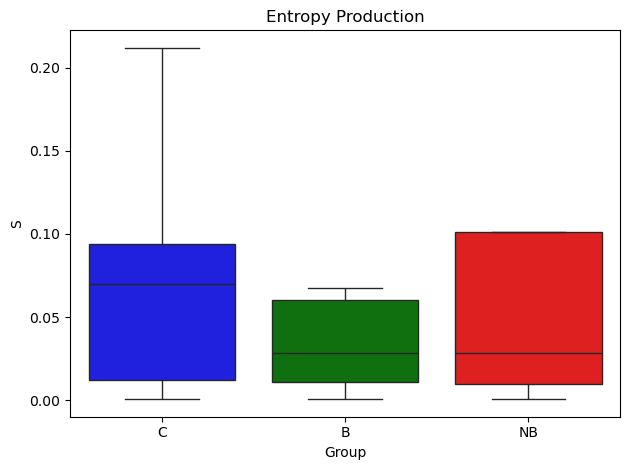

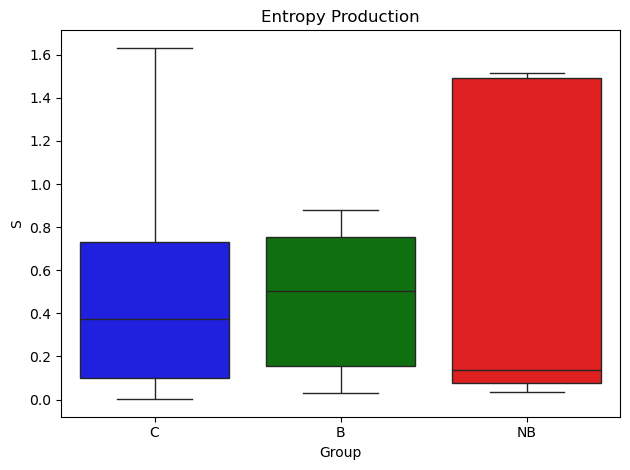

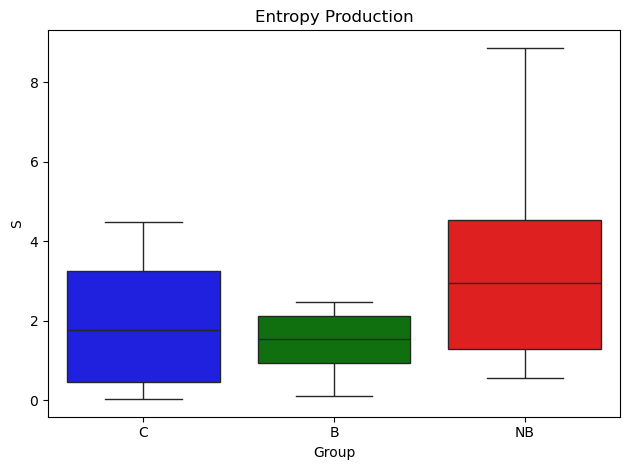

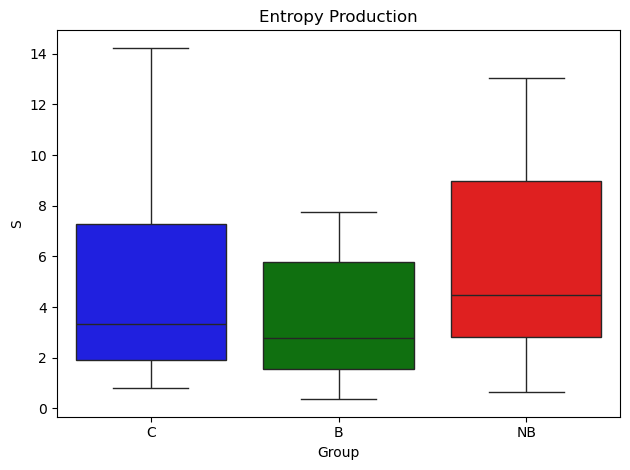

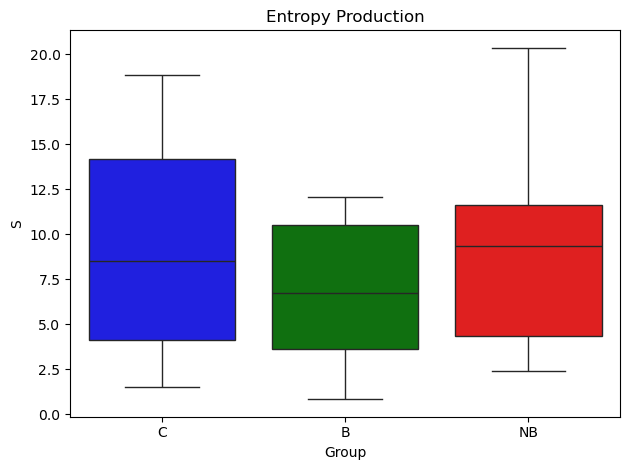

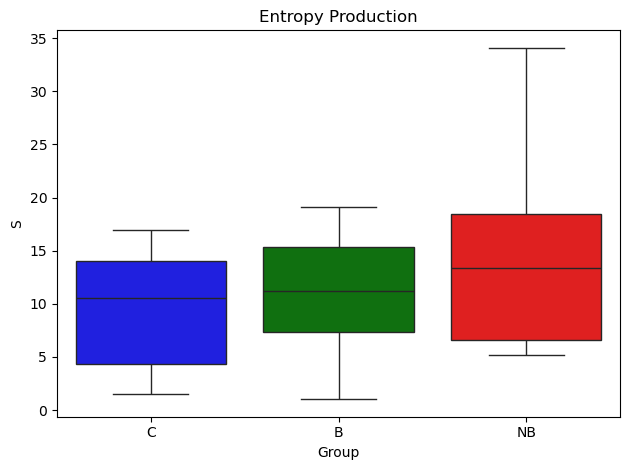

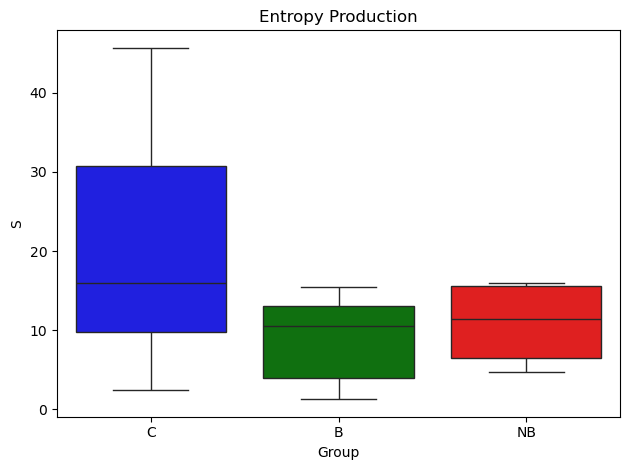

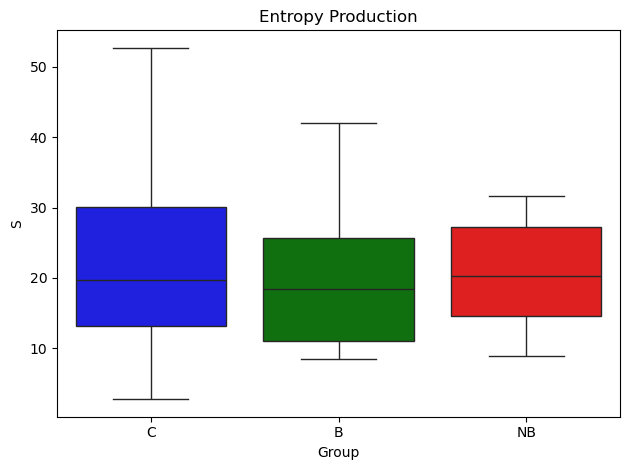

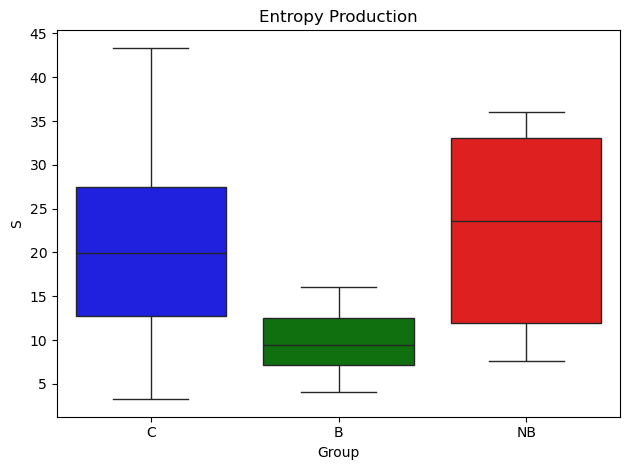

In [75]:
# COMPUTE ENTROPY PRODUCTION RATE

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))


#############
## FORWARD ##
#############

for i,K in enumerate(range(2,10+1)): # Loop over K
    prob_trans_list = prob_trans_list_allK[i]

    # Controls , Blindsight, No-blindsight
    eps = 0.00000000001
    Ss_for = []
    for ms in prob_trans_list:
        S = []
        for m in ms:
            m = m+eps
            s = 0
            for i in range(m.shape[0]):
                for j in range(m.shape[1]):
                    if i!=j: # Remove loop transition when compute transition probability
                        s_ = m[i,j]*np.log(m[i,j]/m[j,i])
                        s += s_
    #         print(s)
            S.append(s)
        Ss_for.append(S)
        
        
    ## METTERE TUTTO IN UN MINCHIA DI DATAFRAME    
    datacane = pd.DataFrame({'S':Ss_for[0]+Ss_for[1]+Ss_for[2],
                             'Group':['C']*len(Ss_for[0])+['B']*len(Ss_for[1])+['NB']*len(Ss_for[2])})

    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    hue_plot_params = {
        'data': datacane,
        'x': 'Group',
        'y': 'S',
        "palette": my_pal,
    }
        
    fig, ax = plt.subplots(1,1)
    plt.title('Entropy Production')
    bp = sns.boxplot(ax=ax, **hue_plot_params, showfliers=False)
    
    # Add annotations
    pairs= [('C','B'), ('C','NB'), ('B','NB')]
    # annotator = Annotator(ax, pairs, **hue_plot_params)
    # annamobbene = annotator.configure(test=annot_test).apply_and_annotate()
    plt.tight_layout()
    # plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+'Entropy_'+ \
    #             '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
    #             dpi=200)
    
    # ##############
    # ## BACKWARD ##
    # ##############
    
    # # Controls , Blindsight, No-blindsight
    # eps = 0.00000000001
    # Ss_back = []
    # for ms in prob_trans_list_back:
    #     S = []
    #     for m in ms:
    #         m = m+eps
    #         s = 0
    #         for i in range(m.shape[0]):
    #             for j in range(m.shape[1]):
    #                 if i!=j: # Remove loop transition when compute transition probability
    #                     s_ = m[i,j]*np.log(m[i,j]/m[j,i])
    #                     s += s_
    # #         print(s)
    #         S.append(s)
    #     Ss_back.append(S)
        
    # fig = plt.figure()
    # plt.title('Entropy Production - Backward')
    # bp = plt.boxplot(Ss_back,
    #                  patch_artist=True,
    #                  labels=['C', 'B', 'NB'],
    #                  showfliers=False)
    # bp['boxes'][0].set_facecolor('blue')
    # bp['boxes'][1].set_facecolor('green')
    # bp['boxes'][2].set_facecolor('red')
    
    # # t-tests 
    # print(ttest_ind(Ss_back[0], Ss_back[1]))
    # print(ttest_ind(Ss_back[0], Ss_back[2]))
    # print(ttest_ind(Ss_back[1], Ss_back[2]))
    # print('\n')
        
    # plt.legend([bp["boxes"][0], bp["boxes"][1], bp["boxes"][2]], 
    #            ['Controls','Blindsight','No-Blindsight'], 
    #            loc='upper right')
    
    
    # # Subject-wise different between entropy productions
    # #Loop over groups
    # Ss_diff = []
    # for i in range(len(Ss_for)):
    #     group = []
    #     for f,b in zip(Ss_for[i],Ss_back[i]):
    #         group.append(np.abs(f-b))
    #     Ss_diff.append(group)
    
    # fig = plt.figure()
    # plt.title('Irreversibility rate')
    # bp = plt.boxplot(Ss_diff,
    #                  patch_artist=True,
    #                  labels=['C', 'B', 'NB'])
    # bp['boxes'][0].set_facecolor('blue')
    # bp['boxes'][1].set_facecolor('green')
    # bp['boxes'][2].set_facecolor('red')
    
    # # t-tests 
    # print(ttest_ind(Ss_diff[0], Ss_diff[1]))
    # print(ttest_ind(Ss_diff[0], Ss_diff[2]))
    # print(ttest_ind(Ss_diff[1], Ss_diff[2]))
    # print('\n')
        
    # plt.legend([bp["boxes"][0], bp["boxes"][1], bp["boxes"][2]], 
    #            ['Controls','Blindsight','No-Blindsight'], 
    #            loc='upper right')
    # break

# Correlation with behavioral data (with covariates)

In [161]:
import pingouin as pg
from pingouin.effsize import compute_esci
from pingouin.utils import remove_na, _perm_pval, _postprocess_dataframe
from pingouin.bayesian import bayesfactor_pearson

def _correl_pvalue(r, n, k=0, alternative="two-sided"):
    """Compute the p-value of a correlation coefficient.

    https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.pearsonr.html
    https://en.wikipedia.org/wiki/Pearson_correlation_coefficient#Using_the_exact_distribution

    See also scipy.stats._ttest_finish

    Parameters
    ----------
    r : float
        Correlation coefficient.
    n : int
        Sample size
    k : int
        Number of covariates for (semi)-partial correlation.
    alternative : string
        Tail of the test.

    Returns
    -------
    pval : float
        p-value.

    Notes
    -----
    This uses the same approach as :py:func:`scipy.stats.pearsonr` to calculate
    the p-value (i.e. using a beta distribution)
    """
    from scipy.stats import t

    assert alternative in [
        "two-sided",
        "greater",
        "less",
    ], "Alternative must be one of 'two-sided' (default), 'greater' or 'less'."

    # Method 1: using a student T distribution
    dof = n - k - 2
    tval = r * np.sqrt(dof / (1 - r**2))
    if alternative == "less":
        pval = t.cdf(tval, dof)
    elif alternative == "greater":
        pval = t.sf(tval, dof)
    elif alternative == "two-sided":
        pval = 2 * t.sf(np.abs(tval), dof)

    # Method 2: beta distribution (similar to scipy.stats.pearsonr, faster)
    # from scipy.special import btdtr
    # ab = (n - k) / 2 - 1
    # pval = 2 * btdtr(ab, ab, 0.5 * (1 - abs(np.float64(r))))
    return pval

In [162]:
def partial_corr(
    data=None,
    x=None,
    y=None,
    covar=None,
    x_covar=None,
    y_covar=None,
    alternative="two-sided",
    method="pearson",
):

    from pingouin.utils import _flatten_list

    # Safety check
    assert alternative in [
        "two-sided",
        "greater",
        "less",
    ], "Alternative must be one of 'two-sided' (default), 'greater' or 'less'."
    assert method in [
        "pearson",
        "spearman",
    ], 'only "pearson" and "spearman" are supported for partial correlation.'
    assert isinstance(data, pd.DataFrame), "data must be a pandas DataFrame."
    assert data.shape[0] > 2, "Data must have at least 3 samples."
    if covar is not None and (x_covar is not None or y_covar is not None):
        raise ValueError("Cannot specify both covar and {x,y}_covar.")
    if x_covar is not None and y_covar is not None:
        raise ValueError("Cannot specify both x_covar and y_covar.")
    assert x != y, "x and y must be independent"
    if isinstance(covar, list):
        assert x not in covar, "x and covar must be independent"
        assert y not in covar, "y and covar must be independent"
    else:
        assert x != covar, "x and covar must be independent"
        assert y != covar, "y and covar must be independent"
    # Check that columns exist
    col = _flatten_list([x, y, covar])
    assert all([c in data for c in col]), "columns are not in dataframe."
    # Check that columns are numeric
    assert all([data[c].dtype.kind in "bfiu" for c in col])

    # Drop rows with NaN
    data = data[col].dropna()
    n = data.shape[0]  # Number of samples
    k = data.shape[1] - 2  # Number of covariates
    assert n > 2, "Data must have at least 3 non-NAN samples."

    # Calculate the partial corrrelation matrix - similar to pingouin.pcorr()
    if method == "spearman":
        # Convert the data to rank, similar to R cov()
        V = data.rank(na_option="keep").cov(numeric_only=True)
    else:
        V = data.cov(numeric_only=True)
    Vi = np.linalg.pinv(V, hermitian=True)  # Inverse covariance matrix
    Vi_diag = Vi.diagonal()
    D = np.diag(np.sqrt(1 / Vi_diag))
    pcor = -1 * (D @ Vi @ D)  # Partial correlation matrix

    if covar is not None:
        r = pcor[0, 1]
    else:
        # Semi-partial correlation matrix
        with np.errstate(divide="ignore"):
            spcor = (
                pcor
                / np.sqrt(np.diag(V))[..., None]
                / np.sqrt(np.abs(Vi_diag - Vi**2 / Vi_diag[..., None])).T
            )
        if y_covar is not None:
            r = spcor[0, 1]  # y_covar is removed from y
        else:
            r = spcor[1, 0]  # x_covar is removed from x

    if np.isnan(r):
        # Correlation failed. Return NaN. When would this happen?
        return pd.DataFrame({"n": n, "r": np.nan, "CI95%": np.nan, "p-val": np.nan}, index=[method])

    # Compute the two-sided p-value and confidence intervals
    # https://online.stat.psu.edu/stat505/lesson/6/6.3
    pval = _correl_pvalue(r, n, k, alternative)
    ci = compute_esci(
        stat=r, nx=(n - k), ny=(n - k), eftype="r", decimals=6, alternative=alternative
    )

    # Create dictionnary
    stats = {
        "n": n,
        "r": r,
        "CI95%": [ci],
        "p-val": pval,
    }

    # Convert to DataFrame
    stats = pd.DataFrame(stats, index=[method])

    # Define order
    col_keep = ["n", "r", "CI95%", "p-val"]
    col_order = [k for k in col_keep if k in stats.keys().tolist()]
    return _postprocess_dataframe(stats)[col_order]


In [163]:
# Multiple dim partial correlation from scratch. 
# Ref: https://en.wikipedia.org/wiki/Partial_correlation ; https://datatab.net/tutorial/partial-correlation
from scipy.stats import zscore
from scipy.stats import norm # to compute p-value
from sklearn.utils import shuffle

def compute_res(var1, var2):
    var1 = sm.add_constant(var1)  # adding a constant
    model = sm.OLS(var1, var2).fit()
    # print(model.resid[:,1])
    return model.resid[:,1]

def one_dim_par_cor(X, Y, Z):
    e_X = compute_res(X, Z)
    e_Y = compute_res(Y, Z)
    return pearsonr(e_X, e_Y)[0]

def null_model_distrib(X, Y, Z1, Z2, n_rep):
    # just shuffle everything and compute a distribution of statistics
    r_xy_Z_dist = []
    for _ in range(n_rep):
        X_r = shuffle(np.copy(X))
        Y_r = shuffle(np.copy(Y))
        Z1_r = shuffle(np.copy(Z1))
        Z2_r = shuffle(np.copy(Z2))

        r_xy_z2 = one_dim_par_cor(X_r, Y_r, Z2_r)
        r_xz1_z2 = one_dim_par_cor(X_r, Z1_r, Z2_r)
        r_z1y_z2 = one_dim_par_cor(Z1_r, Y_r, Z2_r)

        r = (r_xy_z2 - r_xz1_z2*r_z1y_z2)/(np.sqrt(1-r_xz1_z2**2)*np.sqrt(1-r_z1y_z2**2))    
        r_xy_Z_dist.append( r )
    return r_xy_Z_dist
    

def two_dim_par_corr(X, Y, Z1, Z2):
    # print(X, Y, Z1, Z2)
    r_xy_z2 = one_dim_par_cor(X,Y,Z2)
    r_xz1_z2 = one_dim_par_cor(X,Z1,Z2)
    r_z1y_z2 = one_dim_par_cor(Z1,Y,Z2)

    r_xy_Z = (r_xy_z2 - r_xz1_z2*r_z1y_z2)/(np.sqrt(1-r_xz1_z2**2)*np.sqrt(1-r_z1y_z2**2))

    return r_xy_Z    

def two_dim_par_corr_fullstat(X, Y, Z1, Z2, n_rep):
    dist = null_model_distrib(X, Y, Z1, Z2, n_rep)
    # print(dist)
    stat = two_dim_par_corr(X, Y, Z1, Z2)
    dist = dist + [stat] 
    # print(dist)
    # print(zscore(dist))
    zs_stat = zscore(dist)[-1]
    p_val = norm.sf(abs(zs_stat))*2
    

    return zs_stat, p_val

# stats = []
# p_vals = []
# for _ in range(10):
#     res = two_dim_par_corr_fullstat(my_df['behav'].values, my_df['prob'].values, my_df['age'].values, my_df['tstroke'].values, 5000)
#     stats.append(res[0])
#     p_vals.append(res[1])

(16, 2, 2)
0.7152744697933425
-0.35665588971757495
0.4090874180031412
0.7112365630604212
[[ 0.71527447 -0.35665589]
 [ 0.40908742  0.71123656]]
[[0.65392455 0.01509743]
 [0.7755491  0.68431218]]
(16, 3, 3)
0.7222947100145539
-0.39130801790302777
-0.07747001703604274
0.3623072365573524
0.7162257838026911
0.2548003962865272
-0.18762987171508347
0.436162812780259
0.093284434738435
[[ 0.72229471 -0.39130802 -0.07747002]
 [ 0.36230724  0.71622578  0.2548004 ]
 [-0.18762987  0.43616281  0.09328443]]
[[0.61833608 0.01229489 0.43729474]
 [0.55633587 0.63429241 0.76859083]
 [0.08699577 0.19658745 0.20535779]]
(16, 4, 4)
0.7236367119399527
-0.1781945799503732
-0.25746672794126063
-0.11843845497076089
0.35368100793982016
0.7091713030016172
0.2371965534487895
0.3008961335370994
-0.03288757215532863
0.44346160582646077
0.14856370715420963
-0.604133617861432
0.2697495368735718
-0.33011220516625117
-0.1398377814499882
0.5089588483316774
[[ 0.72363671 -0.17819458 -0.25746673 -0.11843845]
 [ 0.35368101


KeyboardInterrupt



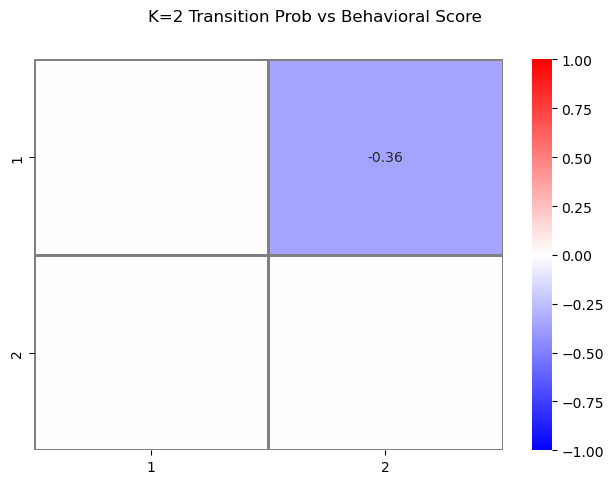

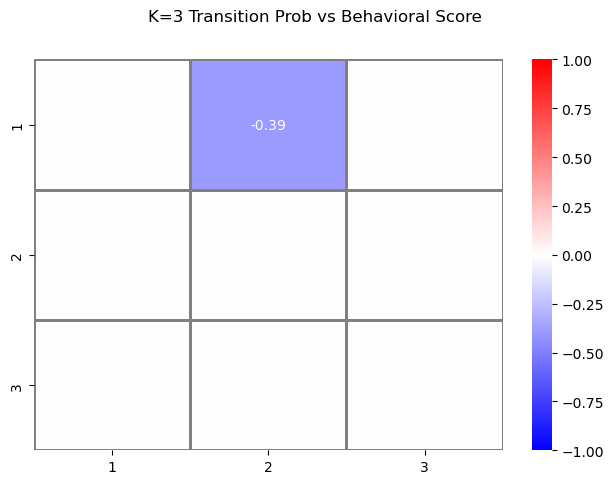

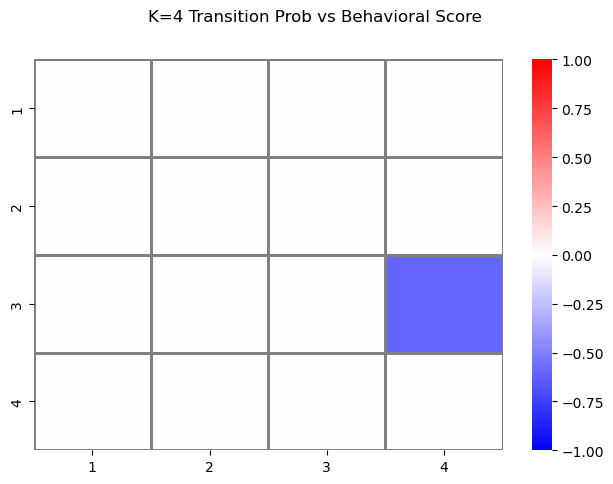

In [75]:
%%time

n_rep= 5000

cov_df = pd.read_csv("../data/covariates/covariates.csv",delimiter=",")
age_B = cov_df.loc[classif.loc[classif['CLASS']=='B'].index]['Age'].values
age_NB = cov_df.loc[classif.loc[classif['CLASS']=='NB'].index]['Age'].values
tstroke_B = cov_df.loc[classif.loc[classif['CLASS']=='B'].index]['Time since stroke (months)'].values
tstroke_NB = cov_df.loc[classif.loc[classif['CLASS']=='NB'].index]['Time since stroke (months)'].values
# age_B, age_NB, tstroke_B, tstroke_NB

B_behav = []
NB_behav = []

class_vals = classif['CLASS'].values
Behav = classif['CLASS'].values

res = classif['Average % correct task'].values[:19]
res = [float(r) for r in res]
for i,r in enumerate(res):
    if class_vals[i]=='B': 
        B_behav.append(r)
    elif class_vals[i]=='NB':
        NB_behav.append(r)

behav = []
behav.append(B_behav)
behav.append(NB_behav)

behavs = behav[0] + behav[1]
age = list(age_B) + list(age_NB)
tstroke = list(tstroke_B) + list(tstroke_NB)



for i,K in enumerate(range(2,10+1)): # Loop over K
    state_names = [i+1 for i in range(K)]
    prob_trans_list = prob_trans_list_allK[i]

    pat_prob_trans = np.concatenate((prob_trans_list[1], prob_trans_list[2])) # Only patients, no controls
    print(pat_prob_trans.shape)
    
    corr_matrix = np.zeros(pat_prob_trans.shape[1:])
    p_matrix = np.zeros(pat_prob_trans.shape[1:])
    x = B_behav + NB_behav

    for i in range(K):
        for j in range(K):
            y = pat_prob_trans[:,i,j]
            my_df = pd.DataFrame.from_dict({'behav':x, 'prob':pat_prob_trans[:,i,j], 'age':age, 'tstroke':tstroke})
            stat, p_val = two_dim_par_corr_fullstat(my_df['behav'].values, my_df['prob'].values, my_df['age'].values, my_df['tstroke'].values, n_rep)
            stat = two_dim_par_corr(my_df['behav'].values, my_df['prob'].values, my_df['age'].values, my_df['tstroke'].values)
            print(stat)
            corr_matrix[i,j] = stat
            p_matrix[i,j] = p_val
            
    print(corr_matrix)
    print(p_matrix)
    
            
    fig, ax = plt.subplots(1)
    my_sup = plt.suptitle('K='+str(K)+' Transition Prob vs Behavioral Score', y=1)
    
    # display only significative values
    for i in range(K):
        for j in range(K):
            if p_matrix[i][j]>=0.05:
                corr_matrix[i][j]=0
    
    sns.heatmap(corr_matrix, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
                ax=ax, vmin=-1, vmax=1, linecolor='grey');
    for t in ax.texts:
        if float(t.get_text())!=0:
            t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
        else:
            t.set_text("") # if not it sets an empty text
    
    plt.tight_layout()

    # plt.savefig('output/MD_05122023/K'+str(K)+'/TransProbVsBehav_Cov_K'+str(K)+'_nrep_test_'+str(n_rep)+'_'+baseline_fig_label[BASELINE]+'.png',
    #         dpi=200)


In [155]:
import statsmodels.api as sm

(16, 2, 2)
[[ 0.377 -0.377]
 [-0.251  0.251]]
[[0.166 0.166]
 [0.367 0.367]]
(16, 3, 3)
[[ 0.354 -0.397 -0.305]
 [-0.12   0.23  -0.083]
 [-0.635  0.035 -0.299]]
[[0.195 0.143 0.269]
 [0.669 0.409 0.77 ]
 [0.011 0.903 0.28 ]]
(16, 4, 4)
[[ 0.398 -0.274 -0.414 -0.288]
 [-0.018  0.214 -0.02   0.05 ]
 [-0.543 -0.015 -0.363 -0.317]
 [ 0.001 -0.027 -0.439  0.155]]
[[0.141 0.324 0.125 0.299]
 [0.949 0.444 0.943 0.859]
 [0.037 0.958 0.184 0.25 ]
 [0.996 0.923 0.101 0.582]]
(16, 5, 5)
[[ 0.403 -0.079  0.193 -0.22  -0.413]
 [-0.053  0.124 -0.211  0.015  0.066]
 [ 0.368 -0.012  0.372 -0.144 -0.008]
 [-0.382 -0.009 -0.271 -0.365 -0.046]
 [-0.336  0.262  0.148 -0.429  0.192]]
[[0.136 0.778 0.492 0.431 0.126]
 [0.852 0.66  0.449 0.959 0.814]
 [0.178 0.967 0.172 0.61  0.979]
 [0.16  0.974 0.329 0.181 0.872]
 [0.221 0.346 0.598 0.111 0.492]]
(16, 6, 6)
[[ 0.354 -0.098 -0.079  0.053  0.22  -0.413]
 [ 0.033  0.198 -0.27  -0.152  0.128  0.55 ]
 [-0.379 -0.542 -0.449  0.226 -0.271  0.051]
 [-0.069  0.254 

/tmp/ipykernel_5477/1477907193.py:57: RuntimeWarning: divide by zero encountered in divide
  D = np.diag(np.sqrt(1 / Vi_diag))
/tmp/ipykernel_5477/1477907193.py:58: RuntimeWarning: invalid value encountered in matmul
  pcor = -1 * (D @ Vi @ D)  # Partial correlation matrix
/tmp/ipykernel_5477/1477907193.py:57: RuntimeWarning: divide by zero encountered in divide
  D = np.diag(np.sqrt(1 / Vi_diag))
/tmp/ipykernel_5477/1477907193.py:58: RuntimeWarning: invalid value encountered in matmul
  pcor = -1 * (D @ Vi @ D)  # Partial correlation matrix
/tmp/ipykernel_5477/1477907193.py:57: RuntimeWarning: divide by zero encountered in divide
  D = np.diag(np.sqrt(1 / Vi_diag))
/tmp/ipykernel_5477/1477907193.py:58: RuntimeWarning: invalid value encountered in matmul
  pcor = -1 * (D @ Vi @ D)  # Partial correlation matrix
/tmp/ipykernel_5477/1477907193.py:57: RuntimeWarning: divide by zero encountered in divide
  D = np.diag(np.sqrt(1 / Vi_diag))
/tmp/ipykernel_5477/1477907193.py:58: RuntimeWarnin

[[ 0.179  0.577 -0.23   0.027 -0.382 -0.545  0.012 -0.053 -0.093 -0.138]
 [ 0.083  0.183 -0.018  0.324  0.073 -0.391    nan -0.244 -0.381  0.114]
 [ 0.041 -0.352  0.179  0.052 -0.113    nan  0.471 -0.112  0.034 -0.014]
 [   nan -0.041  0.22   0.462  0.107 -0.099 -0.445  0.041 -0.364  0.053]
 [-0.08  -0.149 -0.148  0.055 -0.237  0.183  0.192 -0.225  0.208 -0.266]
 [-0.23  -0.322 -0.315 -0.097  0.068 -0.265  0.344    nan -0.315  0.094]
 [   nan  0.282  0.088  0.473 -0.061    nan  0.177 -0.053 -0.223    nan]
 [ 0.312 -0.259    nan -0.009 -0.15   0.107    nan  0.014  0.344 -0.279]
 [-0.228 -0.16  -0.149  0.023 -0.197    nan -0.238  0.114 -0.065 -0.382]
 [   nan  0.16  -0.305 -0.064 -0.351  0.251 -0.233 -0.396 -0.14  -0.481]]
[[0.523 0.024 0.409 0.924 0.16  0.036 0.967 0.851 0.743 0.625]
 [0.77  0.514 0.948 0.239 0.797 0.15    nan 0.381 0.161 0.685]
 [0.885 0.198 0.524 0.854 0.688   nan 0.076 0.691 0.903 0.962]
 [  nan 0.885 0.431 0.083 0.704 0.727 0.096 0.885 0.182 0.851]
 [0.778 0.597 0.5

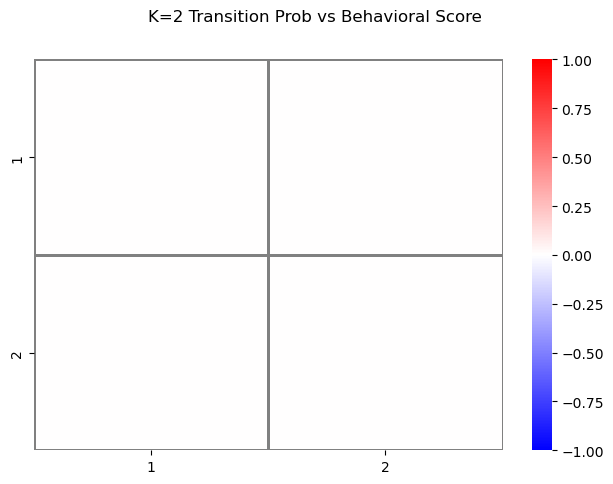

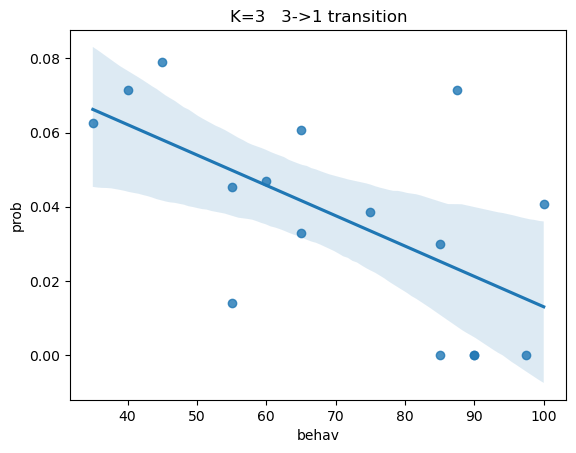

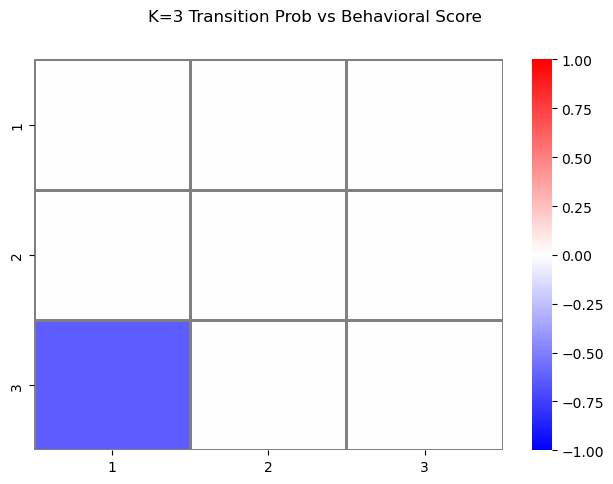

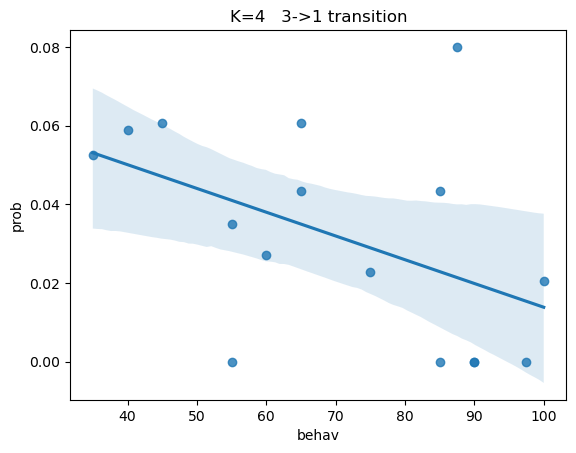

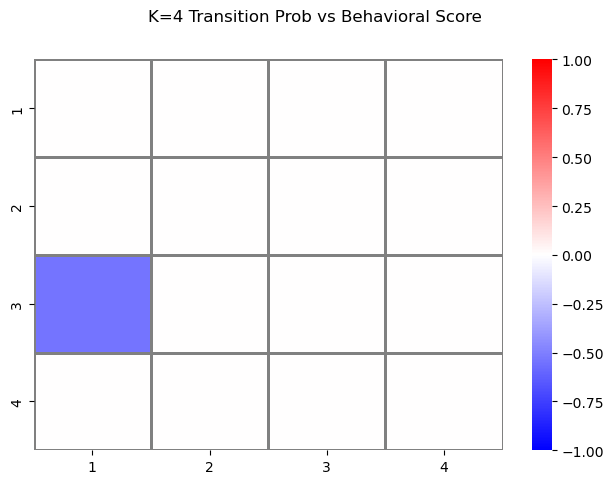

...

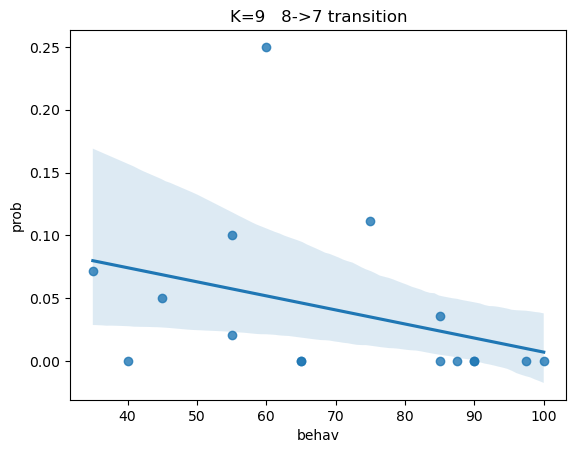

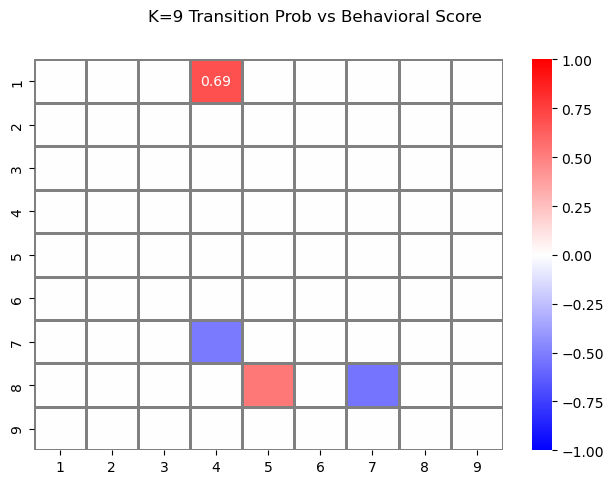

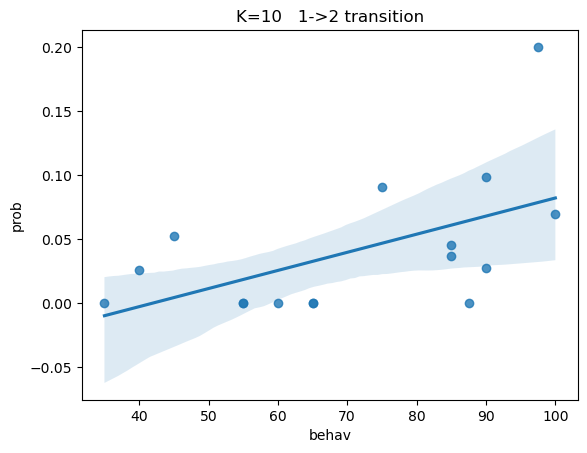

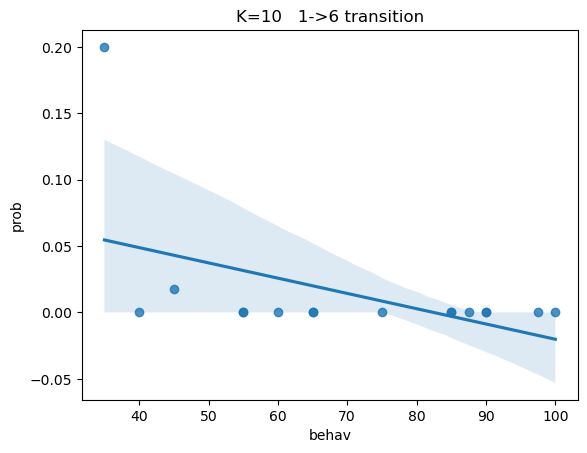

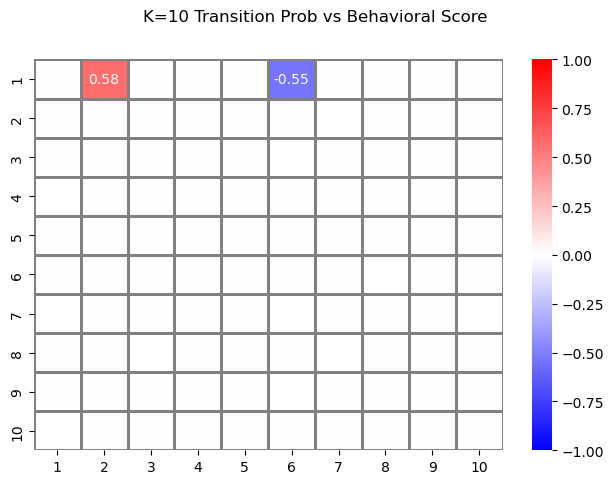

In [167]:
%%time

n_rep= 5000

cov_df = pd.read_csv("../data/covariates/covariates.csv",delimiter=",")
age_B = cov_df.loc[classif.loc[classif['CLASS']=='B'].index]['Age'].values
age_NB = cov_df.loc[classif.loc[classif['CLASS']=='NB'].index]['Age'].values
tstroke_B = cov_df.loc[classif.loc[classif['CLASS']=='B'].index]['Time since stroke (months)'].values
tstroke_NB = cov_df.loc[classif.loc[classif['CLASS']=='NB'].index]['Time since stroke (months)'].values
# age_B, age_NB, tstroke_B, tstroke_NB

B_behav = []
NB_behav = []

class_vals = classif['CLASS'].values
Behav = classif['CLASS'].values

res = classif['Average % correct task'].values[:19]
res = [float(r) for r in res]
for i,r in enumerate(res):
    if class_vals[i]=='B': 
        B_behav.append(r)
    elif class_vals[i]=='NB':
        NB_behav.append(r)

behav = []
behav.append(B_behav)
behav.append(NB_behav)

behavs = behav[0] + behav[1]
age = list(age_B) + list(age_NB)
tstroke = list(tstroke_B) + list(tstroke_NB)



for i,K in enumerate(range(2,10+1)): # Loop over K
    state_names = [i+1 for i in range(K)]
    prob_trans_list = prob_trans_list_allK[i]

    pat_prob_trans = np.concatenate((prob_trans_list[1], prob_trans_list[2])) # Only patients, no controls
    print(pat_prob_trans.shape)
    
    corr_matrix = np.zeros(pat_prob_trans.shape[1:])
    p_matrix = np.zeros(pat_prob_trans.shape[1:])
    x = B_behav + NB_behav

    for i in range(K):
        for j in range(K):
            y = pat_prob_trans[:,i,j]
            my_df = pd.DataFrame.from_dict({'behav':x, 'prob':pat_prob_trans[:,i,j], 'age':age, 'tstroke':tstroke})
            pc = partial_corr(data=my_df, x='behav', y='prob', covar=['tstroke'],method="spearman").round(3)
            # pc = pg.corr(x=my_df['behav'], y=my_df['prob'], method="spearman").round(3)

            stat = pc['r'].values[0]
            p_val = pc['p-val'].values[0]
            corr_matrix[i,j] = stat
            p_matrix[i,j] = p_val

            # Plot the regression
            if p_val<=0.05:
                fig = plt.figure()
                sns.regplot(data=my_df, x='behav', y='prob')
                plt.title('K='+str(K)+'   '+str(i+1)+'->'+str(j+1)+' transition')
                plt.savefig('output/MD_05122023/K'+str(K)+'/TransProbVsBehav_reg_K'+str(K)+'_nrep_test_'+str(n_rep)+'_'+baseline_fig_label[BASELINE]+'.png',
                        dpi=200)
                
    print(corr_matrix)   
    print(p_matrix)
            
    fig, ax = plt.subplots(1)
    my_sup = plt.suptitle('K='+str(K)+' Transition Prob vs Behavioral Score', y=1)
    
    # display only significative values
    for i in range(K):
        for j in range(K):
            if p_matrix[i][j]>=0.05:
                corr_matrix[i][j]=0
    
    sns.heatmap(corr_matrix, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
                ax=ax, vmin=-1, vmax=1, linecolor='grey');
    for t in ax.texts:
        if float(t.get_text())!=0:
            t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
        else:
            t.set_text("") # if not it sets an empty text
    
    plt.tight_layout()

    # plt.savefig('output/MD_05122023/K'+str(K)+'/TransProbVsBehav_Cov_K'+str(K)+'_nrep_test_'+str(n_rep)+'_'+baseline_fig_label[BASELINE]+'.png',
    #         dpi=200)

# Correlation with behavioral data (old)

[[-0.03238138]]
PEARSON PearsonRResult(statistic=-0.1023216937666043, pvalue=0.7061152539642324)


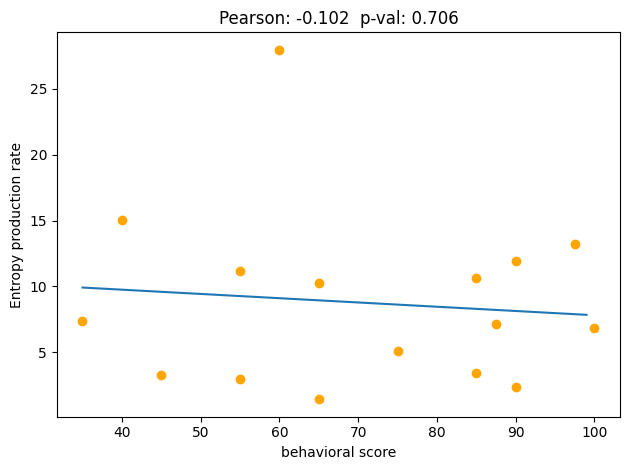

In [124]:
# PLOT ENTROPY PRODUCTION RATE WITH RESPECT TO BEAHVIORAL DATA
# Load beahvioral data

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))


B_behav = []
NB_behav = []

class_vals = classif['CLASS'].values
Behav = classif['CLASS'].values

res = classif['Average % correct task'].values[:19]
res = [float(r) for r in res]
for i,r in enumerate(res):
    if class_vals[i]=='B': 
        B_behav.append(r)
    elif class_vals[i]=='NB':
        NB_behav.append(r)

behav = []
behav.append(B_behav)
behav.append(NB_behav)


fig = plt.figure()
behavs = behav[0] + behav[1]
Ss = []
for i,S in enumerate(Ss_for[1:]):
    plt.xlabel('behavioral score')
    plt.ylabel('Entropy production rate')
    Ss = Ss + S
    plt.scatter(behav[i], S, color='orange')
# plt.grid();

# Linear regresison
# reg = sm.OLS(behavs, Ss)
# reg_fit = reg.fit(behavs, Ss)
# p_values = reg_fit.summary2().tables[1]['P>|t|']
# # print(reg_fit.summary2())
# print(p_values)

regressor = LinearRegression() 
regressor.fit(np.asarray(behavs).reshape(-1, 1), np.asarray(Ss).reshape(-1, 1))
y_pred = regressor.predict(np.arange(np.min(behavs),np.max(behavs)).reshape(-1, 1))
plt.plot(np.arange(np.min(behavs),np.max(behavs)), y_pred[:,0])
print(regressor.coef_)
pirso = pearsonr(behavs, Ss)
print('PEARSON', pirso)
plt.title('Pearson: {}  p-val: {}'.format(round(pirso[0], 3), round(pirso[1], 3)))


# PLOT LIFETIME WITH RESPECT TO BEAHVIORAL DATA
plt.tight_layout()
# plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+'EntropyVSbehavioral_'+ \
#             '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
#             dpi=200)

(16, 3, 3)
(16, 4, 4)
(16, 5, 5)


/home/alessio/miniconda3/envs/bs_laido/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


(16, 6, 6)


/home/alessio/miniconda3/envs/bs_laido/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


(16, 7, 7)


/home/alessio/miniconda3/envs/bs_laido/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


(16, 8, 8)


/home/alessio/miniconda3/envs/bs_laido/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


(16, 9, 9)


/home/alessio/miniconda3/envs/bs_laido/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


(16, 10, 10)


/home/alessio/miniconda3/envs/bs_laido/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


(16, 11, 11)


/home/alessio/miniconda3/envs/bs_laido/lib/python3.12/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


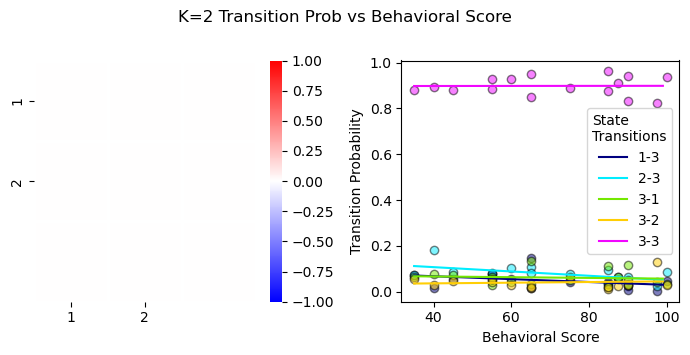

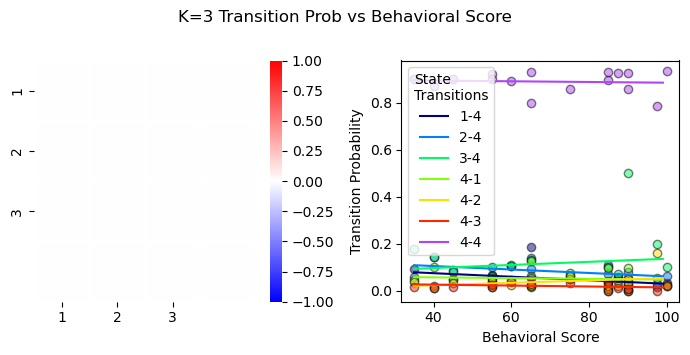

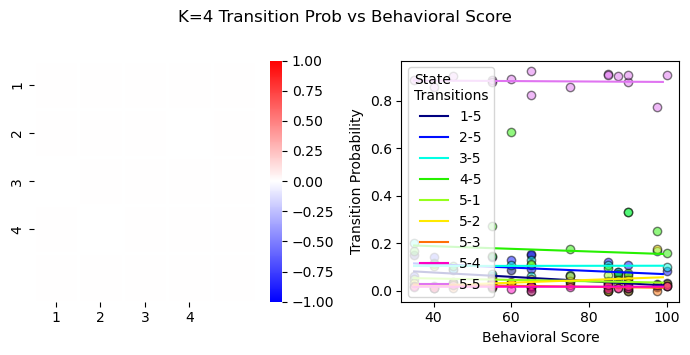

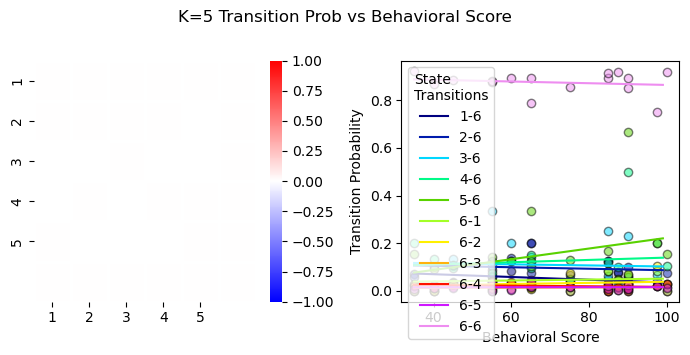

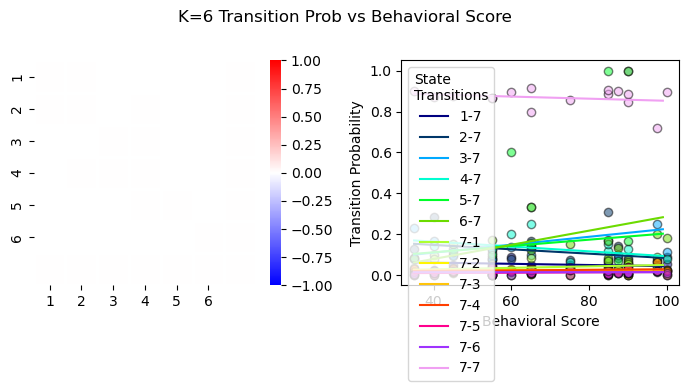

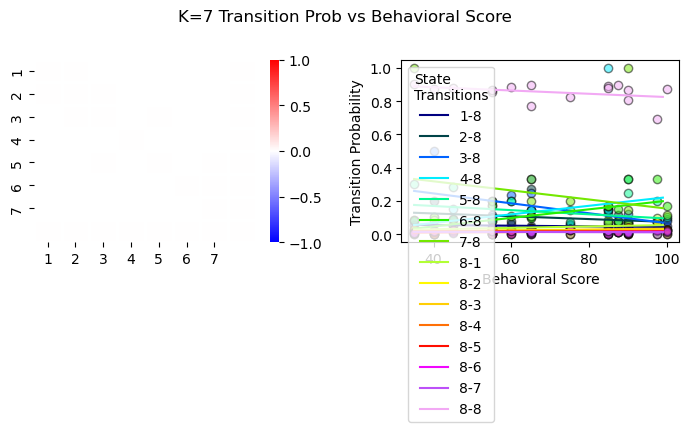

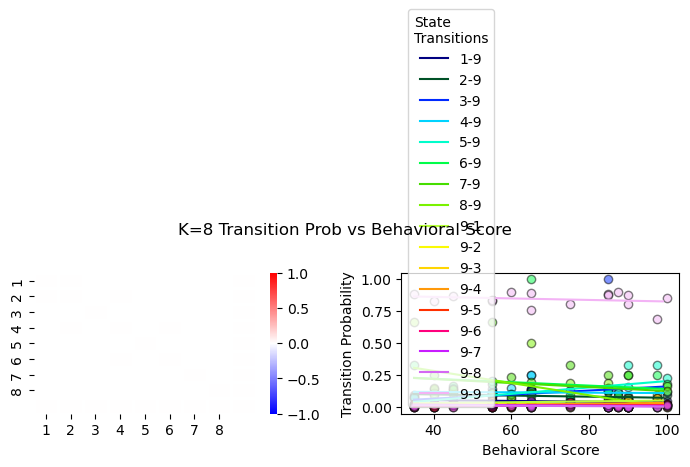

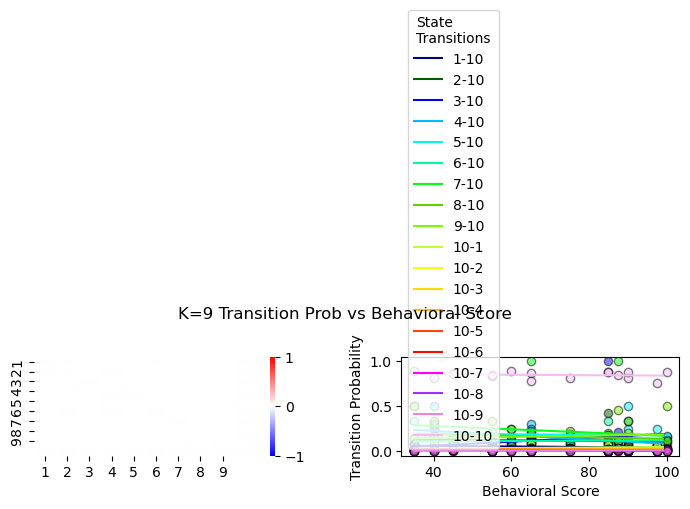

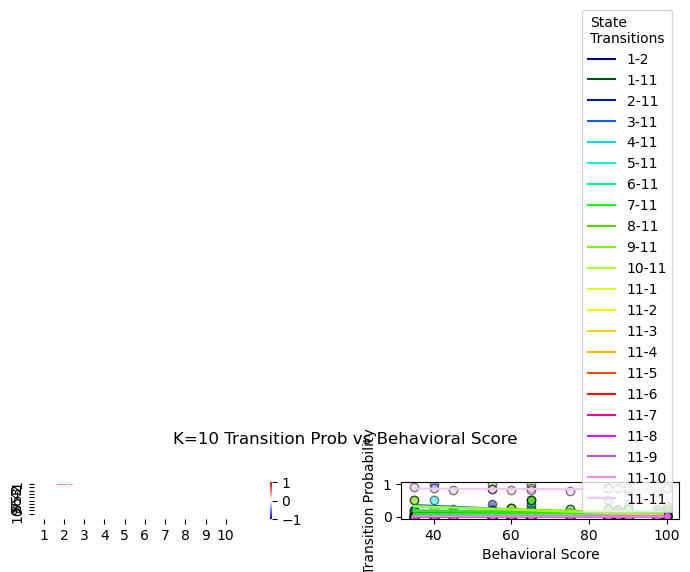

In [58]:
# TRANSITION PROBABILITIES with respect to behavioral data

# today = date.today()
# DATE = today.strftime("%d%m%Y")
# # checking if the directory exists or not
# if not os.path.exists('output/GraphAnal/'+DATE+'/K'+str(K)):
      
#     # if the demo_folder directory is not present 
#     # then create it.
#     os.makedirs('output/GraphAnal/'+DATE+'/K'+str(K))
import pingouin as pg
B_behav = []
NB_behav = []

class_vals = classif['CLASS'].values
Behav = classif['CLASS'].values

res = classif['Average % correct task'].values[:19]
res = [float(r) for r in res]
for i,r in enumerate(res):
    if class_vals[i]=='B': 
        B_behav.append(r)
    elif class_vals[i]=='NB':
        NB_behav.append(r)

behav = []
behav.append(B_behav)
behav.append(NB_behav)

behavs = behav[0] + behav[1]



for i,K in enumerate(range(2,10+1)): # Loop over K
    state_names = [i+1 for i in range(K)]
    prob_trans_list = prob_trans_list_allK[i]

    pat_prob_trans = np.concatenate((prob_trans_list[1], prob_trans_list[2])) # Only patients, no controls
    print(pat_prob_trans.shape)
    
    corr_matrix = np.zeros(pat_prob_trans.shape[1:])
    p_matrix = np.zeros(pat_prob_trans.shape[1:])
    x = B_behav + NB_behav
    # fig = plt.figure()
    # plt.title('')
    for i in range(K):
        for j in range(K):
            y = pat_prob_trans[:,i,j]
    #         plt.scatter(x, y)
    #         plt.xlabel('behavioral score')
    #         plt.ylabel('Transition Probability')
    #         # LINEAR REGRESSION
    #         reg = sm.OLS(x, y)
    #         reg_fit = reg.fit()
    #         p_value = reg_fit.summary2().tables[1]['P>|t|']
            
    #         regressor = LinearRegression() 
    #         regressor.fit(np.asarray(x).reshape(-1, 1), np.asarray(y).reshape(-1, 1))
    #         y_pred = regressor.predict(np.asarray(x).reshape(-1, 1))
    #         corr_matrix[i,j] = regressor.coef_
    
            # PEARSON CORRELATION
    #         print(x)
    #         print(pearsonr(x,y))
    #         if pearsonr(x,y)[1]<=0.1:
            corr_matrix[i,j] = pearsonr(x,y)[0]
            p_matrix[i,j] = pearsonr(x,y)[1]
            
    #         plt.plot(x, y_pred[:,0], color=colors[i], label='State '+str(i+1))
    #         print(p_value)
    #         print(regressor.coef_)
    #         print('\n')
    fig, axs = plt.subplots(1,2, figsize=(7,3.5))
    my_sup = plt.suptitle('K='+str(K)+' Transition Prob vs Behavioral Score', y=1)
    
    # display only significative values
    for i in range(K):
        for j in range(K):
            if p_matrix[i][j]>=0.05:
                corr_matrix[i][j]=0
    
    sns.heatmap(corr_matrix, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='bwr', annot=True,
                ax=axs[0], vmin=-1, vmax=1);
    for t in axs[0].texts:
        if float(t.get_text())!=0:
            t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
        else:
            t.set_text("") # if not it sets an empty text
    
    # sns.heatmap(p_matrix, linewidth=0.8, xticklabels=state_names, yticklabels=state_names, cmap='Greens_r',
    #             annot=True, vmax=0.05, ax=axs[1])
    plt.tight_layout()
    # plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/TransProbVSbehavioral_Heat_'+ \
    #             '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
    #             dpi=200, bbox_extra_artists=[my_sup], bbox_inches='tight')
    
    
    cord = np.where(p_matrix<0.05)
    cmap = plt.cm.gist_ncar  # define the colormap
    plt.style.use('default')
    # plt.style.use('ggplot')
    en = 0
    for i,j in zip(cord[0], cord[1]):
        y = pat_prob_trans[:,i,j]
        ols = linear_model.LinearRegression()
        model = ols.fit(np.expand_dims(x,axis=1), np.expand_dims(y,axis=1))
        response = model.predict(np.expand_dims(np.arange(np.min(x),np.max(x),1), axis=1))
        axs[1].scatter(x,y, edgecolor='k', facecolor=cmap(en/cord[0].shape[0]),
                   alpha=0.5)
        ci = pg.compute_bootci(x,y, func='pearson', paired=True)
        
        plt.plot(np.expand_dims(np.arange(np.min(x),np.max(x),1), axis=1), response,
                 color=cmap(en/cord[0].shape[0]), label=str(i+1)+'-'+str(j+1),
                 alpha=1)
        plt.xlabel('Behavioral Score')
        plt.ylabel('Transition Probability')
        plt.legend(title='State\nTransitions')
        
        en += 1
    plt.tight_layout()
    # plt.savefig('output/GraphAnal/'+DATE+'/K'+str(K)+'/'+'TransProbVSbehavioral_Slope_'+ \
    #         '_npick'+str(n_pick)+'_nsamp'+str(n_samp)+'_'+DATE+'.png',
    #         dpi=200)
    break